In [1]:
from riotwatcher import LolWatcher, ApiError
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import kmeans_plusplus, KMeans
import numpy as np
from sklearn.metrics.cluster import silhouette_score, silhouette_samples
import matplotlib.cm as cm
from collections import Counter, defaultdict
from yellowbrick.cluster import KElbowVisualizer

In [73]:
api_key = "RGAPI-4b217c07-e528-4d1f-ab79-1cf58c002904"
lol_watcher = LolWatcher(api_key, default_status_v4=True)
my_region = "euw1"

In [74]:
versions = lol_watcher.data_dragon.versions_for_region(my_region)
champions_version = versions['n']['champion']

In [75]:
#current_champ_list = lol_watcher.data_dragon.champions(champions_version)
#print(current_champ_list)


Check the stats of a game:

In [76]:
match = lol_watcher.match.by_id(my_region, "EUW1_6175455388")
match
#EUW1_6170116709
#EUW1_6164277873

{'metadata': {'dataVersion': '2',
  'matchId': 'EUW1_6175455388',
  'participants': ['1v4IQY_1b0XCgbny-S3cXRxc_hJqVHrMOiCG6bT7lhWNqpgqQYwG_SgGwo7iMub8r6uhax_QgzN4GQ',
   '7HS50VY3iaba-RmnBHc03K70nyRCZD_-9u1iaw1bHrrI7O_eCWO3VK27PQYn57YKcsm7PvlO2cphRA',
   'ieESEhQa9K0sqW2iRMkg_AvaqzM1_NMeJc3oHqJSMQ1wkuDGyptmso6YjrJJ7AvlGLdxTPhyLTDQRg',
   'TK-lJgaeGtFACkbW7zz2pVF9fI1JFaRw0cblUKbwDoPk5bgBpxXXH3ziSt2GjfzCcF9VefqYnMnQfA',
   'zCV0qS_EYLseRbi75L_dEwWpd7pVV1fL9MJi7Lh9oz-u9yzOdY7S5Ccbbkt25nE17RNBGQcQl958CQ',
   'bxfGqWp1ZAA9d3NzBr8SGmjxmXFpTBd_mocaNmOzpIKEaEopC5CbIDvjS2wpMCeaX9PR4nkpRSrZoA',
   'QHZ6FNN0zDbaqmnXbWL3kpQj7jH5CerARLFD_lzEtzBs7dk1SYCmC82Wi4VzFxkDvY_yoaVa7nSDeg',
   '1FpN-mxkU4JBv5YCpVD2Pm-qeWy1VL23x3K5N5U-cQBnJM0K4mDVY9OJRvfBjSWUs1WOJto5p5leMA',
   'xevJ5ZpFKI8ufQaziEGlOBt78FnxgVVXi6j6Be1LsOKXbHriQeqTD570K-LogHErdUDYp-Md_hXNCw',
   '7B5Kq30hkh-H76sEYecQA5i32pONEcLsSI60COHrfTQIFHUga7PUWmmk588lCNnlDfIK3X6Qob5PHA']},
 'info': {'gameCreation': 1670156899680,
  'gameDuration': 1383,
 

Check the stats every minute of a game:

In [77]:
matchTimeLine = lol_watcher.match.timeline_by_match(my_region, "EUW1_6155593428")
matchTimeLine

{'metadata': {'dataVersion': '2',
  'matchId': 'EUW1_6155593428',
  'participants': ['I4-qyE_4R4raF5WxpHIgY4MUKWlQOD2UqQ1VckbGqxRLEFl9pElpZZ0e7K2o9UzuTLUX4YBhebqcPA',
   'IsA3uXsDShWk7y192M6cFs3LPENBQK0eOly6tJOCWocn3p2F-ARgD93UzfMN9LyboxJJaiFmM6VLUg',
   'kO8W6m1NWzn9hdBhAp4LnxmmBsAvfZ1wQiq4patubUTtAeWsakZVjhyf54hw27oDueYxDhl0KqxH8g',
   'KEOCFDuo0dBBuPvBJ5Cd70-pV0mUy0Z5HzVlMVn1i7qFap-vyZ9TKF--YG4HJqaAIzyZ18RmJShILA',
   '4y5xGbiG1QrNtCIGi5-Mg144a7Vf_eYVuZ8m4Z8nF9hwtMLRVChy59TFTz25qdirrwfvCxCGPDBk_w',
   'AtxiIzTRCOOAcyMxc91Tq9huiy5fAadQ5kjEAPqk3YnLSC73zxORB0J4vBbLkHhEhc5qv87gLT383Q',
   'cfd0sfHQpKrdPN2luVQvhTlxEZRX4cs-Dj4cfB9uYJEvZblAPEdB1IsyFJd5ZPOQxs3V9LUvcppYFw',
   'TA64kZ1JPq8w1ZKuHlY14y7xvTgipWtMn_jVw7ifT7P6f5aAAcCP183YLaD8lKPseCmcxSK6y7pyVQ',
   'pQg5D2M7dxSyv7zyveF4o_r4NL9GY05x8tg6w6WuVHzXM2Zk907NFwMSolOV0_Jte5nqFu9b9q6eog',
   'C_4ZP4gYqVVXlNYXWqf-3yGY9LLVNVK4xoBkJs2sQbtiiNwzl7yChmvc-aqgl_DqtmlAudQszCHBOg']},
 'info': {'frameInterval': 60000,
  'frames': [{'events': [{'realT

Getting Elyoya's Id:

In [78]:
summoner = lol_watcher.summoner.by_name(my_region, "elyoyaaaaaaaaaaa")
print(summoner)

{'id': 'f0cIMoDMCuzS2lBX4gU9OCQgytFBjpJERwyzxC6cSxl-SuY', 'accountId': 'QabK8q6GNVyMr9l8QqEiu7gfzYfRkwoidkRMTzAUdZ-Ugw', 'puuid': '7HS50VY3iaba-RmnBHc03K70nyRCZD_-9u1iaw1bHrrI7O_eCWO3VK27PQYn57YKcsm7PvlO2cphRA', 'name': 'elyoyaaaaaaaaaaa', 'profileIconId': 5449, 'revisionDate': 1670186490030, 'summonerLevel': 602}


Selecting only the games that elyoya played in the jungle of the 100 games played and elyoya's id in those games.

In [79]:
#get the last 100 games played by Elyoya
matches = lol_watcher.match.matchlist_by_puuid(my_region, count=100, puuid="7HS50VY3iaba-RmnBHc03K70nyRCZD_-9u1iaw1bHrrI7O_eCWO3VK27PQYn57YKcsm7PvlO2cphRA")
player_id = []
jungle_matches = []
number_of_jungle_matches = 0
matches_observed = 0
games_won = []

for match_id in matches:
    match = lol_watcher.match.by_id(my_region, match_id)
    #print("{}:\n".format(match_id))i = 0
    matches_observed +=1
    print("---------------------------")
    print("|{:>3}| - {}".format(matches_observed, match_id))
    i = 0
    for row in match["info"]["participants"]:
        i = i + 1
        if(row["summonerName"] == "elyoyaaaaaaaaaaa"):
            #print(row["teamPosition"])
            if(row["teamPosition"] == "JUNGLE"):
                print("Role played: ", row["teamPosition"])
                player_id.append(i)
                print("player id: ", i)
                jungle_matches.append(match_id)
                print("Champion used: ", row["championName"])
                number_of_jungle_matches += 1
                games_won.append(row["win"])
                print("Won the game? ", row["win"])
    print("---------------------------")

print("elyoyaaaaaaaaaaa has played {} games in the jungle role.\n".format(number_of_jungle_matches))

---------------------------
|  1| - EUW1_6176397266
---------------------------
---------------------------
|  2| - EUW1_6176366691
Role played:  JUNGLE
player id:  2
Champion used:  Belveth
Won the game?  True
---------------------------
---------------------------
|  3| - EUW1_6176325099
Role played:  JUNGLE
player id:  7
Champion used:  Belveth
Won the game?  False
---------------------------
---------------------------
|  4| - EUW1_6176273615
Role played:  JUNGLE
player id:  2
Champion used:  Camille
Won the game?  True
---------------------------
---------------------------
|  5| - EUW1_6175455388
Role played:  JUNGLE
player id:  2
Champion used:  LeeSin
Won the game?  True
---------------------------
---------------------------
|  6| - EUW1_6175414724
---------------------------
---------------------------
|  7| - EUW1_6174962051
---------------------------
---------------------------
|  8| - EUW1_6174897746
Role played:  JUNGLE
player id:  2
Champion used:  LeeSin
Won the game? 

In [80]:
print("From the 100 games played by elyoyaaaaaaaaaaa, only the games played in the jungle were selected, which were {}".format(len(jungle_matches)))

From the 100 games played by elyoyaaaaaaaaaaa, only the games played in the jungle were selected, which were 74


Collecting elyoya's coordinates every minute of the 77 games played in the jungle

In [81]:
match = 0
playerData = []
for jungle_match in jungle_matches:
    matchTimeLine = lol_watcher.match.timeline_by_match(my_region, jungle_match)
    for row in matchTimeLine["info"]["frames"]:
        playerData_row = {}
        playerData_row["gameId"] = jungle_match
        playerData_row["timestamp"] = (row.get("timestamp")/(1000*60))%60
        playerData_row["coordinate_x"] = row.get("participantFrames").get(str(player_id[match])).get("position").get("x")
        playerData_row["coordinate_y"] = row.get("participantFrames").get(str(player_id[match])).get("position").get("y")
        if(player_id[match] > 5):
            playerData_row["team"] = "Red"
        else:
            playerData_row["team"] = "Blue"
        playerData_row["won"] = games_won[match]
        playerData.append(playerData_row)
        #print("x:{} y:{}\n".format(playerData_row["coordinate_x"], playerData_row["coordinate_y"]))
        #print(row.get("timestamp"), "\n")
        #print("\n", row.keys())
    match += 1
    

In [82]:
df = pd.DataFrame(playerData)
df

,gameId,timestamp,coordinate_x,coordinate_y,team,won
0,EUW1_6176366691,0.000000,557,345,Blue,True
1,EUW1_6176366691,1.000250,5633,9332,Blue,True
2,EUW1_6176366691,2.000750,8149,2265,Blue,True
3,EUW1_6176366691,3.001350,11532,4753,Blue,True
4,EUW1_6176366691,4.001617,11454,3261,Blue,True
...,...,...,...,...,...,...
2006,EUW1_6151765282,28.007417,10665,10235,Red,False
2007,EUW1_6151765282,29.007850,9714,5255,Red,False
2008,EUW1_6151765282,30.007983,7293,10934,Red,False
2009,EUW1_6151765282,31.008533,12258,8480,Red,False


In [83]:
#df.to_csv('../DataExtracted/ElyoyaDataV2.csv', index=False)

In [2]:
df = pd.read_csv("../DataExtracted/ElyoyaDataV2.csv")

Now that the data is collected from the riot API, I will start by seeing if there are any irregularities in the data.

Here the value_counts() function will be used because besides giving the information on how many player positions were collected in each match, it gives information on the games that were remaked and therefore will be removed. 

In [20]:
pd.set_option("display.max_rows", None)

df["gameId"].value_counts()

EUW1_6155602476    42
EUW1_6156430957    42
EUW1_6154372504    40
EUW1_6156848197    36
EUW1_6160920662    36
EUW1_6162595161    35
EUW1_6154165838    35
EUW1_6156713548    35
EUW1_6160614714    35
EUW1_6169361919    34
EUW1_6166201683    34
EUW1_6160122620    33
EUW1_6151765282    33
EUW1_6167017540    32
EUW1_6166266685    32
EUW1_6164815806    32
EUW1_6174116009    31
EUW1_6156559340    31
EUW1_6166357478    31
EUW1_6162519044    31
EUW1_6165754722    31
EUW1_6169720779    30
EUW1_6165735683    30
EUW1_6154019544    30
EUW1_6155233283    30
EUW1_6155459687    30
EUW1_6161351421    30
EUW1_6161484250    30
EUW1_6176366691    30
EUW1_6154082054    29
EUW1_6163819437    29
EUW1_6156652620    29
EUW1_6163695569    29
EUW1_6161274781    28
EUW1_6174897746    28
EUW1_6163920728    28
EUW1_6160146060    28
EUW1_6169332619    28
EUW1_6173376101    27
EUW1_6156508218    26
EUW1_6161529208    26
EUW1_6151839599    26
EUW1_6163787785    26
EUW1_6169961548    26
EUW1_6175455388    25
EUW1_61544

In [21]:
pd.set_option("display.max_rows", 10)

Looking at the number of player positions in each match, two games stood out for having less than 10 positions. Since the position of the player is collected every minute, this means that these two games have less than 10 minutes, and therefore means that the games did not happen (one team had a player that wasn't playing, which means that this team could give up the game)

With this being said, here EUW1_6166180735 and EUW1_6166247020 will be removed from the data frame.

In [3]:
df.drop(df[df['gameId'] == "EUW1_6166247020"].index, inplace = True)
df.drop(df[df['gameId'] == "EUW1_6166180735"].index, inplace = True)

In [4]:
game1 = df.loc[df["gameId"] == "EUW1_6164815806"]
game1

,gameId,timestamp,coordinate_x,coordinate_y,team,won
690,EUW1_6164815806,0.000000,14176,14506,Red,False
691,EUW1_6164815806,1.000517,6883,9648,Red,False
692,EUW1_6164815806,2.001000,6932,12608,Red,False
693,EUW1_6164815806,3.001467,11400,6173,Red,False
694,EUW1_6164815806,4.001750,6887,8946,Red,False
695,EUW1_6164815806,5.002183,6840,12622,Red,False
696,EUW1_6164815806,6.002500,11762,6541,Red,False
697,EUW1_6164815806,7.002550,6674,11356,Red,False
698,EUW1_6164815806,8.003033,4777,7958,Red,False
699,EUW1_6164815806,9.003150,3656,8763,Red,False


In [5]:
nc = game1.shape[1]
df_array = game1.values
X = df_array[:, 2:4]
X

array([[14176, 14506],
       [6883, 9648],
       [6932, 12608],
       [11400, 6173],
       [6887, 8946],
       [6840, 12622],
       [11762, 6541],
       [6674, 11356],
       [4777, 7958],
       [3656, 8763],
       [10744, 7474],
       [776, 7361],
       [6534, 8305],
       [7925, 10207],
       [6883, 8313],
       [9978, 2483],
       [9928, 6558],
       [9599, 5628],
       [8936, 7961],
       [11937, 7314],
       [6729, 6291],
       [11069, 11975],
       [13334, 7414],
       [12436, 11870],
       [11956, 6872],
       [11489, 1598],
       [7041, 9576],
       [6363, 9533],
       [10993, 9026],
       [12072, 8093],
       [5319, 3132],
       [5424, 3290]], dtype=object)

Simple plot of Elyoya's location from every minute of the game id: EUW1_6164815806

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


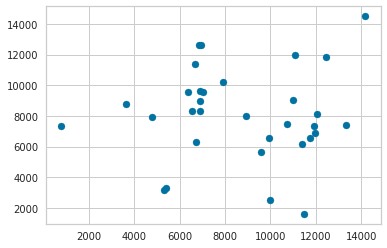

In [6]:
x = game1["coordinate_x"]
y = game1["coordinate_y"]

plt.scatter(x, y)
plt.show()

Plot of Elyoya's location with the summoner's rift from behind

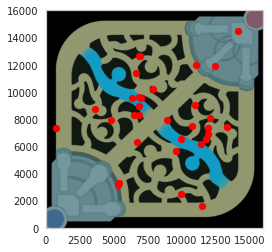

In [94]:
img = plt.imread("map11.png")
fig, ax = plt.subplots()
ax.imshow(img, extent=[0, 16000, 0, 16000])
ax.scatter(x, y, color= "red")
plt.grid()
plt.show()

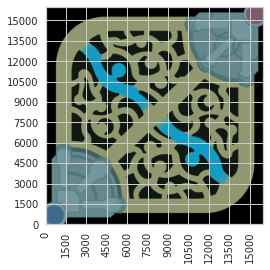

In [16]:
img = plt.imread("map11.png")
fig, ax = plt.subplots()
ax.imshow(img, extent=[0, 16000, 0, 16000])

major_ticks = np.arange(0, 16001, 1500)
minor_ticks = np.arange(0, 16001, 1500)

ax.set_xticks(major_ticks)
ax.set_xticks(minor_ticks, minor=True)
ax.set_yticks(major_ticks)
ax.set_yticks(minor_ticks, minor=True)
plt.xticks(rotation=90)

ax.grid(visible=True)
plt.show()

---
### K-means Clustering

Selecting the initial cluster centers for k-mean clustering by giving 4 jungle centers that are:

- center of the red team's top jungle;
- center of the red team's bottom jungle;
- center of the blue team's top jungle;
- center of the blue team's bottom jungle.

In [4]:
def drawSillouette(X, labels, header="" ):
    y_lower =10
    clusters=list(set(labels))
    n_clusters=len(clusters)

    fig = plt.figure(figsize=(10,8))
    ax1 = plt.gca()
    ax1.set_xlim([-0.5, 1])
    ax1.set_ylim([0, len(X) + (n_clusters) * 3+ y_lower])
    sil_avg = silhouette_score(X, labels)
    silhouette_values = silhouette_samples(X, labels)
    for i,c in enumerate(clusters):
        cs_values = silhouette_values[labels == c]
        cs_values.sort()
        size_ci = cs_values.shape[0]
        y_upper = y_lower + size_ci
        color = np.array(["blueviolet", "yellow", "lime", "crimson"])[i] #
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, cs_values, facecolor=color, edgecolor="k", alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_ci, str(c))
        y_lower = y_upper + 3  # 10 for the 0 samples
    ax1.set_title("Silhouette plot "+ header)
    ax1.set_xlabel("Silhouette coefficient")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=sil_avg, c="r", linestyle="--")

    ax1.set_yticks([]) 
    plt.show()

Clustering function

In [5]:
def clustering(df, scores = 0, bb = 0, bt = 0, rb = 0, rt = 0):
    centroids = np.array([[8250, 4250], [4000, 8750],[12000, 7500], [7750, 12000]])
    nc = df.shape[1]
    df_array = df.values
    X = df_array[:, 2:4]
    kms = KMeans(n_clusters=4, init= centroids, n_init=1, random_state=0, algorithm="elkan").fit(X)
    label = kms.fit_predict(X)

    #---------------
    #plot clusters
    centroids2 = kms.cluster_centers_
    #print(centroids2)
    #print(centroids2[0])
    c1_dist = np.sqrt(np.sum(np.square(centroids2[0] - centroids[0])))
    c2_dist = np.sqrt(np.sum(np.square(centroids2[1] - centroids[1])))
    c3_dist = np.sqrt(np.sum(np.square(centroids2[2] - centroids[2])))
    c4_dist = np.sqrt(np.sum(np.square(centroids2[3] - centroids[3])))
    print("distance between initial centroid {} and final centroid {} of blue team's bottom jungle: {} \n".format(centroids[0], centroids2[0], c1_dist,))
    print("distance between initial centroid {} and final centroid {} of blue team's top jungle: {} \n".format(centroids[1], centroids2[1], c2_dist,))
    print("distance between initial centroid {} and final centroid {} of red team's bottom jungle: {}\n".format(centroids[2], centroids2[2], c3_dist,))
    print("distance between initial centroid {} and final centroid {} of red team's top jungle: {}".format(centroids[3], centroids2[3], c4_dist,))

    u_labels = np.unique(label)
    img = plt.imread("../map11.png")
    fig, ax = plt.subplots()
    ax.imshow(img, extent=[0, 16000, 0, 16000])
    
    #plotting the results:
    
    for i in u_labels:
        ax.scatter(X[label == i , 0] , X[label == i , 1] , label = i, color = np.array(["blueviolet", "yellow", "lime", "crimson"])[i])
    ax.scatter(centroids2[:, 0], centroids2[:, 1], s = 60, color = "white")
    lg = ax.legend(frameon = True, loc='center left', bbox_to_anchor=(1, 0.85), fancybox=True, shadow=True) #adicionado
    lg.get_frame().set_linewidth(1) #adicionado
    lg.get_frame().set_edgecolor("black") #adicionado
    plt.grid(visible=None)
    plt.show()
    if(scores != 0):
        scores.append(silhouette_score(X, kms.labels_))

    if(bb != 0):
        bb.append(Counter(kms.labels_).get(0))
        bt.append(Counter(kms.labels_).get(1))
        rb.append(Counter(kms.labels_).get(2))
        rt.append(Counter(kms.labels_).get(3))
    drawSillouette(X, kms.labels_, "kmeans (K=4)")

    print("Kmeans silhouette_score", silhouette_score(X, kms.labels_))
    print("Locations in cluster 0: {}\nLocations in cluster 1: {}\nLocations in cluster 2: {}\nLocations in cluster 3: {}\n".format(Counter(kms.labels_).get(0),Counter(kms.labels_).get(1),Counter(kms.labels_).get(2),Counter(kms.labels_).get(3)))
    print("--------------------------------------------------------------------------------------")
    return c1_dist, c2_dist, c3_dist, c4_dist, centroids2
    #blueviolet - blue team's bot jungle
    #yellow - blue team's top jungle
    #lime - red team's bot jungle
    #crimson - red team's top jungle

Representation of the initial centroids:

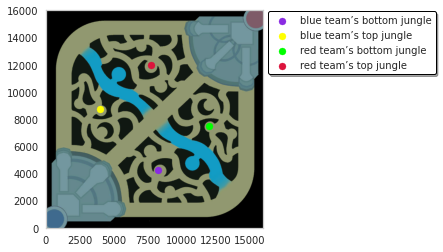

In [11]:
centroids_x = [8250,4000, 12000, 7750]
centroids_y = [4250, 8750, 7500, 12000]
img = plt.imread("../map11.png")
fig, ax = plt.subplots()
ax.imshow(img, extent=[0, 16000, 0, 16000])
blue_team_bot_jungle = ax.scatter(8250, 4250, color= ["blueviolet"]) #, "yellow", "lime", "crimson"
blue_team_top_jungle = ax.scatter(4000, 8750, color= ["yellow"])
red_team_bot_jungle = ax.scatter(12000, 7500, color= ["lime"])
red_team_top_jungle = ax.scatter(7750, 12000, color= ["crimson"])
plt.grid()
lg = ax.legend((blue_team_bot_jungle, blue_team_top_jungle, red_team_bot_jungle, red_team_top_jungle), ("blue team’s bottom jungle", "blue team’s top jungle", "red team’s bottom jungle", "red team’s top jungle"), frameon = True, loc='center left', bbox_to_anchor=(1, 0.85),
          fancybox=True, shadow=True)

lg.get_frame().set_linewidth(1)
lg.get_frame().set_edgecolor("black")
#ax.legend(["blue", "yelolow", "verde", "ver"])
plt.show()

When Elyoya plays for the Red team:

In [6]:
redTeam_df = df.loc[df["team"] == "Red"]
print("Red Team Data Frame:\n{}".format(redTeam_df))
print("\nElyoya played {} matches on the red team.".format(redTeam_df["gameId"].nunique()))

Red Team Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team    won
30    EUW1_6176325099   0.000000         14176         14506  Red  False
31    EUW1_6176325099   1.000250          9667          7063  Red  False
32    EUW1_6176325099   2.000350          8037          3520  Red  False
33    EUW1_6176325099   3.000583         11663          7725  Red  False
34    EUW1_6176325099   4.000900          7672          5223  Red  False
...               ...        ...           ...           ...  ...    ...
2006  EUW1_6151765282  28.007417         10665         10235  Red  False
2007  EUW1_6151765282  29.007850          9714          5255  Red  False
2008  EUW1_6151765282  30.007983          7293         10934  Red  False
2009  EUW1_6151765282  31.008533         12258          8480  Red  False
2010  EUW1_6151765282  31.499200         14340         14390  Red  False

[933 rows x 6 columns]

Elyoya played 33 matches on the red team.


#### Clustering per game

When Elyoya wins on the Red team:

In [98]:
redTeamWins_df = redTeam_df.loc[redTeam_df["won"] == True]
print("Red Team Winning Data Frame:\n{}".format(redTeamWins_df))

print("\nElyoya won {} matches on the red team.".format(redTeamWins_df["gameId"].nunique()))

Red Team Winning Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team   won
159   EUW1_6173376101   0.000000         14176         14506  Red  True
160   EUW1_6173376101   1.000200          7269          9759  Red  True
161   EUW1_6173376101   2.000483          7219         12424  Red  True
162   EUW1_6173376101   3.001183         11854          6708  Red  True
163   EUW1_6173376101   4.001733         10439         13946  Red  True
...               ...        ...           ...           ...  ...   ...
1863  EUW1_6154165838  30.009633          1290          4456  Red  True
1864  EUW1_6154165838  31.009667         11251         12544  Red  True
1865  EUW1_6154165838  32.010183          7520          7674  Red  True
1866  EUW1_6154165838  33.010350          9017          6192  Red  True
1867  EUW1_6154165838  33.269717          4893          4725  Red  True

[489 rows x 6 columns]

Elyoya won 17 matches on the red team.


1: EUW1_6173376101 - Red team Victory


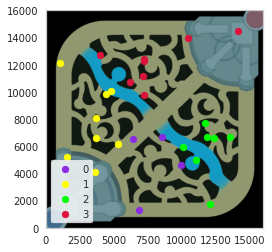

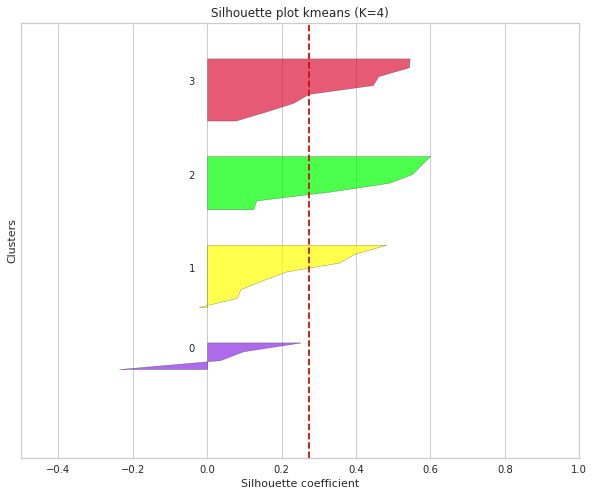

Kmeans silhouette_score 0.274733056539492
Locations in cluster 0: 4
Locations in cluster 1: 8
Locations in cluster 2: 7
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
2: EUW1_6170116709 - Red team Victory


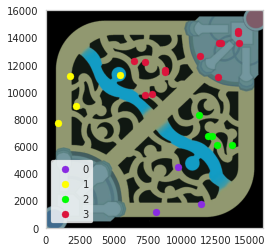

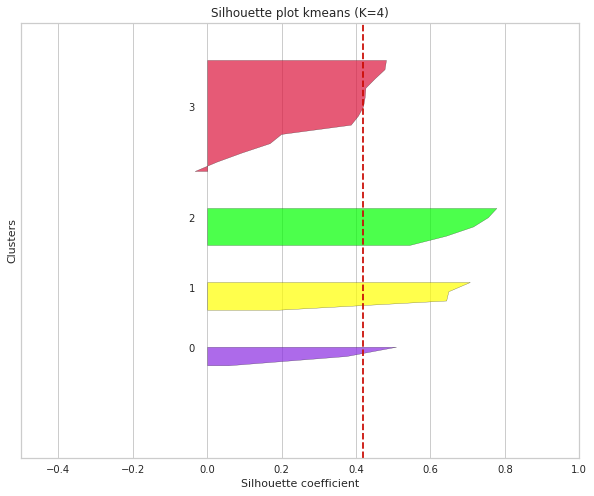

Kmeans silhouette_score 0.4188800530005414
Locations in cluster 0: 3
Locations in cluster 1: 4
Locations in cluster 2: 5
Locations in cluster 3: 13

--------------------------------------------------------------------------------------
3: EUW1_6169961548 - Red team Victory


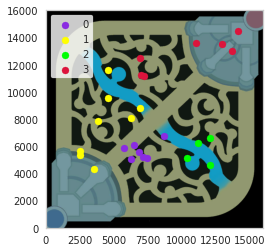

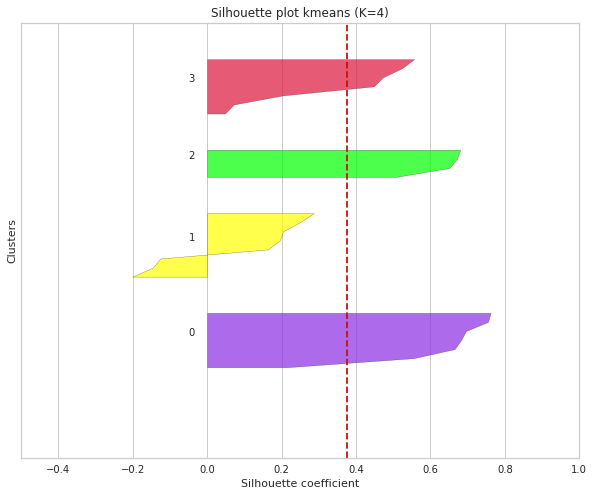

Kmeans silhouette_score 0.37630568821821436
Locations in cluster 0: 7
Locations in cluster 1: 8
Locations in cluster 2: 4
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
4: EUW1_6169756315 - Red team Victory


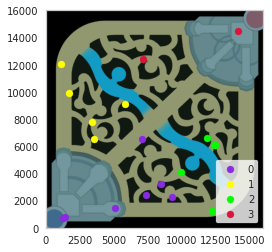

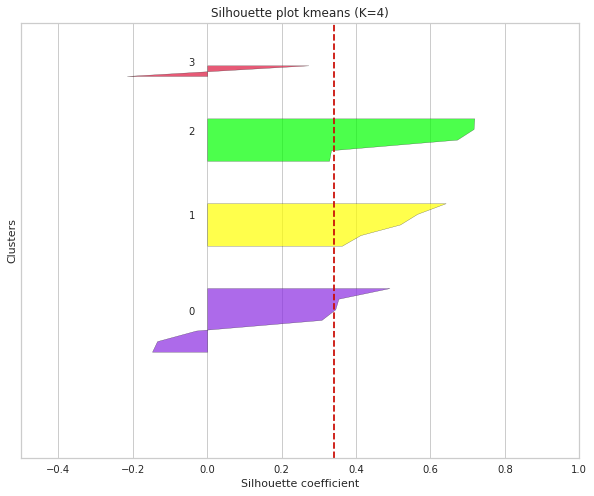

Kmeans silhouette_score 0.3421896955429377
Locations in cluster 0: 7
Locations in cluster 1: 5
Locations in cluster 2: 5
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
5: EUW1_6169361919 - Red team Victory


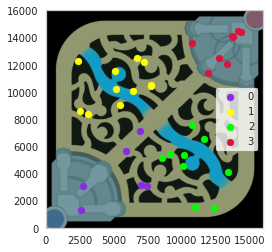

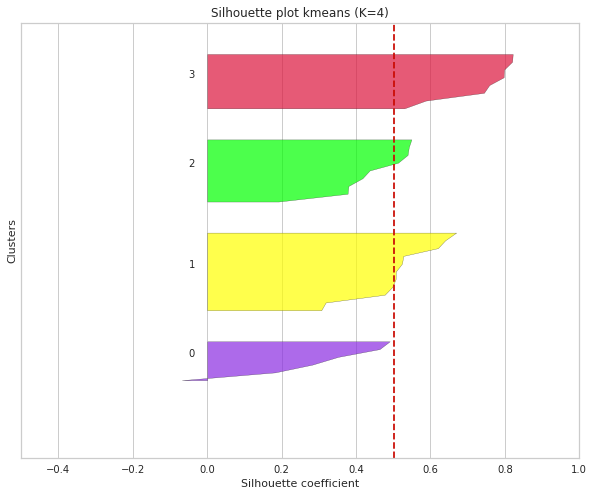

Kmeans silhouette_score 0.502807176180007
Locations in cluster 0: 6
Locations in cluster 1: 11
Locations in cluster 2: 9
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
6: EUW1_6169332619 - Red team Victory


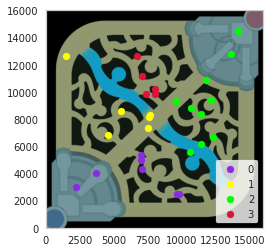

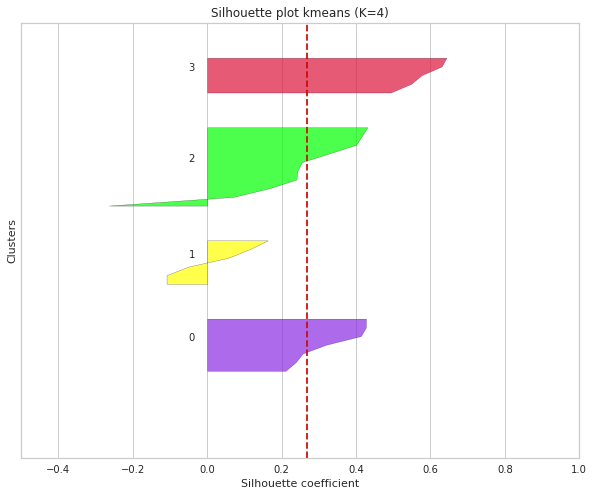

Kmeans silhouette_score 0.2690636875847545
Locations in cluster 0: 7
Locations in cluster 1: 6
Locations in cluster 2: 10
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
7: EUW1_6166266685 - Red team Victory


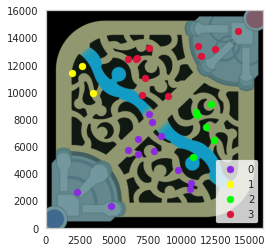

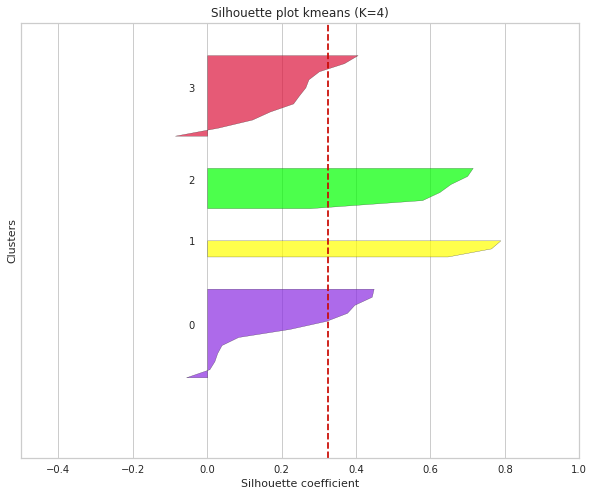

Kmeans silhouette_score 0.32429776683739026
Locations in cluster 0: 12
Locations in cluster 1: 3
Locations in cluster 2: 6
Locations in cluster 3: 11

--------------------------------------------------------------------------------------
8: EUW1_6166201683 - Red team Victory


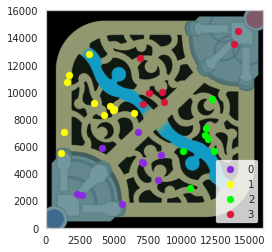

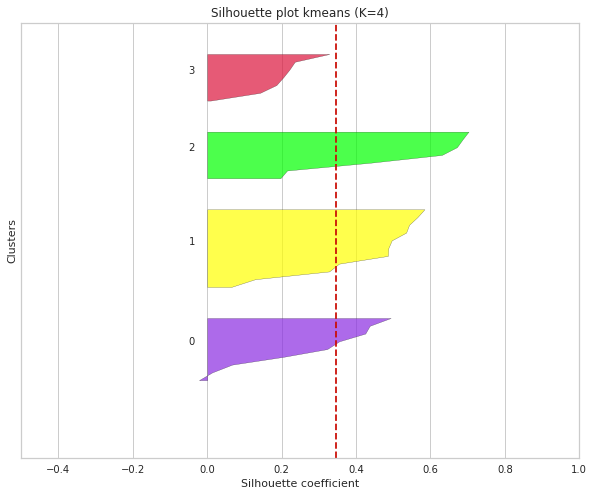

Kmeans silhouette_score 0.34504175247022983
Locations in cluster 0: 9
Locations in cluster 1: 11
Locations in cluster 2: 7
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
9: EUW1_6165754722 - Red team Victory


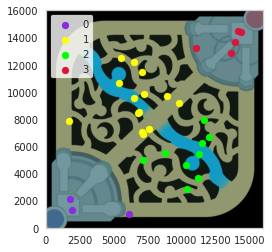

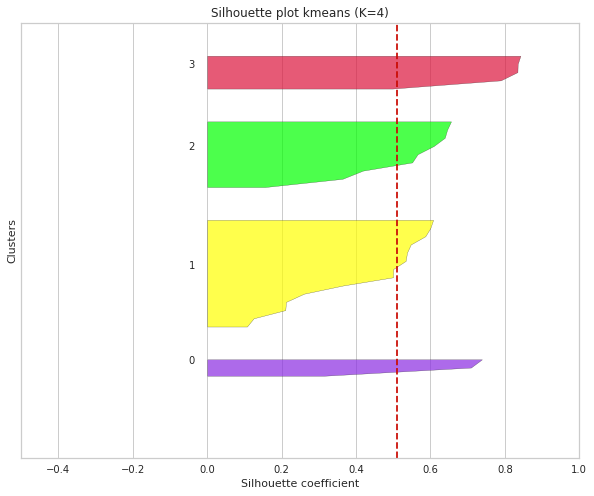

Kmeans silhouette_score 0.511198819060187
Locations in cluster 0: 3
Locations in cluster 1: 14
Locations in cluster 2: 9
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
10: EUW1_6165735683 - Red team Victory


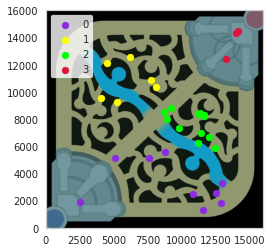

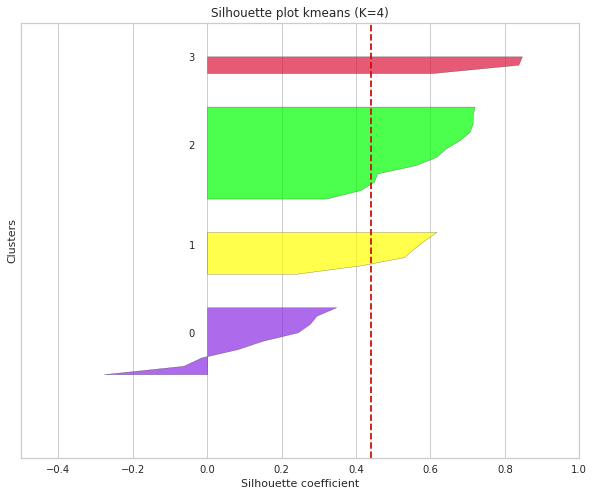

Kmeans silhouette_score 0.4412557462774612
Locations in cluster 0: 9
Locations in cluster 1: 6
Locations in cluster 2: 12
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
11: EUW1_6163695569 - Red team Victory


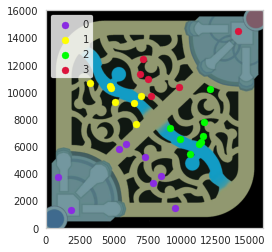

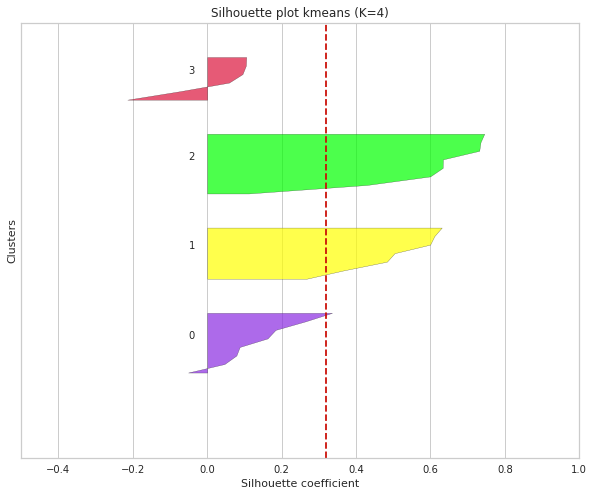

Kmeans silhouette_score 0.3193880771726636
Locations in cluster 0: 8
Locations in cluster 1: 7
Locations in cluster 2: 8
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
12: EUW1_6163629472 - Red team Victory


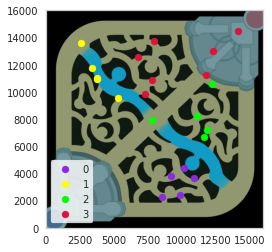

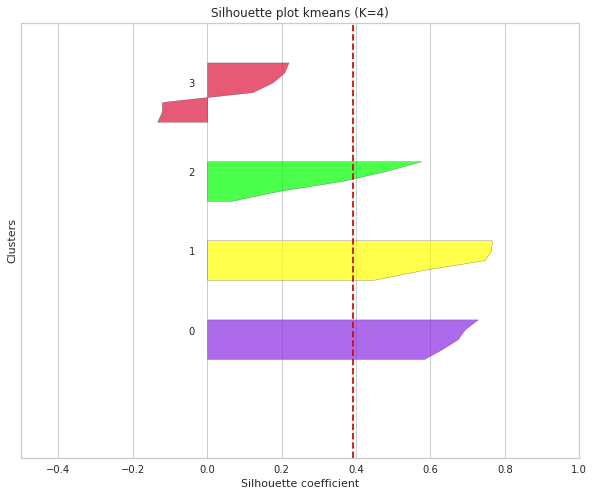

Kmeans silhouette_score 0.39208705666777477
Locations in cluster 0: 5
Locations in cluster 1: 5
Locations in cluster 2: 5
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
13: EUW1_6162595161 - Red team Victory


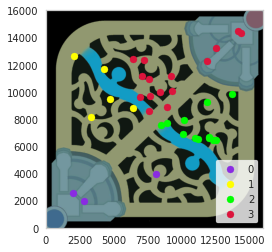

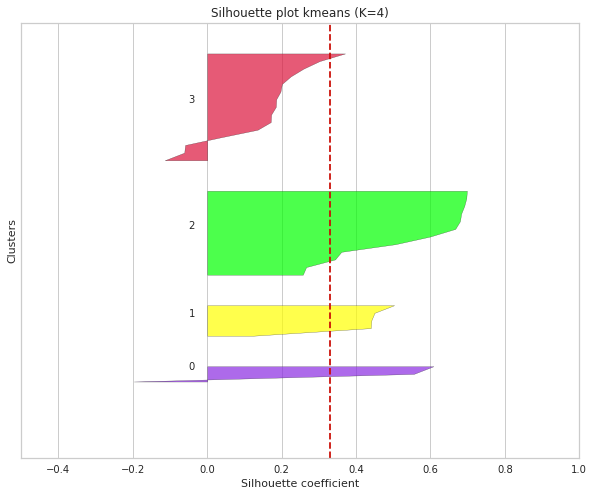

Kmeans silhouette_score 0.3305266723442242
Locations in cluster 0: 3
Locations in cluster 1: 5
Locations in cluster 2: 12
Locations in cluster 3: 15

--------------------------------------------------------------------------------------
14: EUW1_6156713548 - Red team Victory


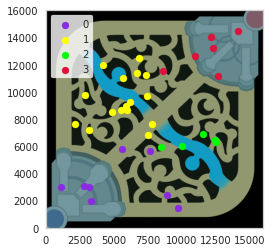

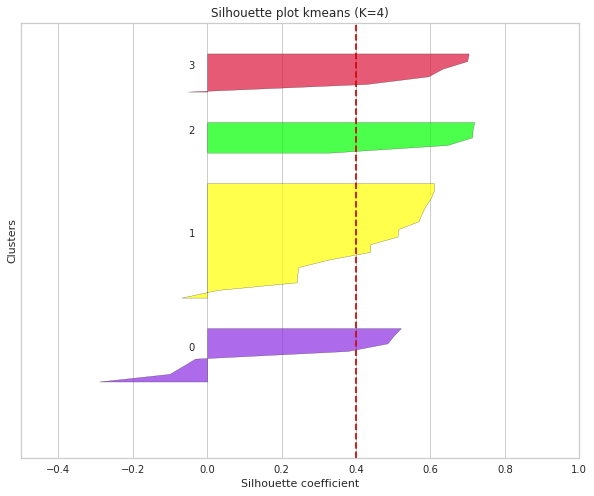

Kmeans silhouette_score 0.3994384102195978
Locations in cluster 0: 8
Locations in cluster 1: 16
Locations in cluster 2: 5
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
15: EUW1_6155318816 - Red team Victory


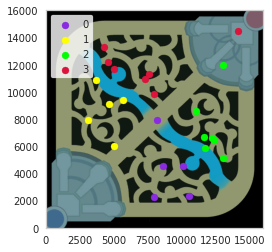

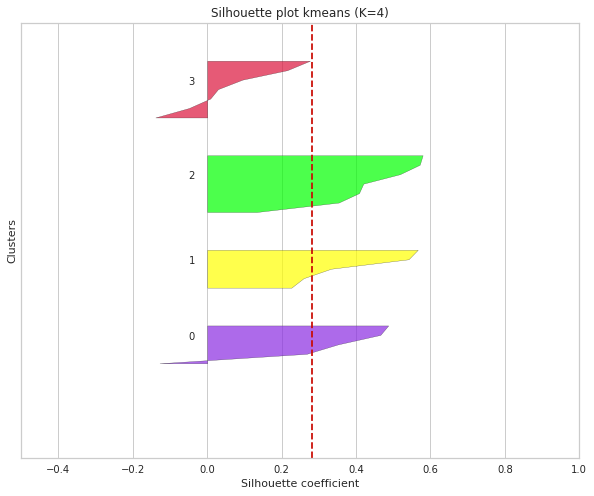

Kmeans silhouette_score 0.2827187798150224
Locations in cluster 0: 5
Locations in cluster 1: 5
Locations in cluster 2: 7
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
16: EUW1_6154241292 - Red team Victory


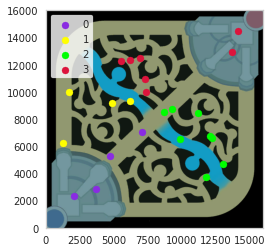

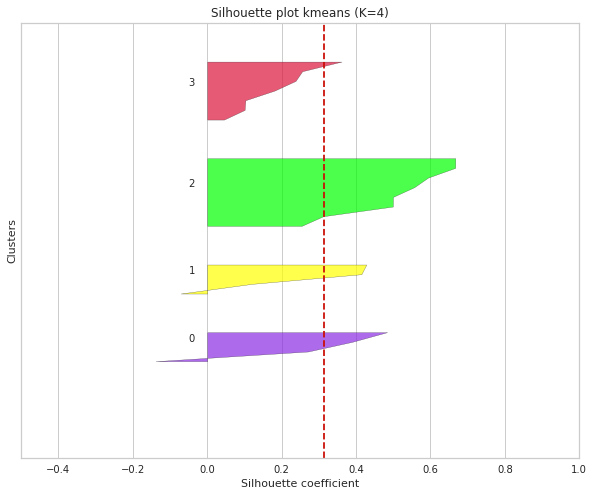

Kmeans silhouette_score 0.3142302810160525
Locations in cluster 0: 4
Locations in cluster 1: 4
Locations in cluster 2: 8
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
17: EUW1_6154165838 - Red team Victory


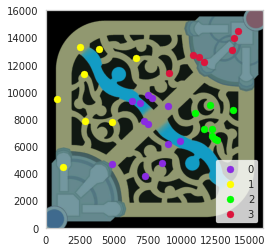

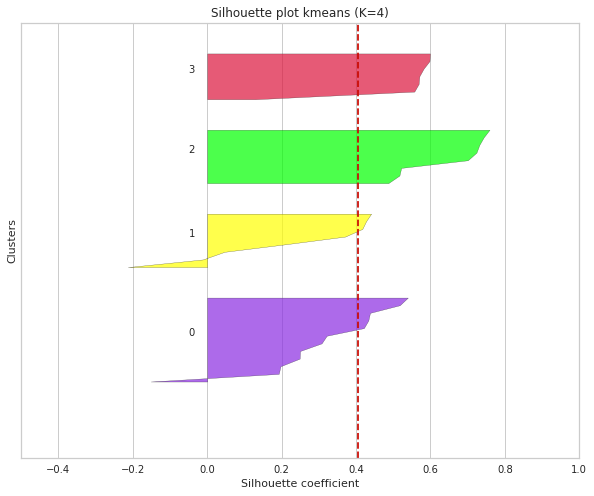

Kmeans silhouette_score 0.4053558221327095
Locations in cluster 0: 12
Locations in cluster 1: 8
Locations in cluster 2: 8
Locations in cluster 3: 7

--------------------------------------------------------------------------------------


In [99]:
n = 1
for game in redTeamWins_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Victory".format(n, game, game_df["team"].unique()[0]))
    clustering(game_df)
    n += 1

When Elyoya loses on the Red team:

In [100]:
redTeamLoses_df = redTeam_df.loc[redTeam_df["won"] == False]
print("Red Team losing Data Frame:\n{}".format(redTeamLoses_df))
print("\nElyoya lost {} matches on the red team.".format(redTeamLoses_df["gameId"].nunique()))

Red Team losing Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team    won
30    EUW1_6176325099   0.000000         14176         14506  Red  False
31    EUW1_6176325099   1.000250          9667          7063  Red  False
32    EUW1_6176325099   2.000350          8037          3520  Red  False
33    EUW1_6176325099   3.000583         11663          7725  Red  False
34    EUW1_6176325099   4.000900          7672          5223  Red  False
...               ...        ...           ...           ...  ...    ...
2006  EUW1_6151765282  28.007417         10665         10235  Red  False
2007  EUW1_6151765282  29.007850          9714          5255  Red  False
2008  EUW1_6151765282  30.007983          7293         10934  Red  False
2009  EUW1_6151765282  31.008533         12258          8480  Red  False
2010  EUW1_6151765282  31.499200         14340         14390  Red  False

[444 rows x 6 columns]

Elyoya lost 16 matches on the red team.


1: EUW1_6176325099 - Red team Defeat


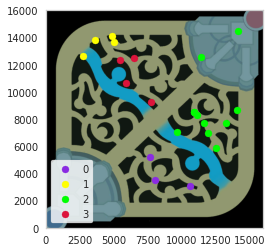

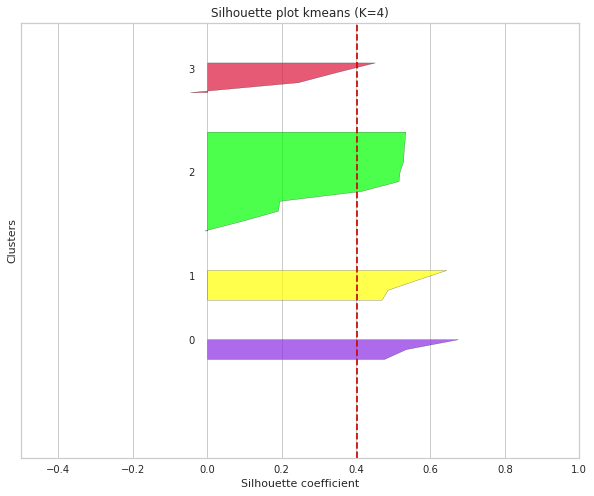

Kmeans silhouette_score 0.40320104778156485
Locations in cluster 0: 3
Locations in cluster 1: 4
Locations in cluster 2: 11
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
2: EUW1_6170009607 - Red team Defeat


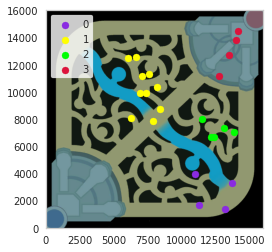

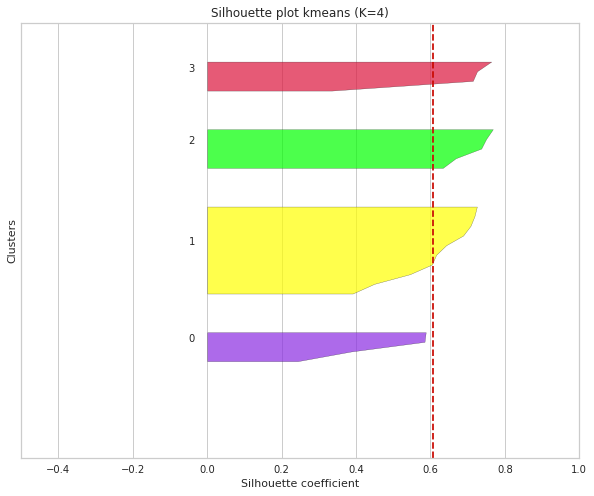

Kmeans silhouette_score 0.607771495010934
Locations in cluster 0: 4
Locations in cluster 1: 10
Locations in cluster 2: 5
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
3: EUW1_6169075266 - Red team Defeat


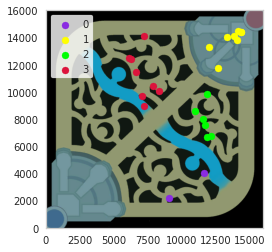

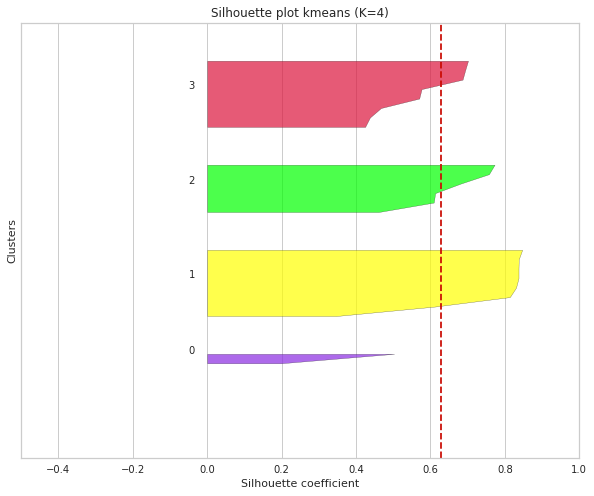

Kmeans silhouette_score 0.6295981220014397
Locations in cluster 0: 2
Locations in cluster 1: 8
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
4: EUW1_6166357478 - Red team Defeat


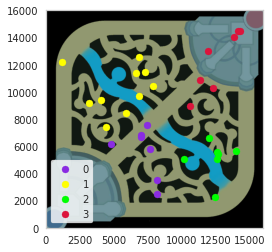

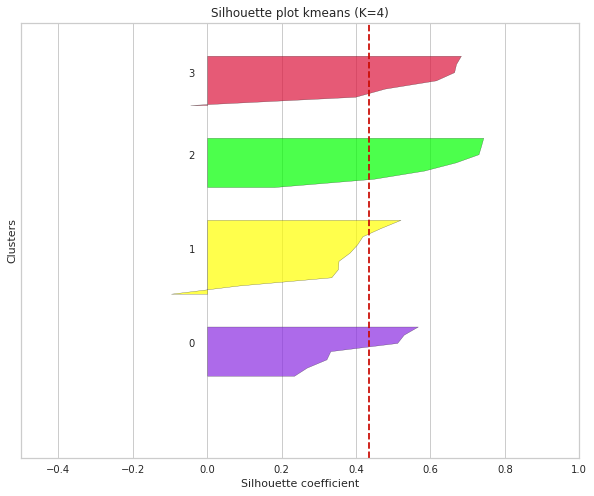

Kmeans silhouette_score 0.4359313400264312
Locations in cluster 0: 7
Locations in cluster 1: 10
Locations in cluster 2: 7
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
5: EUW1_6164815806 - Red team Defeat


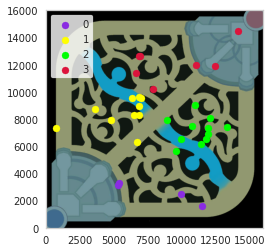

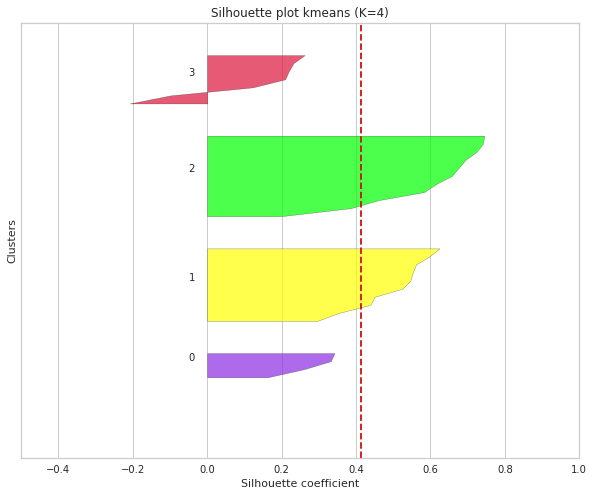

Kmeans silhouette_score 0.41433169503535505
Locations in cluster 0: 4
Locations in cluster 1: 10
Locations in cluster 2: 11
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
6: EUW1_6161628395 - Red team Defeat


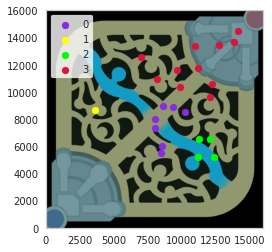

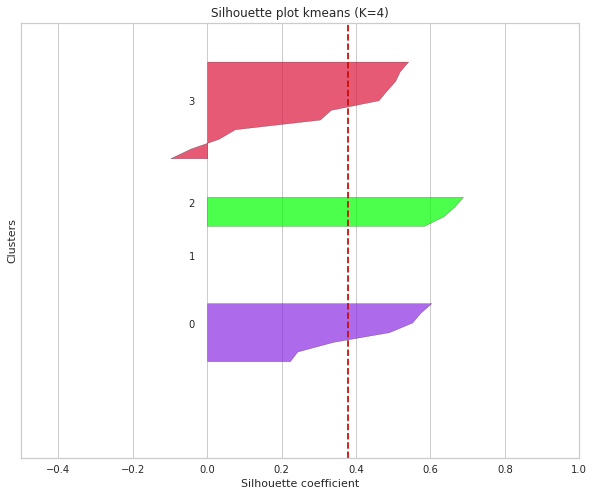

Kmeans silhouette_score 0.37781166620612583
Locations in cluster 0: 7
Locations in cluster 1: 1
Locations in cluster 2: 4
Locations in cluster 3: 11

--------------------------------------------------------------------------------------
7: EUW1_6161484250 - Red team Defeat


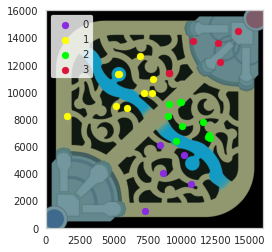

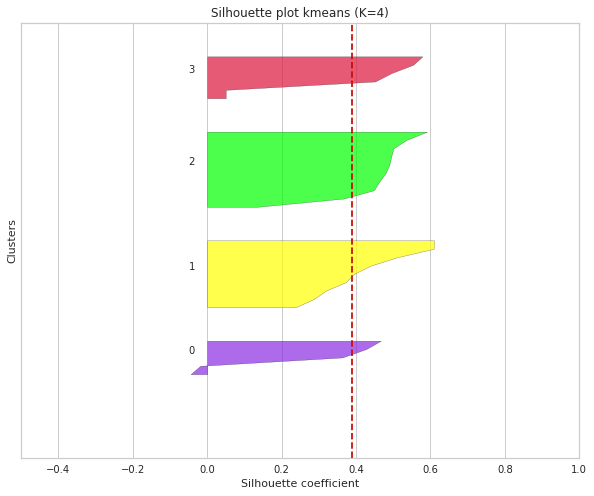

Kmeans silhouette_score 0.38842831546526874
Locations in cluster 0: 5
Locations in cluster 1: 9
Locations in cluster 2: 10
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
8: EUW1_6161351421 - Red team Defeat


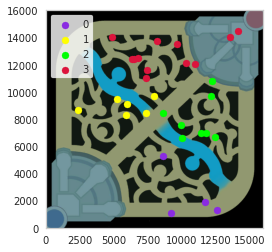

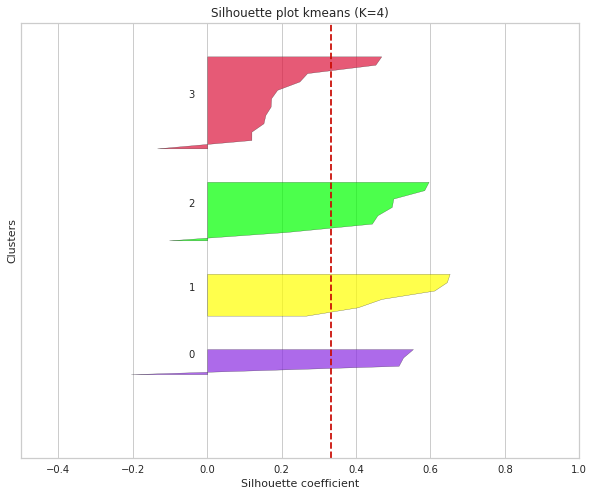

Kmeans silhouette_score 0.33323700884324187
Locations in cluster 0: 4
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 12

--------------------------------------------------------------------------------------
9: EUW1_6160614714 - Red team Defeat


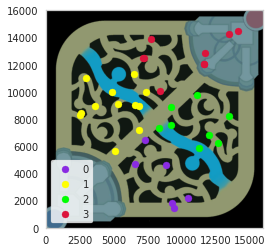

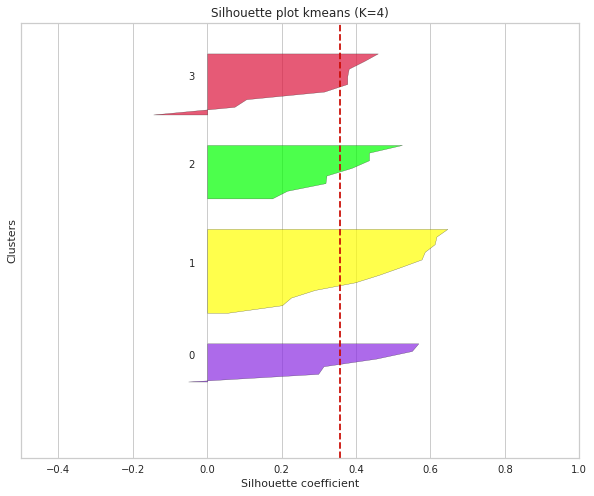

Kmeans silhouette_score 0.356698334560522
Locations in cluster 0: 6
Locations in cluster 1: 12
Locations in cluster 2: 8
Locations in cluster 3: 9

--------------------------------------------------------------------------------------
10: EUW1_6156508218 - Red team Defeat


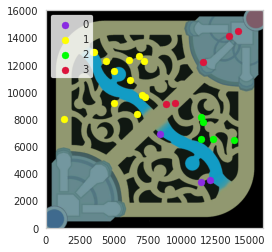

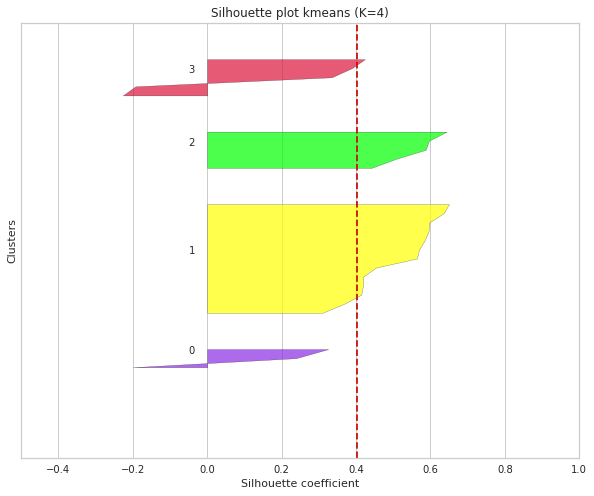

Kmeans silhouette_score 0.4017573299174195
Locations in cluster 0: 3
Locations in cluster 1: 13
Locations in cluster 2: 5
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
11: EUW1_6155233283 - Red team Defeat


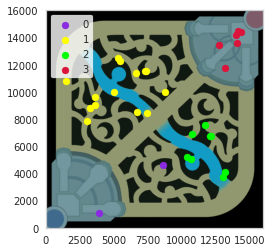

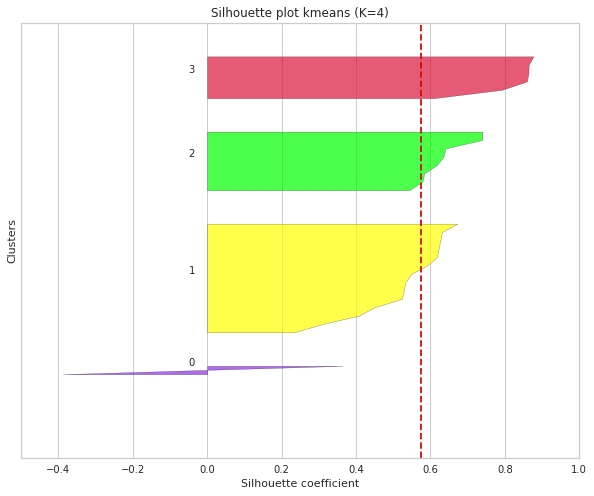

Kmeans silhouette_score 0.5737671042140607
Locations in cluster 0: 2
Locations in cluster 1: 14
Locations in cluster 2: 8
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
12: EUW1_6154509012 - Red team Defeat


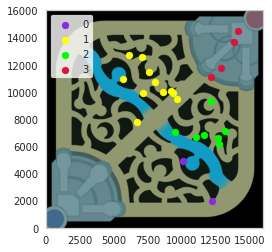

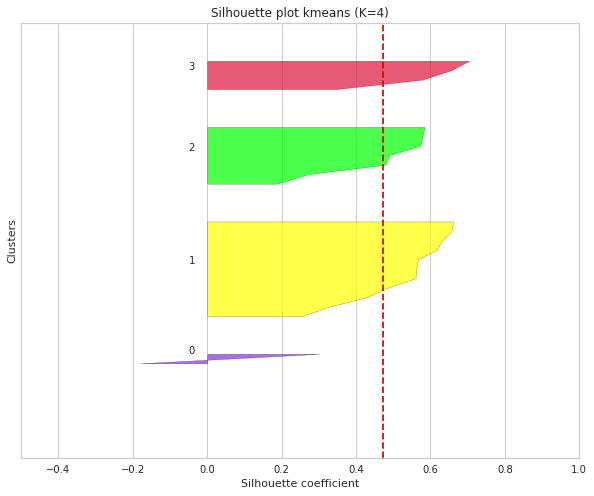

Kmeans silhouette_score 0.47199513886554395
Locations in cluster 0: 2
Locations in cluster 1: 11
Locations in cluster 2: 7
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
13: EUW1_6154457377 - Red team Defeat


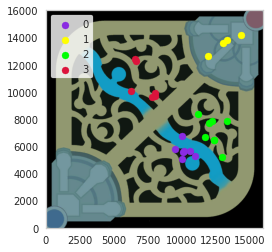

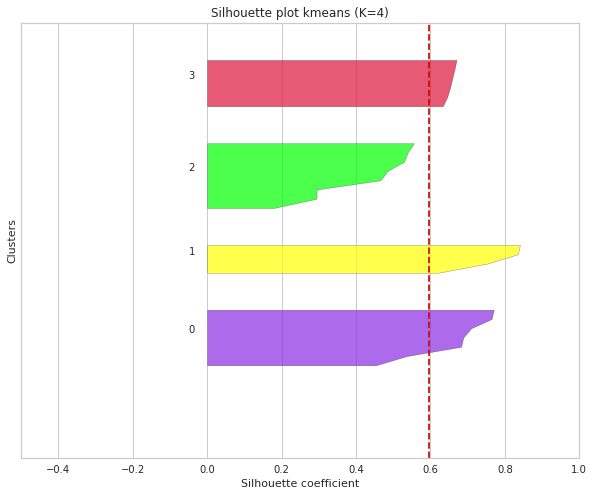

Kmeans silhouette_score 0.5967818095419364
Locations in cluster 0: 7
Locations in cluster 1: 4
Locations in cluster 2: 8
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
14: EUW1_6154019544 - Red team Defeat


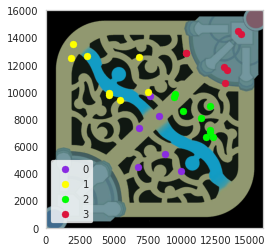

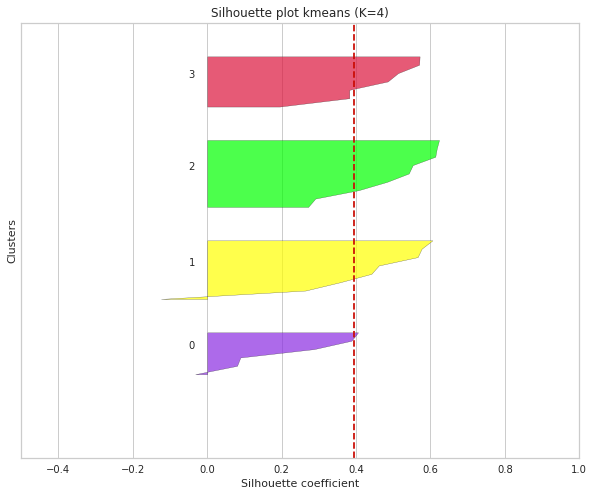

Kmeans silhouette_score 0.3954184785718104
Locations in cluster 0: 6
Locations in cluster 1: 8
Locations in cluster 2: 9
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
15: EUW1_6151839599 - Red team Defeat


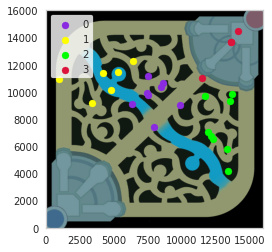

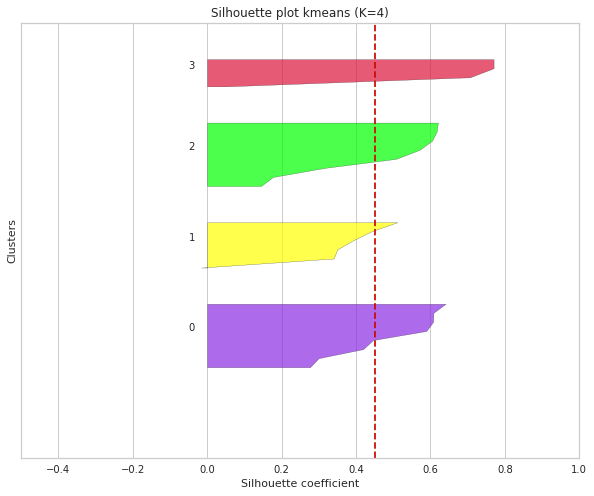

Kmeans silhouette_score 0.45220128941543936
Locations in cluster 0: 8
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
16: EUW1_6151765282 - Red team Defeat


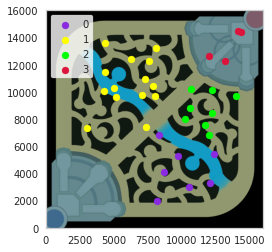

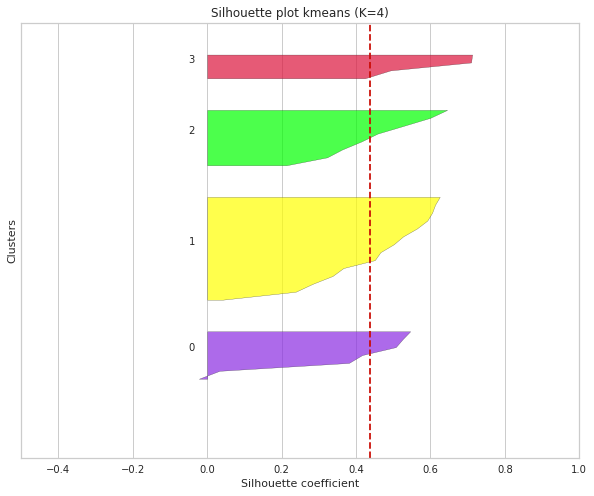

Kmeans silhouette_score 0.4386025985627593
Locations in cluster 0: 7
Locations in cluster 1: 14
Locations in cluster 2: 8
Locations in cluster 3: 4

--------------------------------------------------------------------------------------


In [101]:
n = 1
for game in redTeamLoses_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Defeat".format(n, game, game_df["team"].unique()[0]))
    clustering(game_df)
    n += 1

#### Clustering all games played on the red team

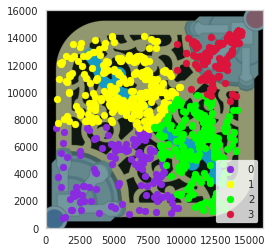

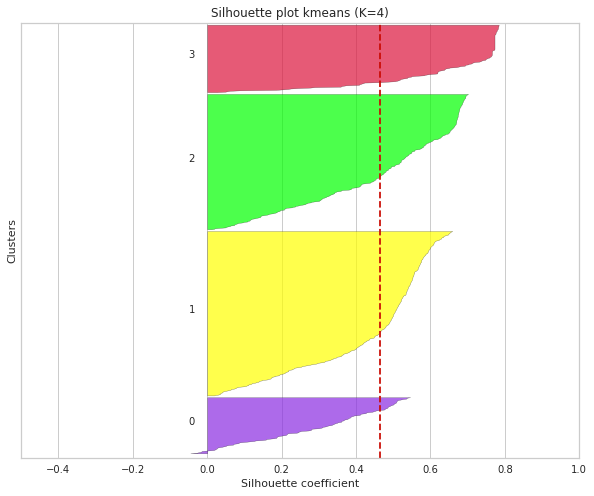

Kmeans silhouette_score 0.4645573432277869
Locations in cluster 0: 124
Locations in cluster 1: 362
Locations in cluster 2: 298
Locations in cluster 3: 149

--------------------------------------------------------------------------------------


In [102]:
clustering(redTeam_df)

Red team wins:

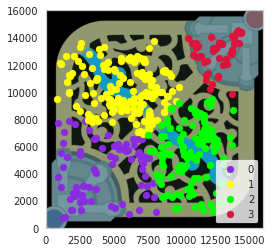

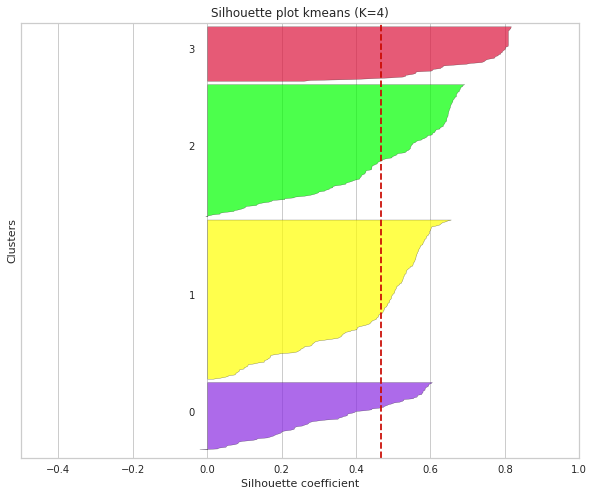

Kmeans silhouette_score 0.4681346277850707
Locations in cluster 0: 80
Locations in cluster 1: 188
Locations in cluster 2: 156
Locations in cluster 3: 65

--------------------------------------------------------------------------------------


In [103]:
clustering(redTeamWins_df)

Red team loses

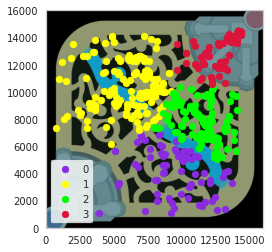

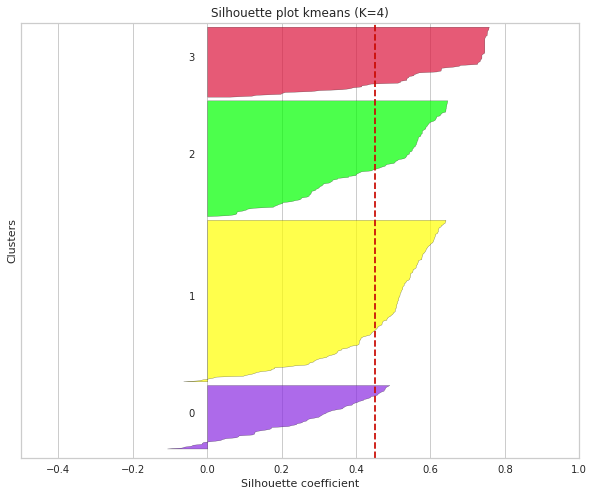

Kmeans silhouette_score 0.4521005581014257
Locations in cluster 0: 69
Locations in cluster 1: 174
Locations in cluster 2: 125
Locations in cluster 3: 76

--------------------------------------------------------------------------------------


In [104]:
clustering(redTeamLoses_df)

---
### When Elyoya plays for the Blue Team

In [7]:
blueTeam_df = df.loc[df["team"] == "Blue"]
print("Blue Team Data Frame:\n{}".format(blueTeam_df))
print("\nElyoya played {} matches on the blue team.".format(blueTeam_df["gameId"].nunique()))

Blue Team Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team    won
0     EUW1_6176366691   0.000000           557           345  Blue   True
1     EUW1_6176366691   1.000250          5633          9332  Blue   True
2     EUW1_6176366691   2.000750          8149          2265  Blue   True
3     EUW1_6176366691   3.001350         11532          4753  Blue   True
4     EUW1_6176366691   4.001617         11454          3261  Blue   True
...               ...        ...           ...           ...   ...    ...
1947  EUW1_6153946340  20.005633          4904          4696  Blue  False
1948  EUW1_6153946340  21.005933          3570          6533  Blue  False
1949  EUW1_6153946340  22.006317          3522          9030  Blue  False
1950  EUW1_6153946340  23.006850          1541          1053  Blue  False
1951  EUW1_6153946340  23.306067          1226           503  Blue  False

[1068 rows x 6 columns]

Elyoya played 39 matches on the blue team.


#### Clustering per game

When blue team wins:

In [106]:
blueTeamWins_df = blueTeam_df.loc[blueTeam_df["won"] == True]
print("Blue Team Winning Data Frame:\n{}".format(blueTeamWins_df))
print("\nElyoya won {} matches on the blue team.".format(blueTeamWins_df["gameId"].nunique()))

Blue Team Winning Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team   won
0     EUW1_6176366691   0.000000           557           345  Blue  True
1     EUW1_6176366691   1.000250          5633          9332  Blue  True
2     EUW1_6176366691   2.000750          8149          2265  Blue  True
3     EUW1_6176366691   3.001350         11532          4753  Blue  True
4     EUW1_6176366691   4.001617         11454          3261  Blue  True
...               ...        ...           ...           ...   ...   ...
1892  EUW1_6154082054  24.006083          6911          6871  Blue  True
1893  EUW1_6154082054  25.006400         12137          4685  Blue  True
1894  EUW1_6154082054  26.006417          3869         11206  Blue  True
1895  EUW1_6154082054  27.006533          8484         13392  Blue  True
1896  EUW1_6154082054  27.660317           394           461  Blue  True

[541 rows x 6 columns]

Elyoya won 20 matches on the blue team.


1: EUW1_6176366691 - Blue team Victory


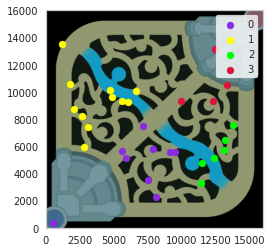

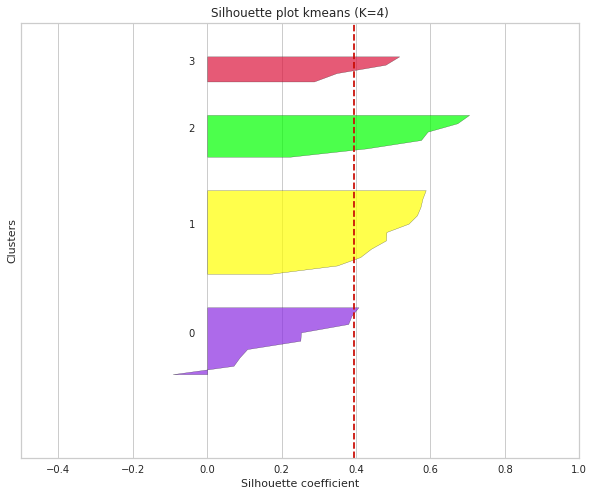

Kmeans silhouette_score 0.39496928798317665
Locations in cluster 0: 9
Locations in cluster 1: 11
Locations in cluster 2: 6
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
2: EUW1_6176273615 - Blue team Victory


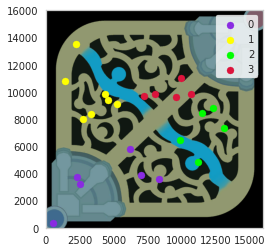

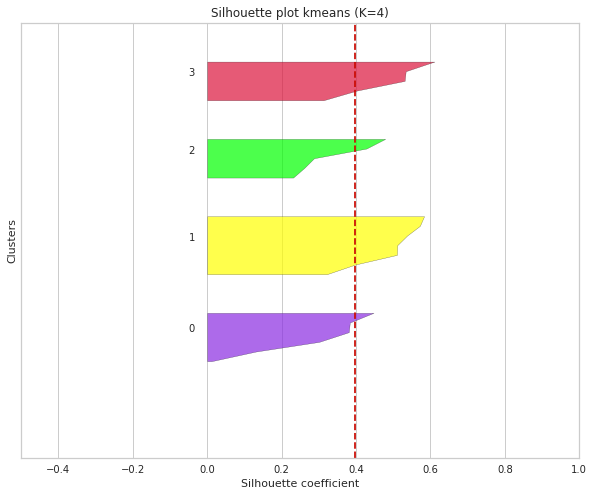

Kmeans silhouette_score 0.3983442172745704
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 5
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
3: EUW1_6175455388 - Blue team Victory


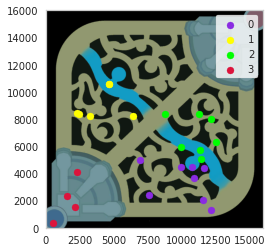

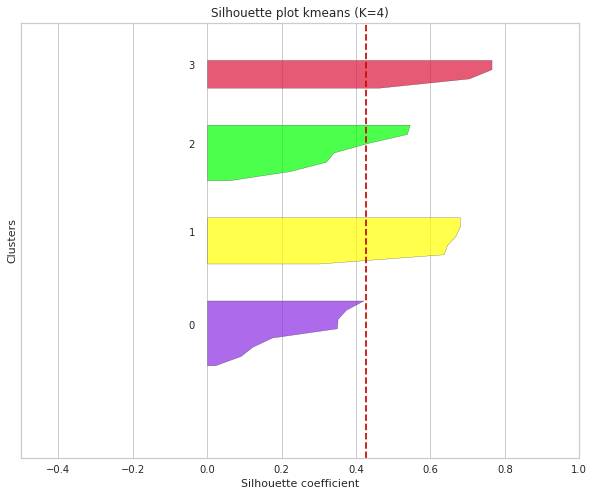

Kmeans silhouette_score 0.42606973812160504
Locations in cluster 0: 8
Locations in cluster 1: 6
Locations in cluster 2: 7
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
4: EUW1_6174897746 - Blue team Victory


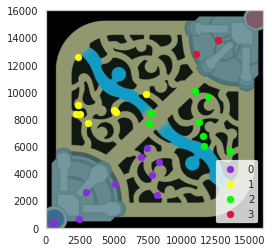

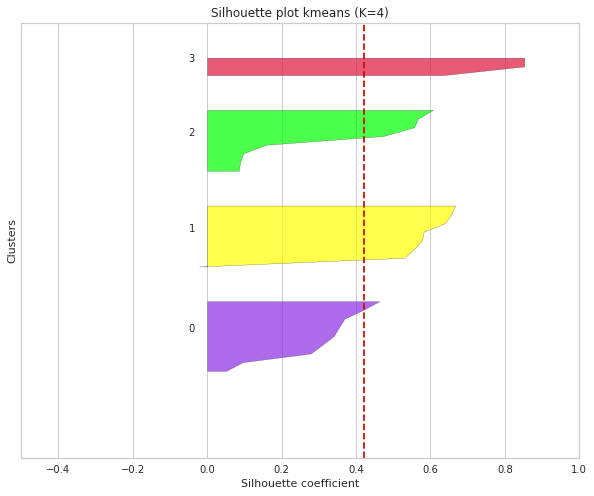

Kmeans silhouette_score 0.42272428553246144
Locations in cluster 0: 9
Locations in cluster 1: 8
Locations in cluster 2: 8
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
5: EUW1_6174116009 - Blue team Victory


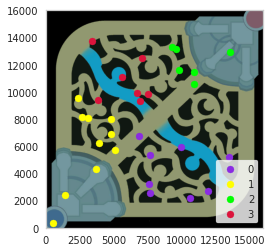

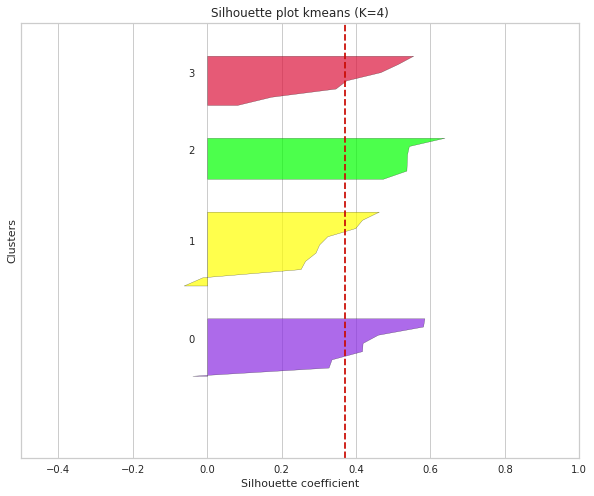

Kmeans silhouette_score 0.36998036259975475
Locations in cluster 0: 8
Locations in cluster 1: 10
Locations in cluster 2: 6
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
6: EUW1_6169918453 - Blue team Victory


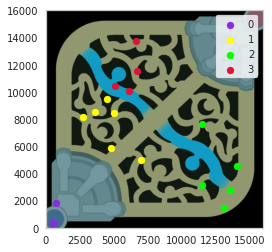

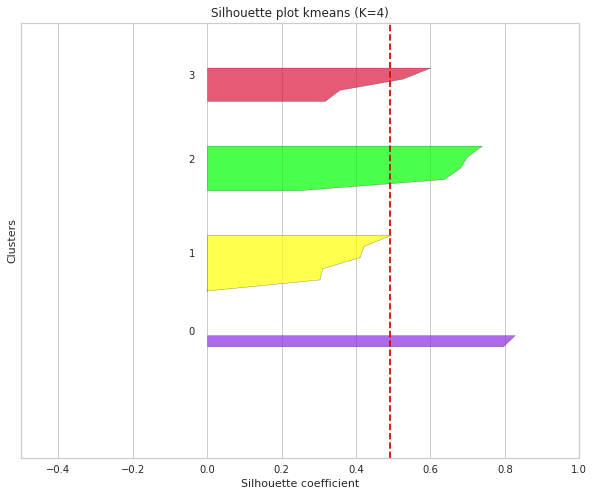

Kmeans silhouette_score 0.4911964023900881
Locations in cluster 0: 2
Locations in cluster 1: 6
Locations in cluster 2: 5
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
7: EUW1_6169720779 - Blue team Victory


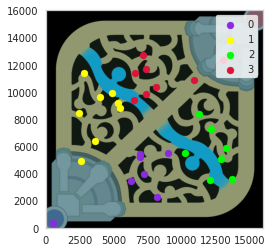

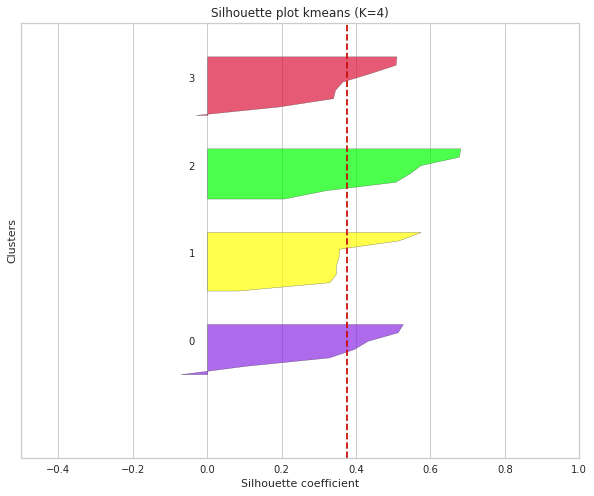

Kmeans silhouette_score 0.37612613218555685
Locations in cluster 0: 7
Locations in cluster 1: 8
Locations in cluster 2: 7
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
8: EUW1_6167858594 - Blue team Victory


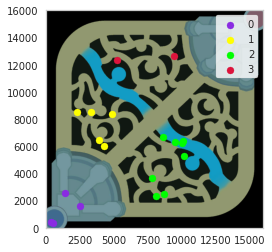

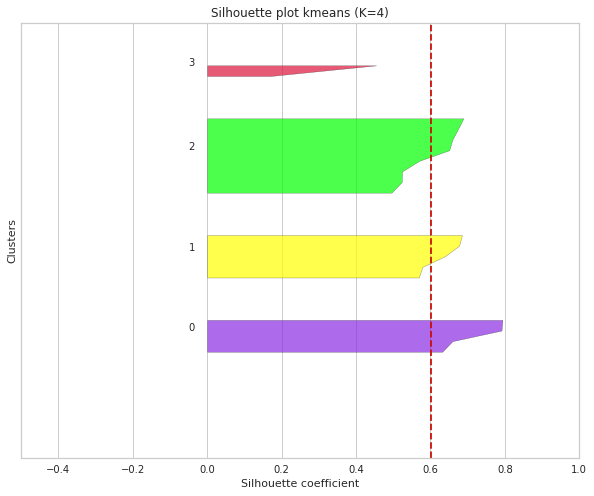

Kmeans silhouette_score 0.6017048547166627
Locations in cluster 0: 4
Locations in cluster 1: 5
Locations in cluster 2: 8
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
9: EUW1_6163745751 - Blue team Victory


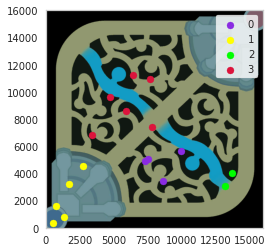

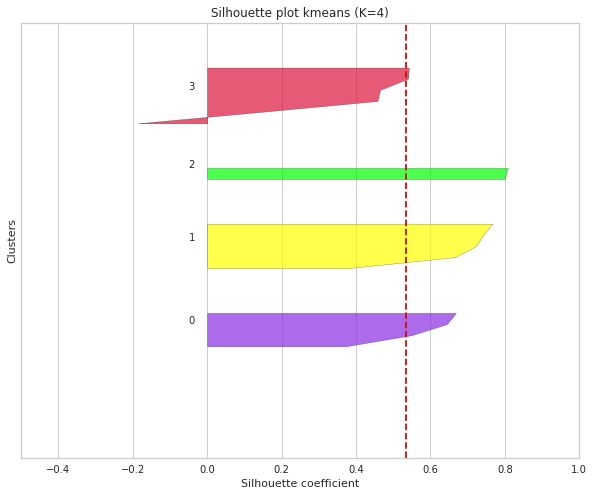

Kmeans silhouette_score 0.5337112407921527
Locations in cluster 0: 4
Locations in cluster 1: 5
Locations in cluster 2: 2
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
10: EUW1_6162711936 - Blue team Victory


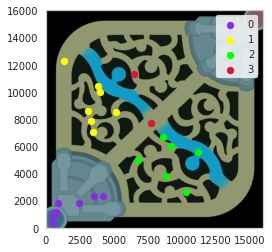

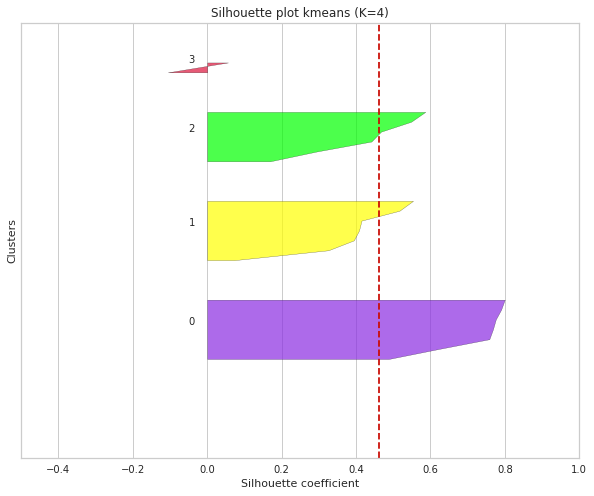

Kmeans silhouette_score 0.46107726580225794
Locations in cluster 0: 7
Locations in cluster 1: 7
Locations in cluster 2: 6
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
11: EUW1_6162519044 - Blue team Victory


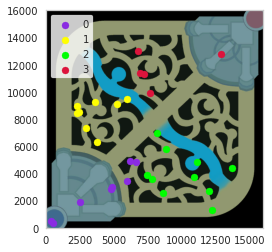

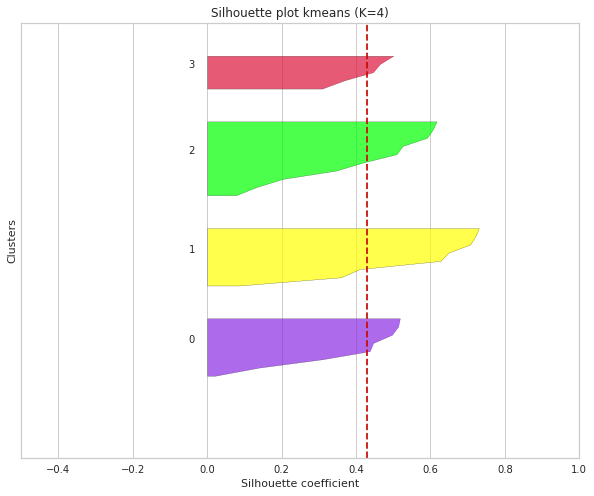

Kmeans silhouette_score 0.4283090409407765
Locations in cluster 0: 8
Locations in cluster 1: 8
Locations in cluster 2: 10
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
12: EUW1_6161672257 - Blue team Victory


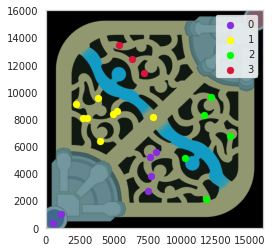

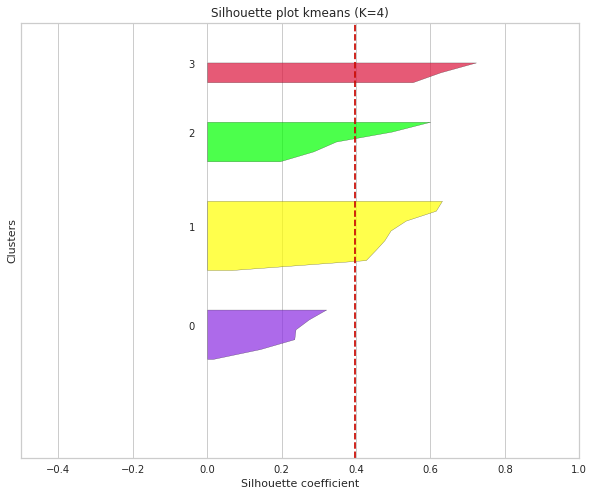

Kmeans silhouette_score 0.39709153916269563
Locations in cluster 0: 6
Locations in cluster 1: 8
Locations in cluster 2: 5
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
13: EUW1_6161274781 - Blue team Victory


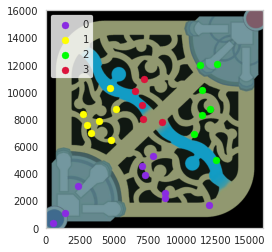

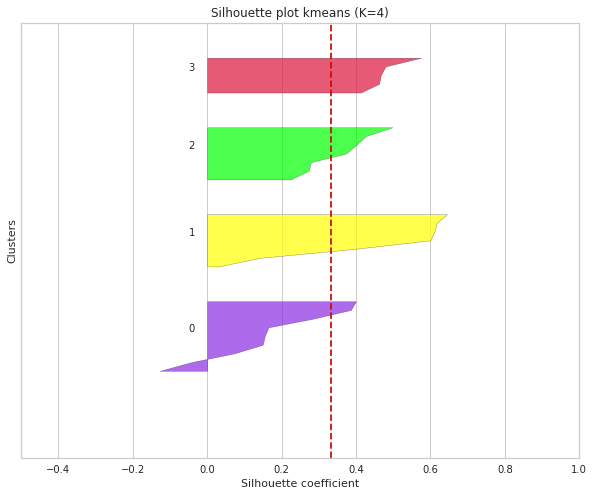

Kmeans silhouette_score 0.3338223070695721
Locations in cluster 0: 9
Locations in cluster 1: 7
Locations in cluster 2: 7
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
14: EUW1_6160353201 - Blue team Victory


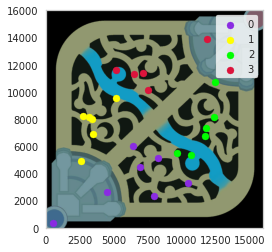

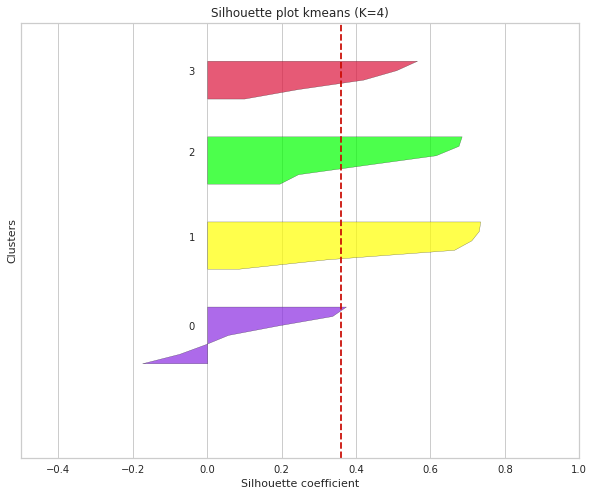

Kmeans silhouette_score 0.3590554748400426
Locations in cluster 0: 7
Locations in cluster 1: 6
Locations in cluster 2: 6
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
15: EUW1_6160146060 - Blue team Victory


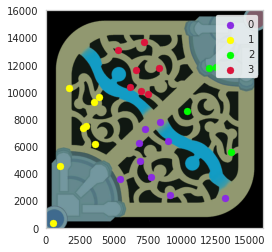

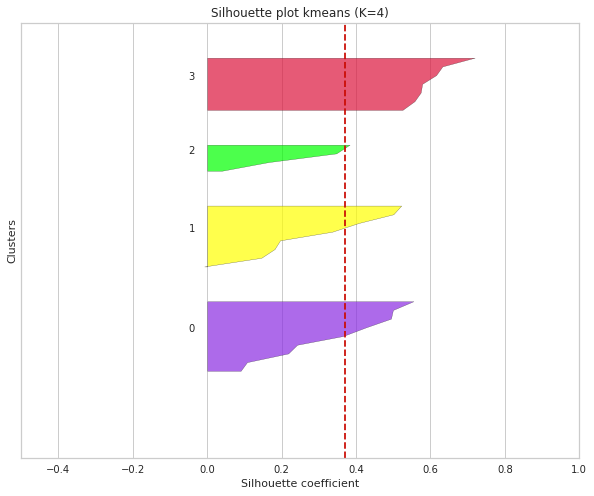

Kmeans silhouette_score 0.3717149691456873
Locations in cluster 0: 9
Locations in cluster 1: 8
Locations in cluster 2: 4
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
16: EUW1_6156559340 - Blue team Victory


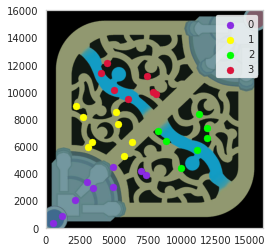

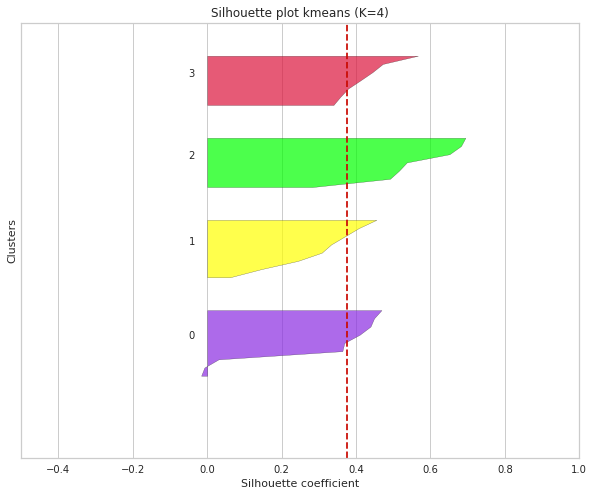

Kmeans silhouette_score 0.37586214249356475
Locations in cluster 0: 9
Locations in cluster 1: 8
Locations in cluster 2: 7
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
17: EUW1_6156430957 - Blue team Victory


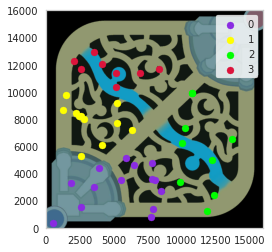

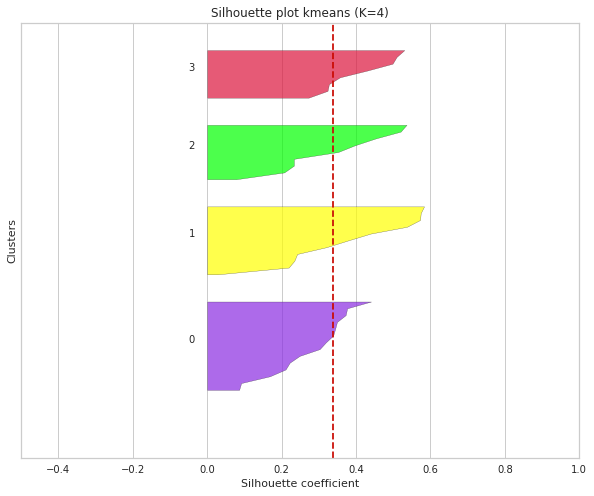

Kmeans silhouette_score 0.339311856812767
Locations in cluster 0: 14
Locations in cluster 1: 11
Locations in cluster 2: 9
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
18: EUW1_6155407030 - Blue team Victory


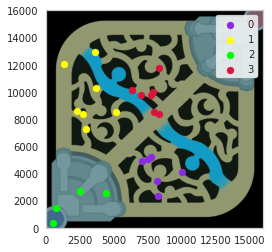

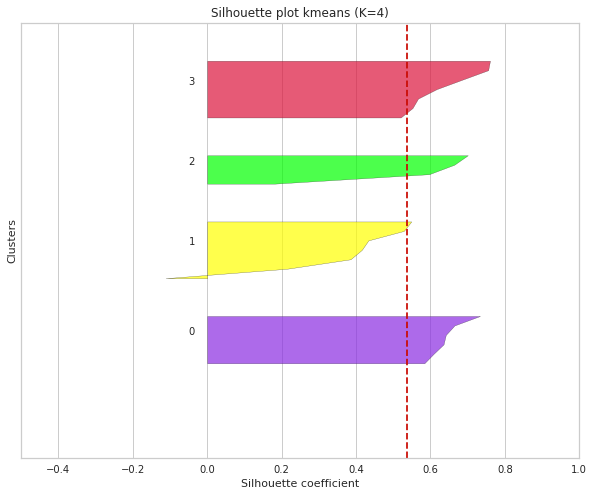

Kmeans silhouette_score 0.5366718907801847
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
19: EUW1_6154372504 - Blue team Victory


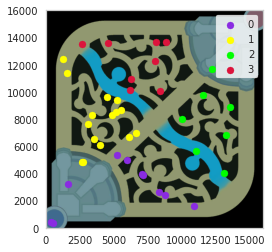

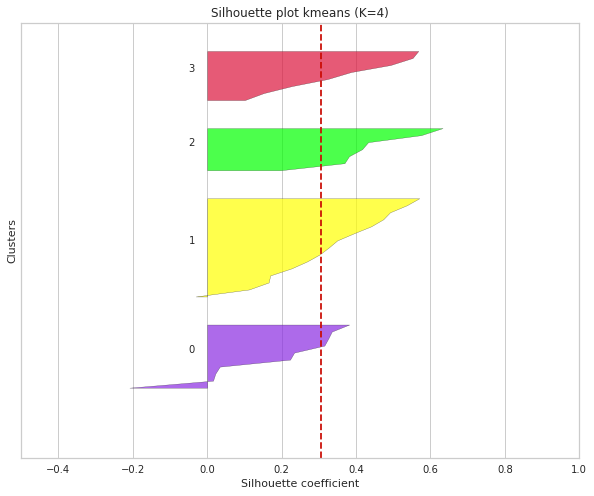

Kmeans silhouette_score 0.30693243537670273
Locations in cluster 0: 10
Locations in cluster 1: 15
Locations in cluster 2: 7
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
20: EUW1_6154082054 - Blue team Victory


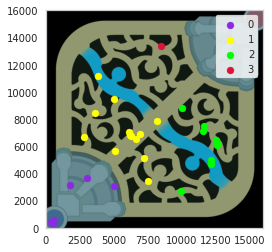

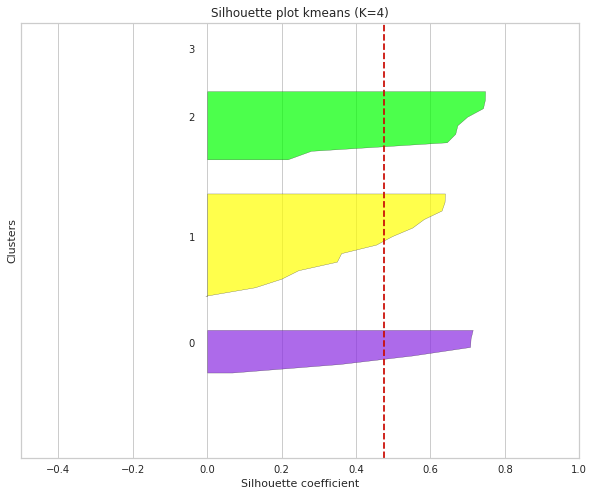

Kmeans silhouette_score 0.4752272974940943
Locations in cluster 0: 6
Locations in cluster 1: 13
Locations in cluster 2: 9
Locations in cluster 3: 1

--------------------------------------------------------------------------------------


In [107]:
n = 1
for game in blueTeamWins_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Victory".format(n, game, game_df["team"].unique()[0]))
    clustering(game_df)
    n += 1

When blue team loses:

In [108]:
blueTeamLoses_df = blueTeam_df.loc[blueTeam_df["won"] == False]
print("Blue Team losing Data Frame:\n{}".format(blueTeamLoses_df))
print("\nElyoya lost {} matches on the blue team.".format(blueTeamLoses_df["gameId"].nunique()))

Blue Team losing Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team    won
277   EUW1_6169858331   0.000000           554           581  Blue  False
278   EUW1_6169858331   1.000350          5164          8533  Blue  False
279   EUW1_6169858331   2.000733          2405          8256  Blue  False
280   EUW1_6169858331   3.000983          8084          5128  Blue  False
281   EUW1_6169858331   4.001250         11371          5748  Blue  False
...               ...        ...           ...           ...   ...    ...
1947  EUW1_6153946340  20.005633          4904          4696  Blue  False
1948  EUW1_6153946340  21.005933          3570          6533  Blue  False
1949  EUW1_6153946340  22.006317          3522          9030  Blue  False
1950  EUW1_6153946340  23.006850          1541          1053  Blue  False
1951  EUW1_6153946340  23.306067          1226           503  Blue  False

[527 rows x 6 columns]

Elyoya lost 19 matches on the blue team.


1: EUW1_6169858331 - Blue team Defeat


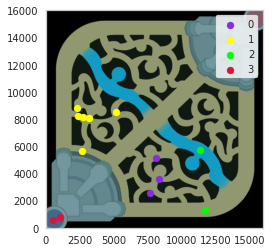

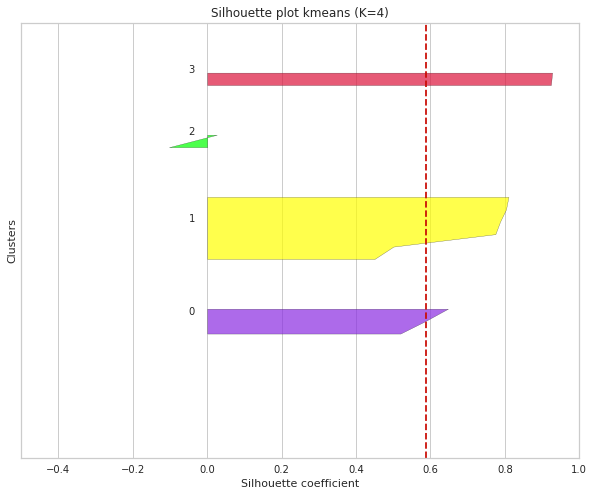

Kmeans silhouette_score 0.588568785802535
Locations in cluster 0: 3
Locations in cluster 1: 6
Locations in cluster 2: 2
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
2: EUW1_6169193635 - Blue team Defeat


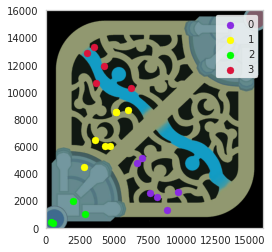

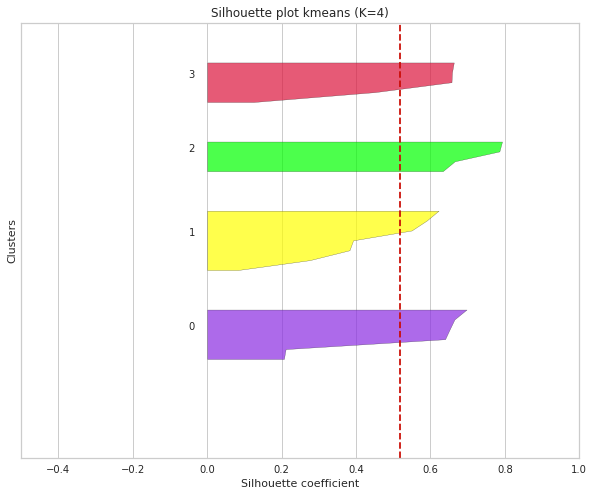

Kmeans silhouette_score 0.517887007986451
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
3: EUW1_6167017540 - Blue team Defeat


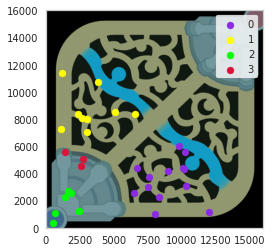

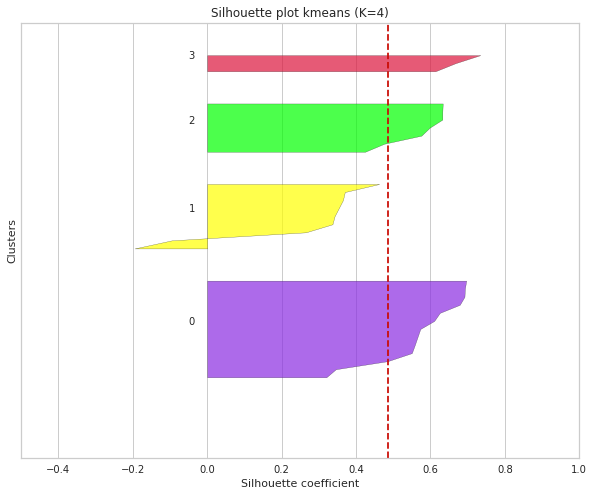

Kmeans silhouette_score 0.4869460466440596
Locations in cluster 0: 13
Locations in cluster 1: 9
Locations in cluster 2: 7
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
4: EUW1_6166396166 - Blue team Defeat


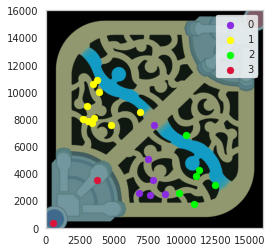

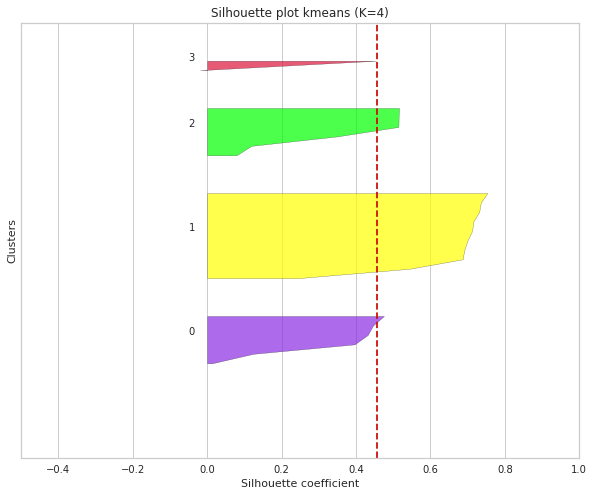

Kmeans silhouette_score 0.45511207211083765
Locations in cluster 0: 6
Locations in cluster 1: 10
Locations in cluster 2: 6
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
5: EUW1_6163920728 - Blue team Defeat


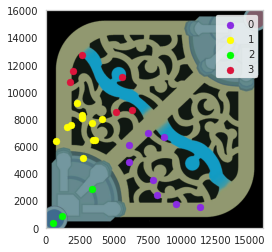

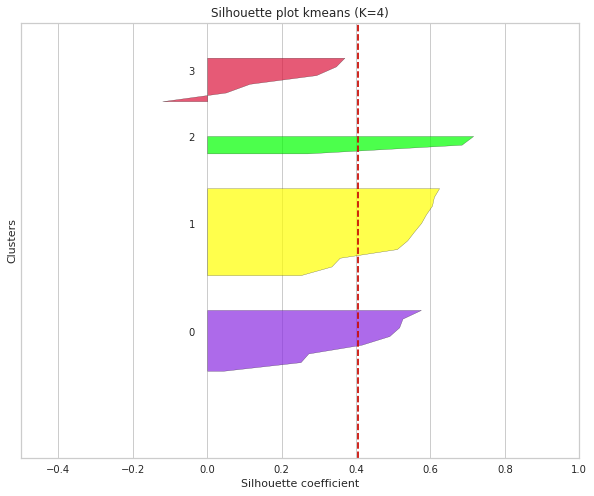

Kmeans silhouette_score 0.405289058335367
Locations in cluster 0: 8
Locations in cluster 1: 11
Locations in cluster 2: 3
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
6: EUW1_6163819437 - Blue team Defeat


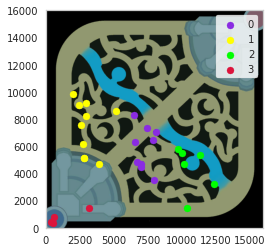

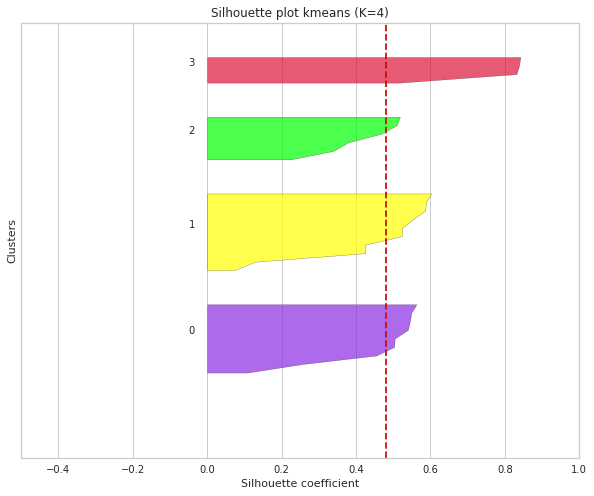

Kmeans silhouette_score 0.47982759451637275
Locations in cluster 0: 9
Locations in cluster 1: 10
Locations in cluster 2: 6
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
7: EUW1_6163787785 - Blue team Defeat


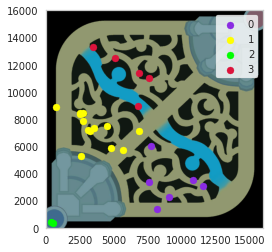

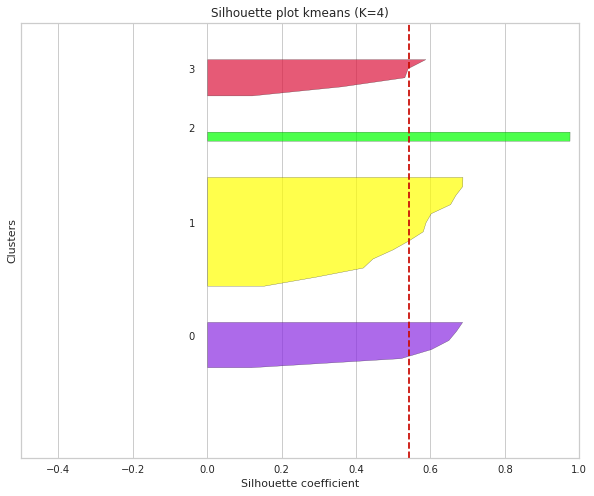

Kmeans silhouette_score 0.5434449128392393
Locations in cluster 0: 6
Locations in cluster 1: 13
Locations in cluster 2: 2
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
8: EUW1_6162658973 - Blue team Defeat


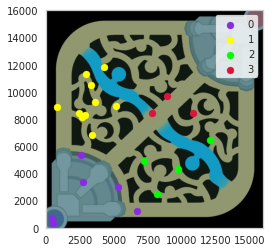

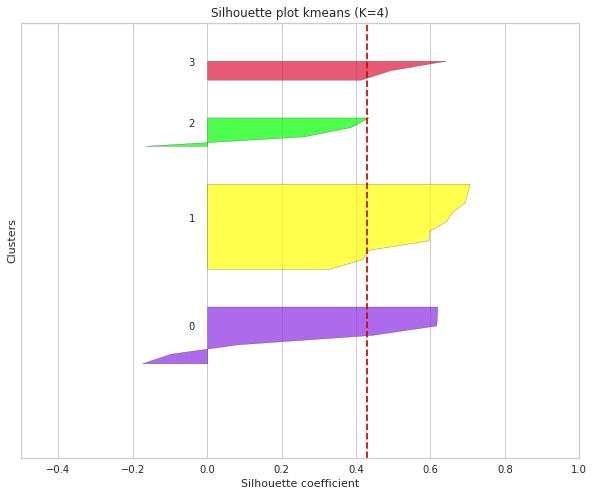

Kmeans silhouette_score 0.4302391688565827
Locations in cluster 0: 7
Locations in cluster 1: 10
Locations in cluster 2: 4
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
9: EUW1_6161574129 - Blue team Defeat


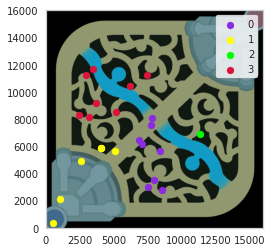

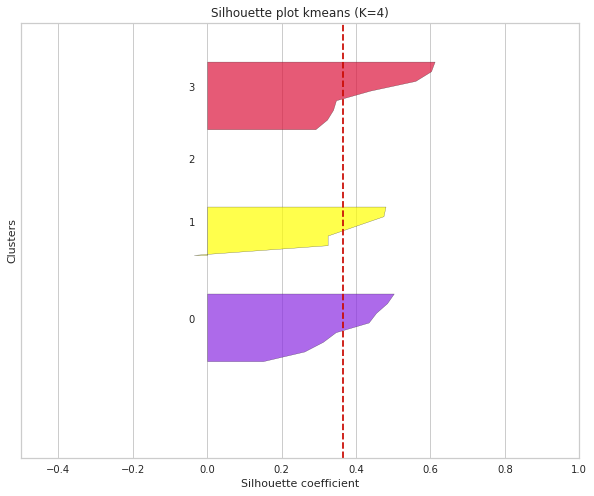

Kmeans silhouette_score 0.3656988380009988
Locations in cluster 0: 8
Locations in cluster 1: 6
Locations in cluster 2: 1
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
10: EUW1_6161529208 - Blue team Defeat


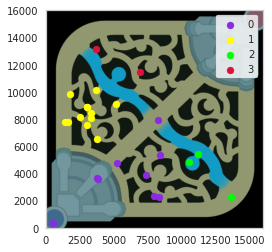

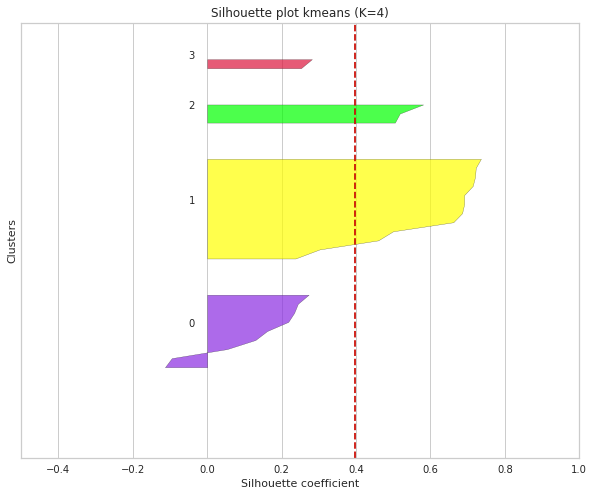

Kmeans silhouette_score 0.39831980833663116
Locations in cluster 0: 9
Locations in cluster 1: 12
Locations in cluster 2: 3
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
11: EUW1_6160920662 - Blue team Defeat


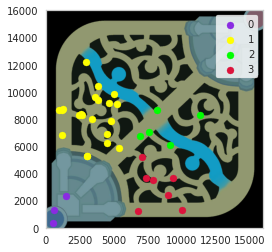

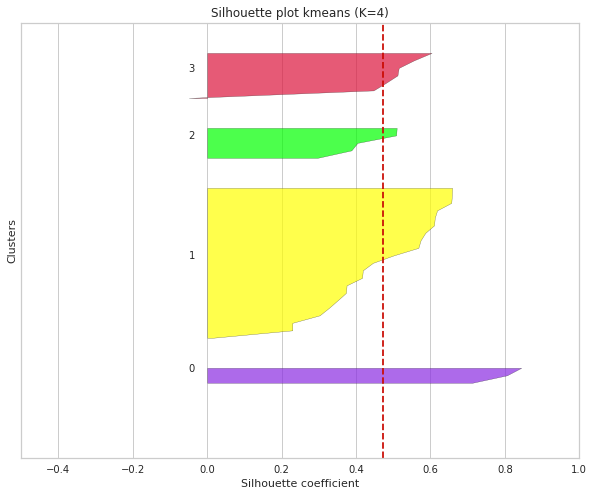

Kmeans silhouette_score 0.4735149289654887
Locations in cluster 0: 3
Locations in cluster 1: 21
Locations in cluster 2: 5
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
12: EUW1_6160297288 - Blue team Defeat


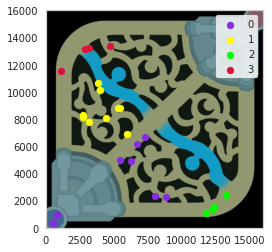

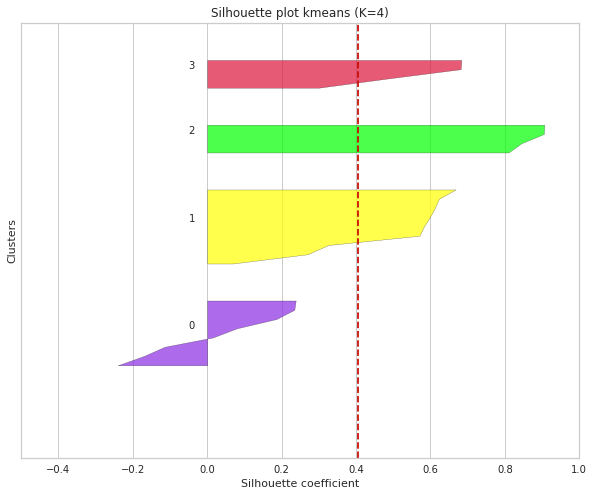

Kmeans silhouette_score 0.40645123675732464
Locations in cluster 0: 8
Locations in cluster 1: 9
Locations in cluster 2: 4
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
13: EUW1_6160122620 - Blue team Defeat


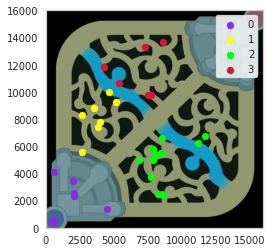

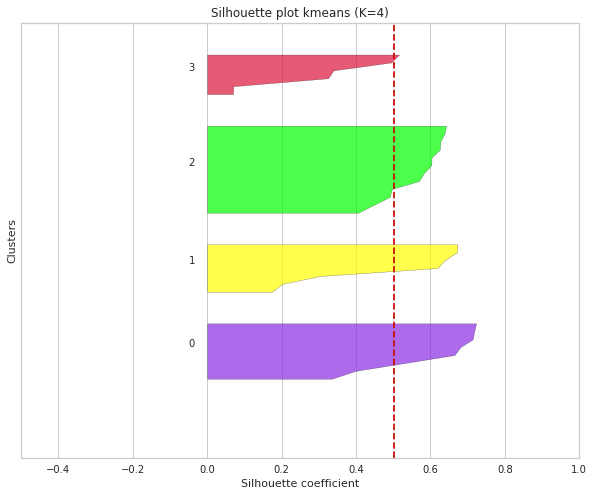

Kmeans silhouette_score 0.5027131718273191
Locations in cluster 0: 8
Locations in cluster 1: 7
Locations in cluster 2: 12
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
14: EUW1_6156848197 - Blue team Defeat


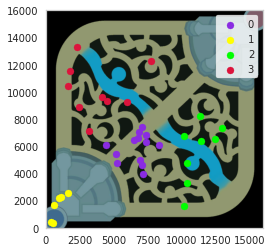

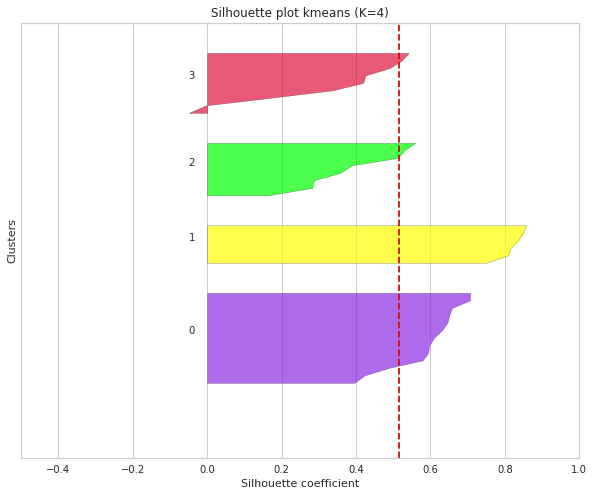

Kmeans silhouette_score 0.5147233711072742
Locations in cluster 0: 13
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 9

--------------------------------------------------------------------------------------
15: EUW1_6156652620 - Blue team Defeat


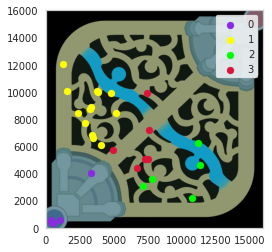

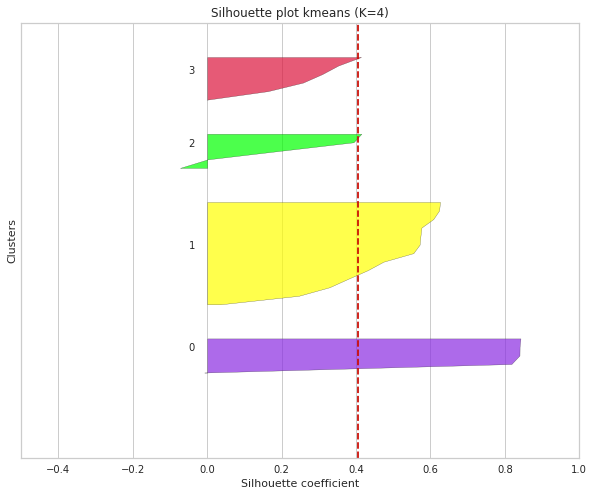

Kmeans silhouette_score 0.4063128208477446
Locations in cluster 0: 5
Locations in cluster 1: 13
Locations in cluster 2: 5
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
16: EUW1_6156323238 - Blue team Defeat


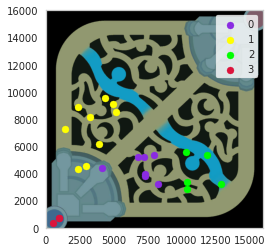

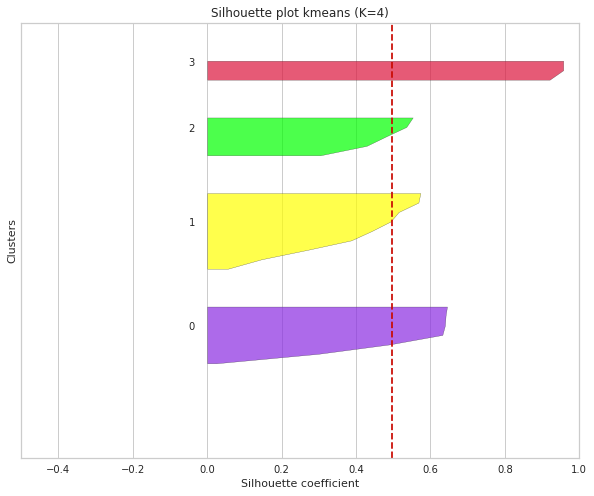

Kmeans silhouette_score 0.4980902832452907
Locations in cluster 0: 7
Locations in cluster 1: 9
Locations in cluster 2: 5
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
17: EUW1_6155602476 - Blue team Defeat


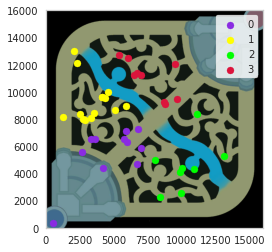

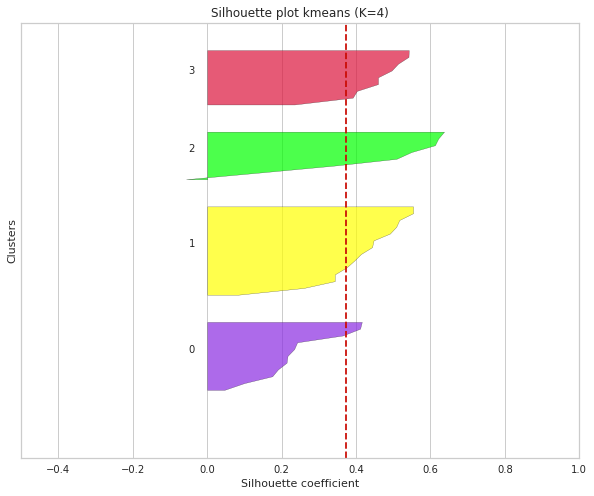

Kmeans silhouette_score 0.37436148778715667
Locations in cluster 0: 11
Locations in cluster 1: 14
Locations in cluster 2: 8
Locations in cluster 3: 9

--------------------------------------------------------------------------------------
18: EUW1_6155459687 - Blue team Defeat


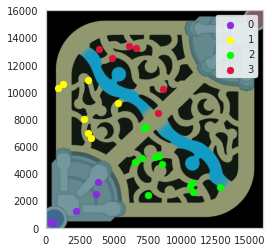

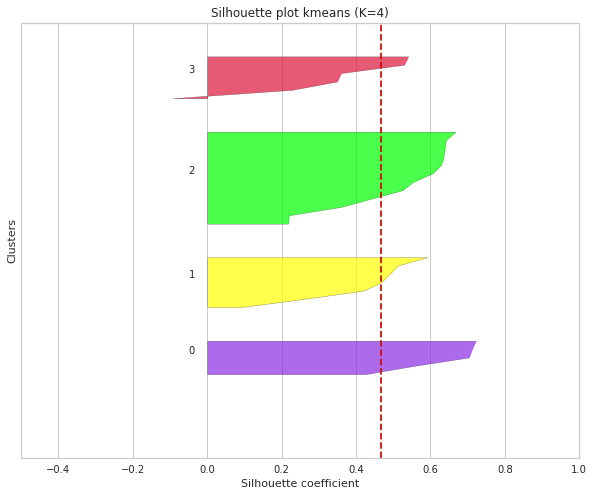

Kmeans silhouette_score 0.46643003055993726
Locations in cluster 0: 5
Locations in cluster 1: 7
Locations in cluster 2: 12
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
19: EUW1_6153946340 - Blue team Defeat


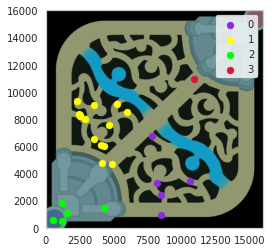

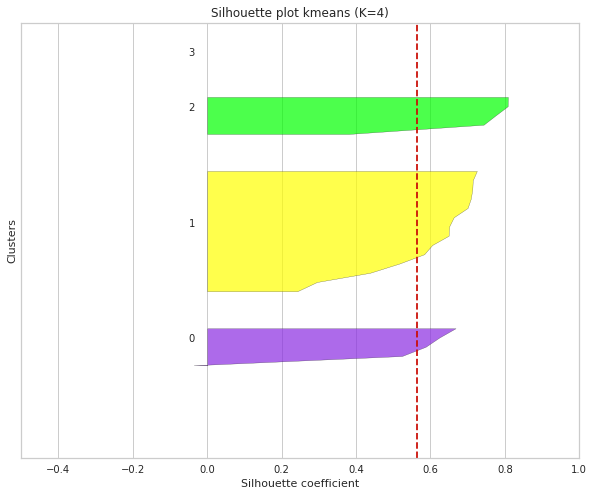

Kmeans silhouette_score 0.5631993669839733
Locations in cluster 0: 5
Locations in cluster 1: 14
Locations in cluster 2: 5
Locations in cluster 3: 1

--------------------------------------------------------------------------------------


In [109]:
n = 1
for game in blueTeamLoses_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Defeat".format(n, game, game_df["team"].unique()[0]))
    clustering(game_df)
    n += 1

#### Clustering all games played on the blue team

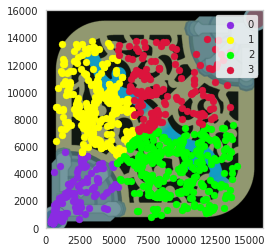

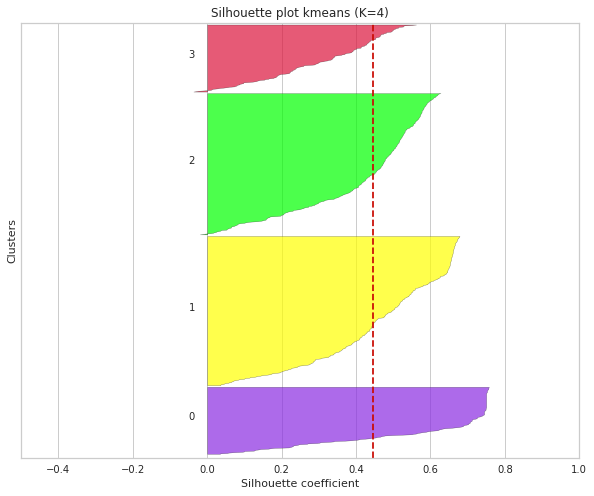

Kmeans silhouette_score 0.44513692515646064
Locations in cluster 0: 169
Locations in cluster 1: 375
Locations in cluster 2: 355
Locations in cluster 3: 169

--------------------------------------------------------------------------------------


In [110]:
clustering(blueTeam_df)

Blue team wins:

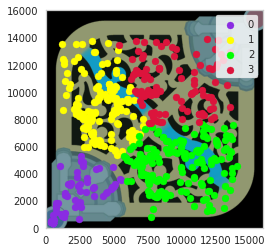

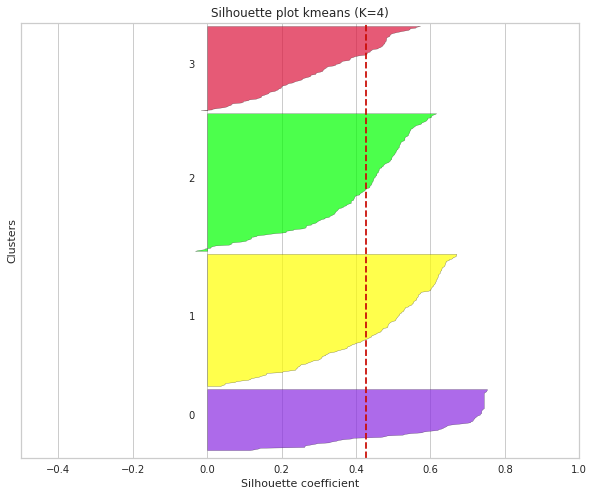

Kmeans silhouette_score 0.42780675144747604
Locations in cluster 0: 80
Locations in cluster 1: 172
Locations in cluster 2: 179
Locations in cluster 3: 110

--------------------------------------------------------------------------------------


In [111]:
clustering(blueTeamWins_df)

Blue team loses:

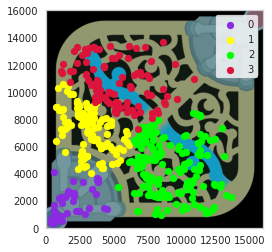

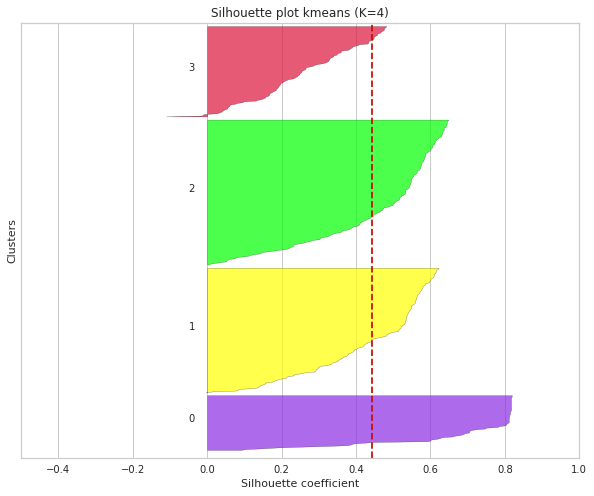

Kmeans silhouette_score 0.44289816378190683
Locations in cluster 0: 70
Locations in cluster 1: 158
Locations in cluster 2: 184
Locations in cluster 3: 115

--------------------------------------------------------------------------------------


In [112]:
clustering(blueTeamLoses_df)

finding the point in time and the place where elyoya dies more

In [113]:
match = 0
playerData = []
for jungle_match in jungle_matches:
    matchTimeLine = lol_watcher.match.timeline_by_match(my_region, jungle_match)
    for row in matchTimeLine["info"]["frames"]:
        events = row.get("events")
        for event in events:
            if(event["type"] == "CHAMPION_KILL" and event["victimId"] == player_id[match]):
                    #print(event["position"]["x"])
                    playerData_row = {}
                    playerData_row["gameId"] = jungle_match
                    playerData_row["timestamp"] = (event["timestamp"]/(1000*60))%60
                    playerData_row["coordinate_x"] = event["position"]["x"]
                    playerData_row["coordinate_y"] = event["position"]["y"]

                    if(player_id[match] > 5):
                        playerData_row["team"] = "Red"
                    else:
                        playerData_row["team"] = "Blue"

                    playerData_row["won"] = games_won[match]
                    playerData.append(playerData_row)
    match += 1
    

In [114]:
df2 = pd.DataFrame(playerData)
df2

,gameId,timestamp,coordinate_x,coordinate_y,team,won
0,EUW1_6176366691,21.720583,12404,5108,Blue,True
1,EUW1_6176366691,25.262017,9969,9341,Blue,True
2,EUW1_6176325099,8.016383,2786,12589,Red,False
3,EUW1_6176325099,11.962700,5941,10686,Red,False
4,EUW1_6176325099,16.020583,4889,14117,Red,False
...,...,...,...,...,...,...
337,EUW1_6151765282,10.275317,9230,3420,Red,False
338,EUW1_6151765282,18.499917,8676,4086,Red,False
339,EUW1_6151765282,22.274517,4767,8935,Red,False
340,EUW1_6151765282,26.530883,7572,12304,Red,False


In [115]:
#df2.to_csv('../DataExtracted/Deaths/ElyoyaDeathsData.csv', index=False)

In [116]:
df2 = pd.read_csv("../DataExtracted/Deaths/ElyoyaDeathsData.csv")
df2

,gameId,timestamp,coordinate_x,coordinate_y,team,won
0,EUW1_6176366691,21.720583,12404,5108,Blue,True
1,EUW1_6176366691,25.262017,9969,9341,Blue,True
2,EUW1_6176325099,8.016383,2786,12589,Red,False
3,EUW1_6176325099,11.962700,5941,10686,Red,False
4,EUW1_6176325099,16.020583,4889,14117,Red,False
...,...,...,...,...,...,...
337,EUW1_6151765282,10.275317,9230,3420,Red,False
338,EUW1_6151765282,18.499917,8676,4086,Red,False
339,EUW1_6151765282,22.274517,4767,8935,Red,False
340,EUW1_6151765282,26.530883,7572,12304,Red,False


Separate data into red team deaths and blue team deaths

In [117]:
redTeam_df = df2.loc[df2["team"] == "Red"]
print("Red Team Data Frame:\n{}".format(redTeam_df))

Red Team Data Frame:
              gameId  timestamp  coordinate_x  coordinate_y team    won
2    EUW1_6176325099   8.016383          2786         12589  Red  False
3    EUW1_6176325099  11.962700          5941         10686  Red  False
4    EUW1_6176325099  16.020583          4889         14117  Red  False
5    EUW1_6176325099  17.834050          5045         13647  Red  False
21   EUW1_6173376101  14.182700         11389          6374  Red   True
..               ...        ...           ...           ...  ...    ...
337  EUW1_6151765282  10.275317          9230          3420  Red  False
338  EUW1_6151765282  18.499917          8676          4086  Red  False
339  EUW1_6151765282  22.274517          4767          8935  Red  False
340  EUW1_6151765282  26.530883          7572         12304  Red  False
341  EUW1_6151765282  30.540083         12258          8480  Red  False

[164 rows x 6 columns]


In [118]:
blueTeam_df = df2.loc[df2["team"] == "Blue"]
print("Blue Team Data Frame:\n{}".format(blueTeam_df))

Blue Team Data Frame:
              gameId  timestamp  coordinate_x  coordinate_y  team    won
0    EUW1_6176366691  21.720583         12404          5108  Blue   True
1    EUW1_6176366691  25.262017          9969          9341  Blue   True
6    EUW1_6176273615  11.350333          7598          8776  Blue   True
7    EUW1_6176273615  14.814133         13154          7364  Blue   True
8    EUW1_6176273615  16.108933          1724         11006  Blue   True
..               ...        ...           ...           ...   ...    ...
325  EUW1_6153946340  11.168217          5546          7482  Blue  False
326  EUW1_6153946340  13.498417          9593          1133  Blue  False
327  EUW1_6153946340  19.039867         11681         10935  Blue  False
328  EUW1_6153946340  22.261667          2546          7310  Blue  False
329  EUW1_6153946340  23.078483          1226           503  Blue  False

[178 rows x 6 columns]


---

In [119]:
centroids = np.array([[8250, 4250], [4000, 8750],[12000, 7500], [7750, 12000]])

In [120]:
def clusteringDeaths(df2):
    nc = df2.shape[1]
    df_array = df2.values
    X = df_array[:, 2:4]
    kms = KMeans(n_clusters=4, init= centroids, n_init=1, algorithm="elkan").fit(X)
    label = kms.fit_predict(X)

    #---------------
    #plot clusters
    centroids2 = kms.cluster_centers_
    u_labels = np.unique(label)
    img = plt.imread("map11.png")
    fig, ax = plt.subplots()
    ax.imshow(img, extent=[0, 16000, 0, 16000])

    #plotting the results:

    for i in u_labels:
        ax.scatter(X[label == i , 0] , X[label == i , 1] , label = i, color = np.array(["blueviolet", "yellow", "lime", "crimson"])[i])
    ax.legend(frameon = True)
    plt.grid(visible=None)
    plt.show()

    drawSillouette(X, kms.labels_, "kmeans (K=4)")
    print("Kmeans silhouette_score", silhouette_score(X, kms.labels_))

    print("Deaths in cluster 0: {}\nDeaths in cluster 1: {}\nDeaths in cluster 2: {}\nDeaths in cluster 3: {}\n".format(Counter(kms.labels_).get(0),Counter(kms.labels_).get(1),Counter(kms.labels_).get(2),Counter(kms.labels_).get(3)))

deaths on the red team

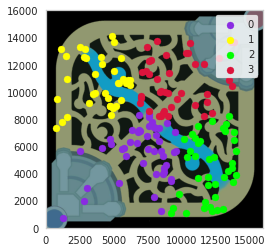

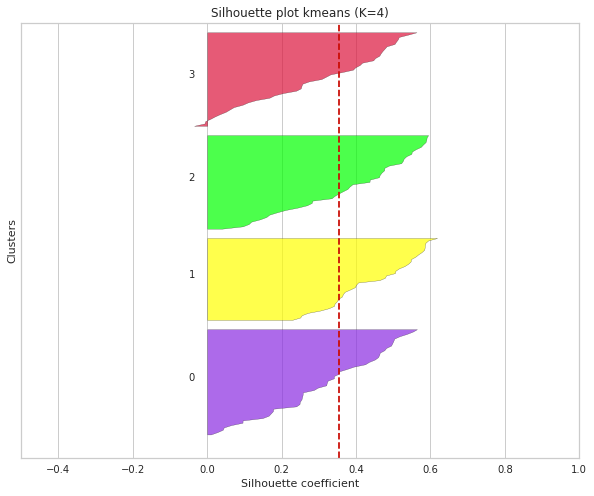

Kmeans silhouette_score 0.3542735253975703
Deaths in cluster 0: 46
Deaths in cluster 1: 36
Deaths in cluster 2: 41
Deaths in cluster 3: 41



In [121]:
clusteringDeaths(redTeam_df)

deaths on the blue team

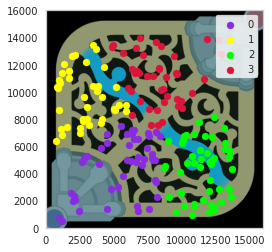

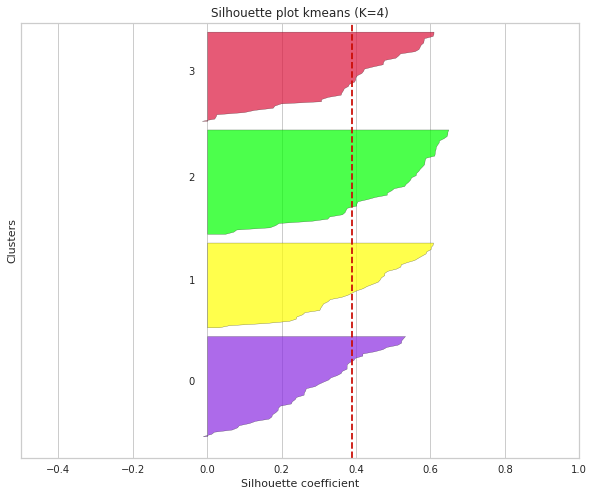

Kmeans silhouette_score 0.3884211623036306
Deaths in cluster 0: 47
Deaths in cluster 1: 40
Deaths in cluster 2: 49
Deaths in cluster 3: 42



In [122]:
clusteringDeaths(blueTeam_df)

Without defining the initial centroids

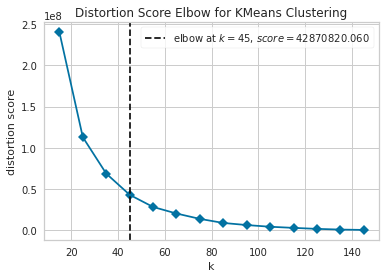

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [123]:
nc = redTeam_df.shape[1]
df_array = redTeam_df.values
X = df_array[:, 2:4]
ks = np.arange(15,150, 10)
model = KMeans()
visualizer = KElbowVisualizer(model, k=ks, timings=False)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()    

In [124]:
def drawSillouette2(X, labels, header="" ):
    y_lower =10
    clusters=list(set(labels))
    n_clusters=len(clusters)

    fig = plt.figure(figsize=(10,8))
    ax1 = plt.gca()
    ax1.set_xlim([-0.5, 1])
    ax1.set_ylim([0, len(X) + (n_clusters) * 3+ y_lower])
    sil_avg = silhouette_score(X, labels)
    silhouette_values = silhouette_samples(X, labels)
    for i,c in enumerate(clusters):
        cs_values = silhouette_values[labels == c]
        cs_values.sort()
        size_ci = cs_values.shape[0]
        y_upper = y_lower + size_ci
        color = cm.nipy_spectral(i / n_clusters) #
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, cs_values, facecolor=color, edgecolor="k", alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_ci, str(c))
        y_lower = y_upper + 3  # 10 for the 0 samples
    ax1.set_title("Silhouette plot "+ header)
    ax1.set_xlabel("Silhouette coefficient")
    ax1.set_ylabel("Clusters")
    ax1.axvline(x=sil_avg, c="r", linestyle="--")

    ax1.set_yticks([]) 
    plt.show()

In [125]:
def clusteringDeathsV2(df2):
    nc = df2.shape[1]
    df_array = df2.values
    X = df_array[:, 2:4]
    kms = KMeans(n_clusters=45, random_state=42).fit(X)
    label = kms.fit_predict(X)

    #---------------
    #plot clusters
    centroids2 = kms.cluster_centers_
    u_labels = np.unique(label)
    img = plt.imread("map11.png")
    fig, ax = plt.subplots()
    ax.imshow(img, extent=[0, 16000, 0, 16000])

    #plotting the results:
    for i in u_labels:
        ax.scatter(X[label == i , 0] , X[label == i , 1] , label = i, color = cm.nipy_spectral(i / 45))

    ax.legend(
        loc='upper center', 
        bbox_to_anchor=(0.5, 1.45),
        ncol=10, 
    )
    ax.grid(visible=None)
    plt.show()

    drawSillouette2(X, kms.labels_, "kmeans (K=4)")
    print("Kmeans silhouette_score", silhouette_score(X, kms.labels_))

    max_deaths = 0
    max_deaths_cluster = 0
    for cluster in range(45):
        #print("Deaths in Cluster {}: {}".format(cluster,Counter(kms.labels_).get(cluster)))
        deaths = int(Counter(kms.labels_).get(cluster))
        if(deaths > max_deaths):
            max_deaths = Counter(kms.labels_).get(cluster)
            max_deaths_cluster = cluster

    print("Cluster {} is the cluster with more number of deaths. It has {} deaths.".format(max_deaths_cluster, max_deaths))
        

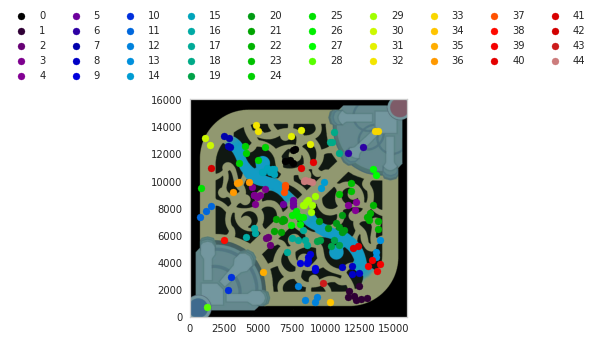

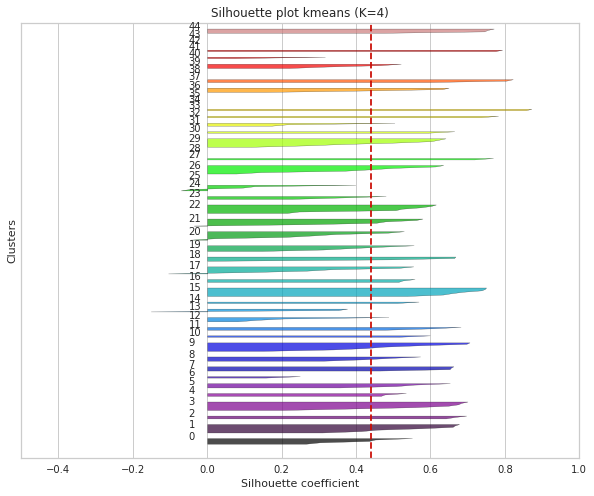

Kmeans silhouette_score 0.44158093174095914
Cluster 1 is the cluster with more number of deaths. It has 7 deaths.


In [126]:
clusteringDeathsV2(redTeam_df)

Blue Team

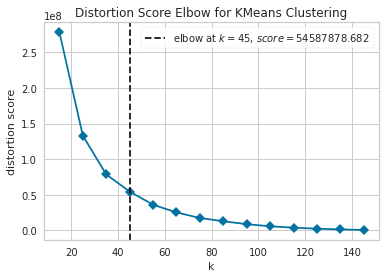

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [127]:
nc = blueTeam_df.shape[1]
df_array = blueTeam_df.values
X = df_array[:, 2:4]
ks = np.arange(15,150, 10)
model = KMeans()
visualizer = KElbowVisualizer(model, k=ks, timings=False)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()    

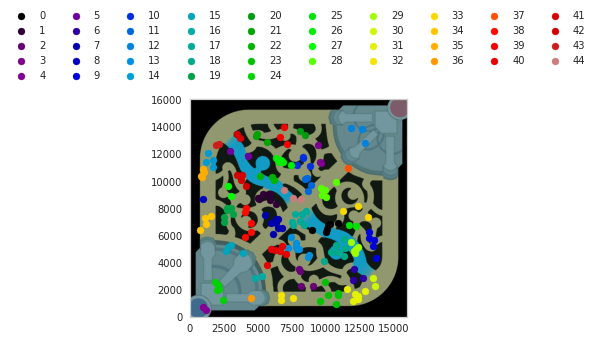

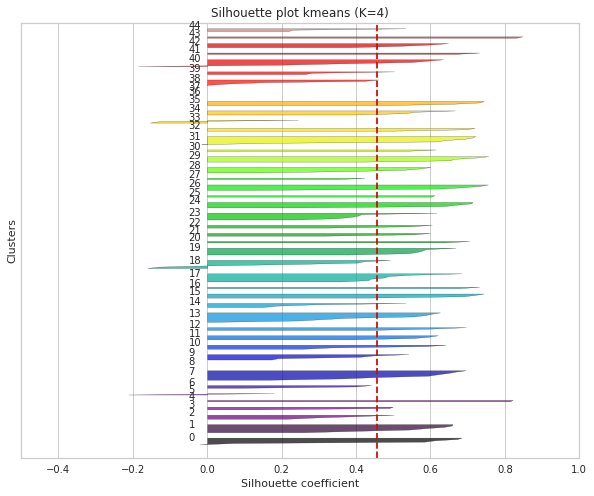

Kmeans silhouette_score 0.45755047312989694
Cluster 7 is the cluster with more number of deaths. It has 8 deaths.


In [128]:
clusteringDeathsV2(blueTeam_df)

In [129]:
import json
with open('JSON_prints/data.json', 'w', encoding='utf-8') as f:
    json.dump(match, f, ensure_ascii=False, indent=4)

In [130]:
import json
with open('JSON_prints/MatchTimeline2.json', 'w', encoding='utf-8') as f:
    json.dump(matchTimeLine, f, ensure_ascii=False, indent=4)

In [131]:
#Clash API only works when Clash is active
clash = lol_watcher.clash.tournaments(my_region)
clash

[{'id': 36061,
  'themeId': 4,
  'nameKey': 'aram2022',
  'nameKeySecondary': 'day_2',
  'schedule': [{'id': 35241,
    'registrationTime': 1670773500000,
    'startTime': 1670788800000,
    'cancelled': False}]},
 {'id': 36041,
  'themeId': 4,
  'nameKey': 'aram2022',
  'nameKeySecondary': 'day_1',
  'schedule': [{'id': 35221,
    'registrationTime': 1670687100000,
    'startTime': 1670702400000,
    'cancelled': False}]}]

---

### Red Team Wins (outliers removed)

In [15]:
df

,gameId,timestamp,coordinate_x,coordinate_y,team,won
0,EUW1_6176366691,0.000000,557,345,Blue,True
1,EUW1_6176366691,1.000250,5633,9332,Blue,True
2,EUW1_6176366691,2.000750,8149,2265,Blue,True
3,EUW1_6176366691,3.001350,11532,4753,Blue,True
4,EUW1_6176366691,4.001617,11454,3261,Blue,True
...,...,...,...,...,...,...
2006,EUW1_6151765282,28.007417,10665,10235,Red,False
2007,EUW1_6151765282,29.007850,9714,5255,Red,False
2008,EUW1_6151765282,30.007983,7293,10934,Red,False
2009,EUW1_6151765282,31.008533,12258,8480,Red,False


In [6]:
df.drop(df[(df['coordinate_x'] <= 6000) & (df["coordinate_y"] <= 6000)].index, inplace = True)
df.drop(df[(df['coordinate_x'] >= 10500) & (df["coordinate_y"] >= 10500)].index, inplace = True)
df

,gameId,timestamp,coordinate_x,coordinate_y,team,won
1,EUW1_6176366691,1.000250,5633,9332,Blue,True
2,EUW1_6176366691,2.000750,8149,2265,Blue,True
3,EUW1_6176366691,3.001350,11532,4753,Blue,True
4,EUW1_6176366691,4.001617,11454,3261,Blue,True
5,EUW1_6176366691,5.001633,1232,13514,Blue,True
...,...,...,...,...,...,...
2005,EUW1_6151765282,27.007400,7572,12304,Red,False
2006,EUW1_6151765282,28.007417,10665,10235,Red,False
2007,EUW1_6151765282,29.007850,9714,5255,Red,False
2008,EUW1_6151765282,30.007983,7293,10934,Red,False


In [7]:
redTeam_df = df.loc[df["team"] == "Red"]
print("Red Team Data Frame:\n{}".format(redTeam_df))
print("\nElyoya played {} matches on the red team.".format(redTeam_df["gameId"].nunique()))

Red Team Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team    won
31    EUW1_6176325099   1.000250          9667          7063  Red  False
32    EUW1_6176325099   2.000350          8037          3520  Red  False
33    EUW1_6176325099   3.000583         11663          7725  Red  False
34    EUW1_6176325099   4.000900          7672          5223  Red  False
35    EUW1_6176325099   5.001633          3604         13800  Red  False
...               ...        ...           ...           ...  ...    ...
2005  EUW1_6151765282  27.007400          7572         12304  Red  False
2006  EUW1_6151765282  28.007417         10665         10235  Red  False
2007  EUW1_6151765282  29.007850          9714          5255  Red  False
2008  EUW1_6151765282  30.007983          7293         10934  Red  False
2009  EUW1_6151765282  31.008533         12258          8480  Red  False

[756 rows x 6 columns]

Elyoya played 33 matches on the red team.


In [8]:
redTeamWins_df = redTeam_df.loc[redTeam_df["won"] == True]
print("Red Team Winning Data Frame:\n{}".format(redTeamWins_df))

print("\nElyoya won {} matches on the red team.".format(redTeamWins_df["gameId"].nunique()))

Red Team Winning Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team   won
160   EUW1_6173376101   1.000200          7269          9759  Red  True
161   EUW1_6173376101   2.000483          7219         12424  Red  True
162   EUW1_6173376101   3.001183         11854          6708  Red  True
163   EUW1_6173376101   4.001733         10439         13946  Red  True
164   EUW1_6173376101   5.002283          3693          6591  Red  True
...               ...        ...           ...           ...  ...   ...
1860  EUW1_6154165838  27.008967         10968          8450  Red  True
1861  EUW1_6154165838  28.009083          8532          4744  Red  True
1862  EUW1_6154165838  29.009500          7563          9749  Red  True
1865  EUW1_6154165838  32.010183          7520          7674  Red  True
1866  EUW1_6154165838  33.010350          9017          6192  Red  True

[387 rows x 6 columns]

Elyoya won 17 matches on the red team.


1: EUW1_6173376101 - Red team Victory
Number of points:  24
distance between initial centroid [8250 4250] and final centroid [8776.4 4197.4] of blue team's bottom jungle: 529.0214740442959 

distance between initial centroid [4000 8750] and final centroid [3839.83333333 8835.83333333] of blue team's top jungle: 181.7160483342683 

distance between initial centroid [12000  7500] and final centroid [11782.16666667  6455.83333333] of red team's bottom jungle: 1066.6467966899293

distance between initial centroid [ 7750 12000] and final centroid [ 7069.85714286 11859.57142857] of red team's top jungle: 694.4886534680883


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


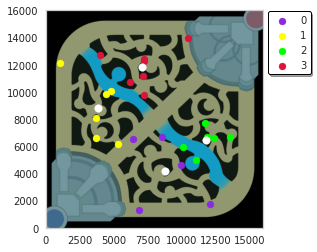

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


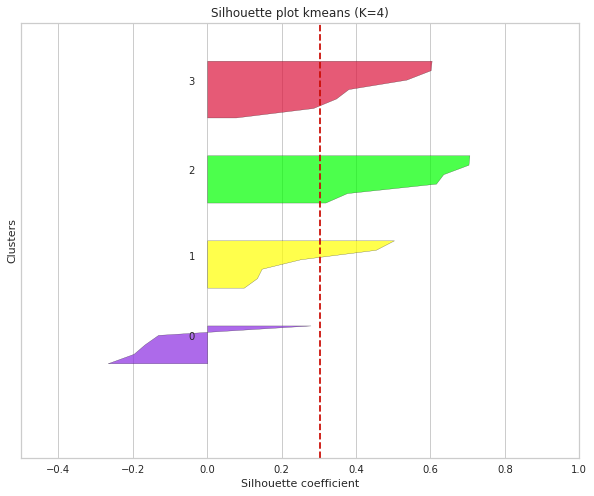

Kmeans silhouette_score 0.30303271109373114
Locations in cluster 0: 5
Locations in cluster 1: 6
Locations in cluster 2: 6
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
2: EUW1_6170116709 - Red team Victory
Number of points:  18
distance between initial centroid [8250 4250] and final centroid [9743.33333333 2472.        ] of blue team's bottom jungle: 2321.9234363872647 

distance between initial centroid [4000 8750] and final centroid [1665.         9299.33333333] of blue team's top jungle: 2398.7480299337635 

distance between initial centroid [12000  7500] and final centroid [12359.6  6792.2] of red team's bottom jungle: 793.9099445151197

distance between initial centroid [ 7750 12000] and final centroid [ 7426.71428571 11212.14285714] of red team's top jungle: 851.6058540265238


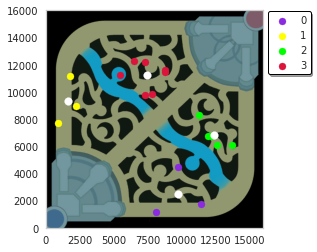

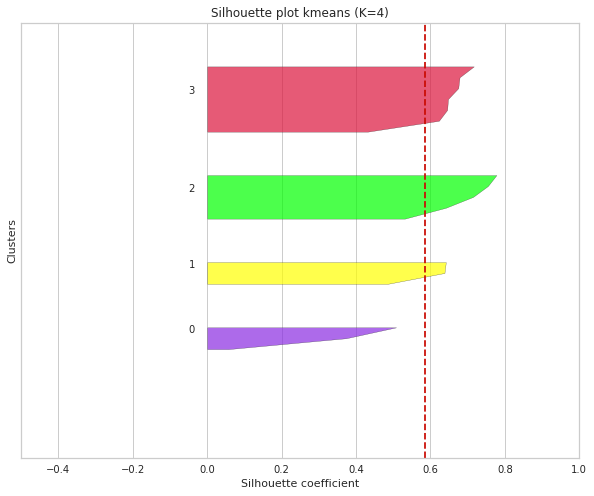

Kmeans silhouette_score 0.5854198932566097
Locations in cluster 0: 3
Locations in cluster 1: 3
Locations in cluster 2: 5
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
3: EUW1_6169961548 - Red team Victory
Number of points:  18
distance between initial centroid [8250 4250] and final centroid [7152.16666667 5637.33333333] of blue team's bottom jungle: 1769.1613283009428 

distance between initial centroid [4000 8750] and final centroid [5423.5  8568.75] of blue team's top jungle: 1434.9926175768292 

distance between initial centroid [12000  7500] and final centroid [11444.5  5640. ] of red team's bottom jungle: 1941.1801178664489

distance between initial centroid [ 7750 12000] and final centroid [ 6440.  11633.5] of red team's top jungle: 1360.3022642045407


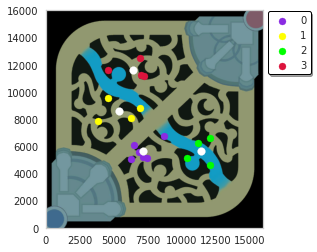

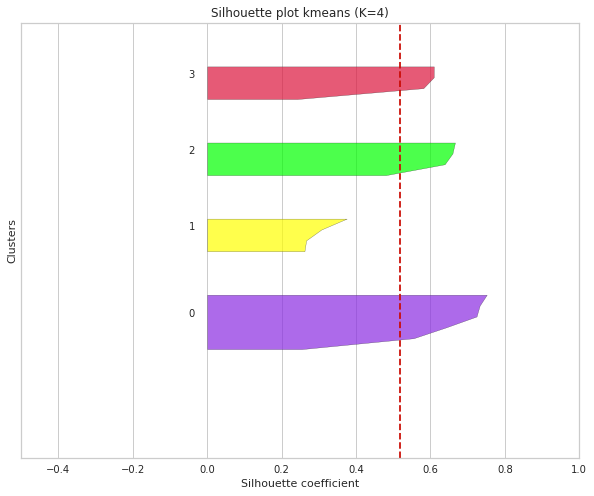

Kmeans silhouette_score 0.5195293988182121
Locations in cluster 0: 6
Locations in cluster 1: 4
Locations in cluster 2: 4
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
4: EUW1_6169756315 - Red team Victory
Number of points:  15
distance between initial centroid [8250 4250] and final centroid [9062.5        3299.33333333] of blue team's bottom jungle: 1250.5692148422295 

distance between initial centroid [4000 8750] and final centroid [3140. 9069.] of blue team's top jungle: 917.2573248549185 

distance between initial centroid [12000  7500] and final centroid [12266.          6250.66666667] of red team's bottom jungle: 1277.3369867727847

distance between initial centroid [ 7750 12000] and final centroid [ 7185. 12431.] of red team's top jungle: 710.6236697436977


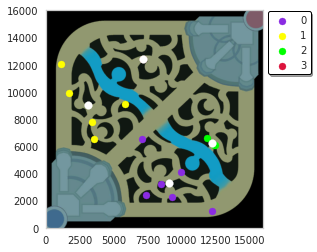

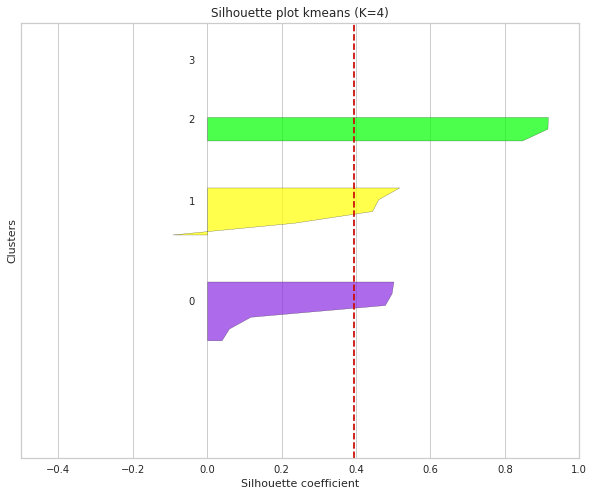

Kmeans silhouette_score 0.3948387518443023
Locations in cluster 0: 6
Locations in cluster 1: 5
Locations in cluster 2: 3
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
5: EUW1_6169361919 - Red team Victory
Number of points:  23
distance between initial centroid [8250 4250] and final centroid [9195.         4084.88888889] of blue team's bottom jungle: 959.3157347882634 

distance between initial centroid [4000 8750] and final centroid [3724.6 9703.2] of blue team's top jungle: 992.1871799212089 

distance between initial centroid [12000  7500] and final centroid [11973.  6065.] of red team's bottom jungle: 1435.2539844919436

distance between initial centroid [ 7750 12000] and final centroid [ 6830.33333333 11213.66666667] of red team's top jungle: 1210.0028466449533


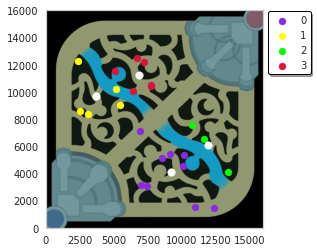

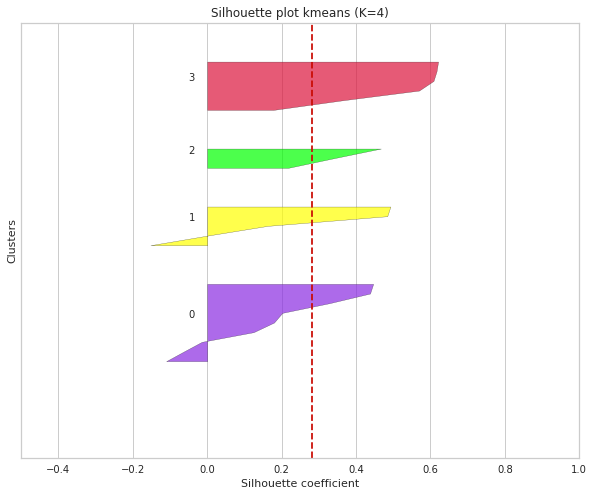

Kmeans silhouette_score 0.28261376039347985
Locations in cluster 0: 9
Locations in cluster 1: 5
Locations in cluster 2: 3
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
6: EUW1_6169332619 - Red team Victory
Number of points:  23
distance between initial centroid [8250 4250] and final centroid [8121.2 3932.4] of blue team's bottom jungle: 342.72321193639624 

distance between initial centroid [4000 8750] and final centroid [5730.66666667 8642.5       ] of blue team's top jungle: 1734.0021225797598 

distance between initial centroid [12000  7500] and final centroid [11180.28571429  7756.57142857] of red team's bottom jungle: 858.9298039789201

distance between initial centroid [ 7750 12000] and final centroid [ 7442.8 10742. ] of red team's top jungle: 1294.9655748320106


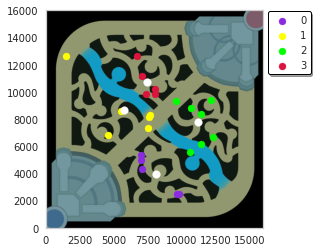

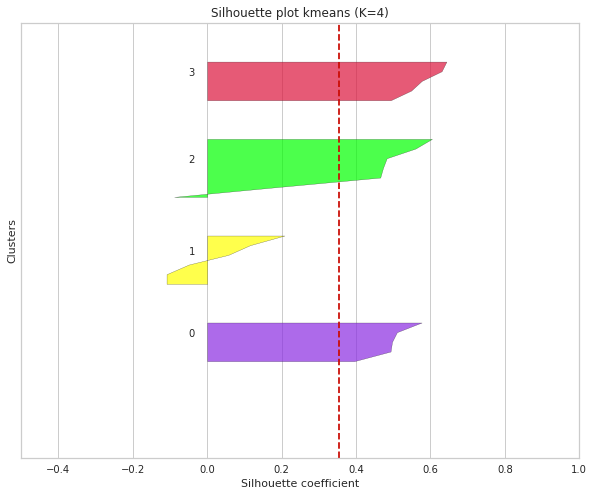

Kmeans silhouette_score 0.35447735422023147
Locations in cluster 0: 5
Locations in cluster 1: 6
Locations in cluster 2: 7
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
7: EUW1_6166266685 - Red team Victory
Number of points:  26
distance between initial centroid [8250 4250] and final centroid [8338.33333333 5365.55555556] of blue team's bottom jungle: 1119.0473516829572 

distance between initial centroid [4000 8750] and final centroid [ 2684.         11062.66666667] of blue team's top jungle: 2660.8801384337303 

distance between initial centroid [12000  7500] and final centroid [11553.5  7499. ] of red team's bottom jungle: 446.5011198194244

distance between initial centroid [ 7750 12000] and final centroid [ 7261.875 11196.5  ] of red team's top jungle: 940.1480019789437


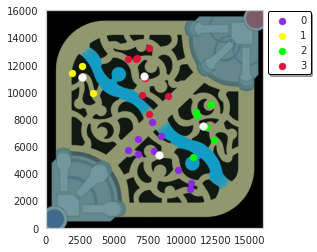

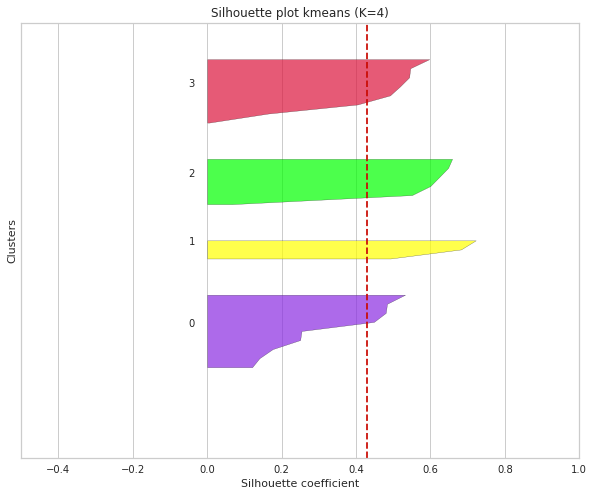

Kmeans silhouette_score 0.43053811080122983
Locations in cluster 0: 9
Locations in cluster 1: 3
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
8: EUW1_6166201683 - Red team Victory
Number of points:  27
distance between initial centroid [8250 4250] and final centroid [8355.         4886.71428571] of blue team's bottom jungle: 645.313940367518 

distance between initial centroid [4000 8750] and final centroid [3371.         9519.88888889] of blue team's top jungle: 994.1679441797385 

distance between initial centroid [12000  7500] and final centroid [12019.2  7158.4] of red team's bottom jungle: 342.1391529772649

distance between initial centroid [ 7750 12000] and final centroid [7583.33333333 9865.5       ] of red team's top jungle: 2140.9969705204576


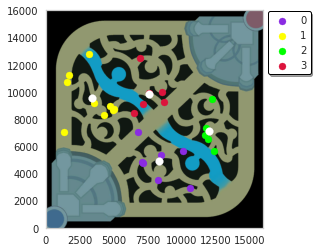

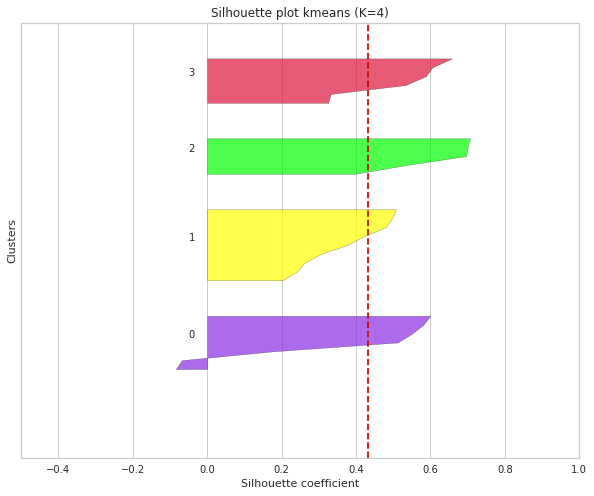

Kmeans silhouette_score 0.431308318684729
Locations in cluster 0: 7
Locations in cluster 1: 9
Locations in cluster 2: 5
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
9: EUW1_6165754722 - Red team Victory
Number of points:  24
distance between initial centroid [8250 4250] and final centroid [8991.66666667 3777.        ] of blue team's bottom jungle: 879.658140668546 

distance between initial centroid [4000 8750] and final centroid [6215. 7683.] of blue team's top jungle: 2458.6000081347106 

distance between initial centroid [12000  7500] and final centroid [11254.4  7089.8] of red team's bottom jungle: 850.9896591616142

distance between initial centroid [ 7750 12000] and final centroid [ 6737.         10833.28571429] of red team's top jungle: 1545.1185147068159


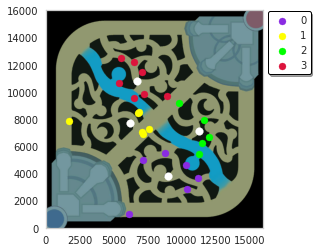

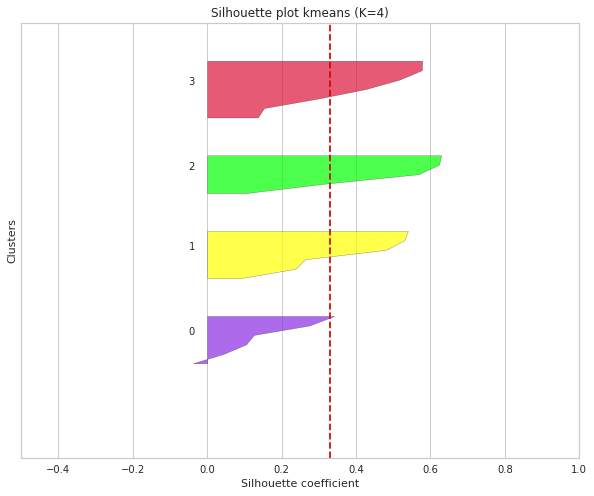

Kmeans silhouette_score 0.3298881667656036
Locations in cluster 0: 6
Locations in cluster 1: 6
Locations in cluster 2: 5
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
10: EUW1_6165735683 - Red team Victory
Number of points:  25
distance between initial centroid [8250 4250] and final centroid [12145.   2287.6] of blue team's bottom jungle: 4361.426230030723 

distance between initial centroid [4000 8750] and final centroid [4674.  9393.5] of blue team's top jungle: 931.8627849635375 

distance between initial centroid [12000  7500] and final centroid [10429.35714286  7321.        ] of red team's bottom jungle: 1580.8099141559926

distance between initial centroid [ 7750 12000] and final centroid [ 6656.5  11480.75] of red team's top jungle: 1210.5217108751085


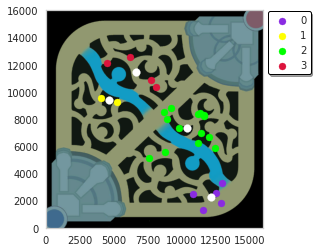

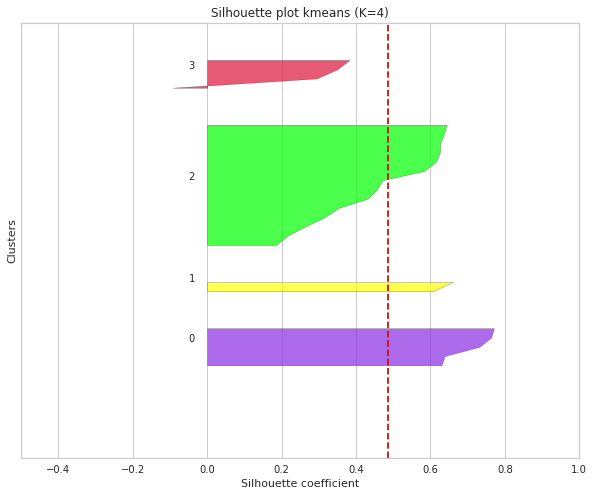

Kmeans silhouette_score 0.4861277706151573
Locations in cluster 0: 5
Locations in cluster 1: 2
Locations in cluster 2: 14
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
11: EUW1_6163695569 - Red team Victory
Number of points:  25
distance between initial centroid [8250 4250] and final centroid [7823.  3985.4] of blue team's bottom jungle: 502.33669983388654 

distance between initial centroid [4000 8750] and final centroid [5174.83333333 9571.66666667] of blue team's top jungle: 1433.6559811273494 

distance between initial centroid [12000  7500] and final centroid [10964.375  7070.   ] of red team's bottom jungle: 1121.3470206073587

distance between initial centroid [ 7750 12000] and final centroid [ 7692.66666667 10739.        ] of red team's top jungle: 1262.3027018552687


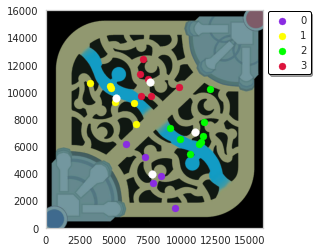

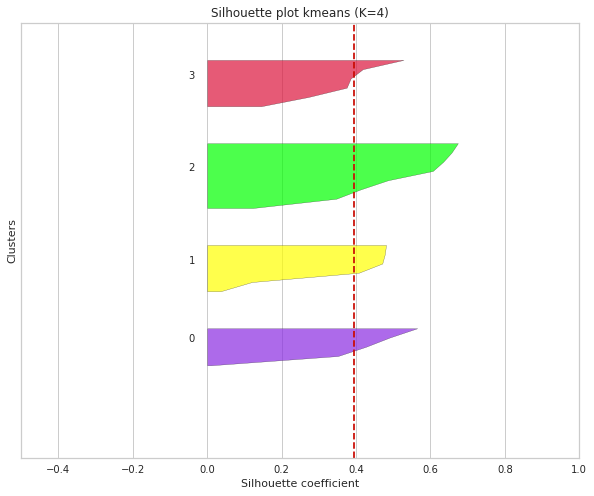

Kmeans silhouette_score 0.3958697966065297
Locations in cluster 0: 5
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
12: EUW1_6163629472 - Red team Victory
Number of points:  18
distance between initial centroid [8250 4250] and final centroid [9743.  3293.8] of blue team's bottom jungle: 1772.9544382188735 

distance between initial centroid [4000 8750] and final centroid [ 3776.8 11374.4] of blue team's top jungle: 2633.874256679692 

distance between initial centroid [12000  7500] and final centroid [10630.25  7495.  ] of red team's bottom jungle: 1369.7591257224753

distance between initial centroid [ 7750 12000] and final centroid [ 7451.5 11751.5] of red team's top jungle: 388.3999227600335


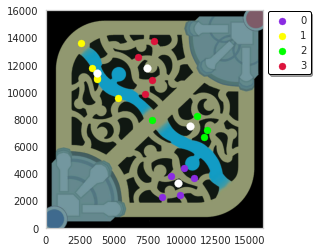

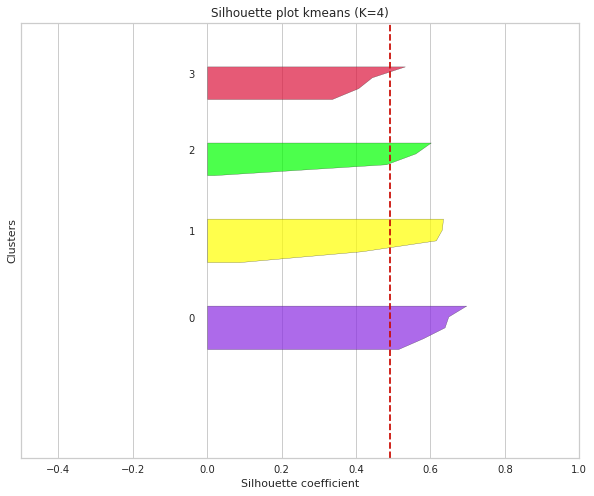

Kmeans silhouette_score 0.490641673602074
Locations in cluster 0: 5
Locations in cluster 1: 5
Locations in cluster 2: 4
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
13: EUW1_6162595161 - Red team Victory
Number of points:  29
distance between initial centroid [8250 4250] and final centroid [8501.66666667 6404.66666667] of blue team's bottom jungle: 2169.3143053867407 

distance between initial centroid [4000 8750] and final centroid [ 3606.5  10490.75] of blue team's top jungle: 1784.67162595812 

distance between initial centroid [12000  7500] and final centroid [11694.7  7333. ] of red team's bottom jungle: 347.99007169745454

distance between initial centroid [ 7750 12000] and final centroid [ 7731.33333333 10315.41666667] of red team's top jungle: 1684.6867517105045


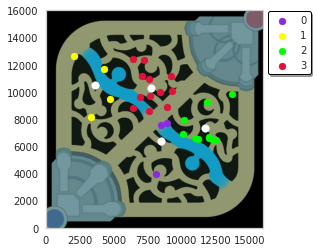

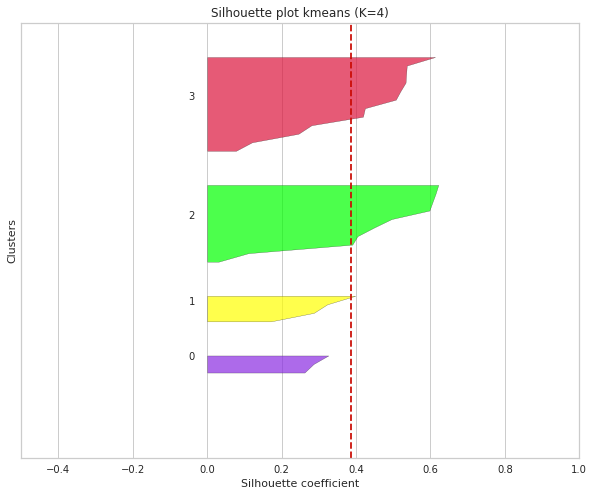

Kmeans silhouette_score 0.3853954333102231
Locations in cluster 0: 3
Locations in cluster 1: 4
Locations in cluster 2: 10
Locations in cluster 3: 12

--------------------------------------------------------------------------------------
14: EUW1_6156713548 - Red team Victory
Number of points:  25
distance between initial centroid [8250 4250] and final centroid [8342.5        4995.33333333] of blue team's bottom jungle: 751.0512817230117 

distance between initial centroid [4000 8750] and final centroid [4595.375 8582.625] of blue team's top jungle: 618.4543485577574 

distance between initial centroid [12000  7500] and final centroid [11639.  6417.] of red team's bottom jungle: 1141.582235320785

distance between initial centroid [ 7750 12000] and final centroid [ 6706.14285714 11343.71428571] of red team's top jungle: 1233.0241982497294


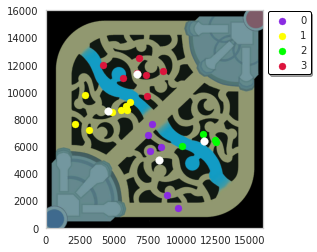

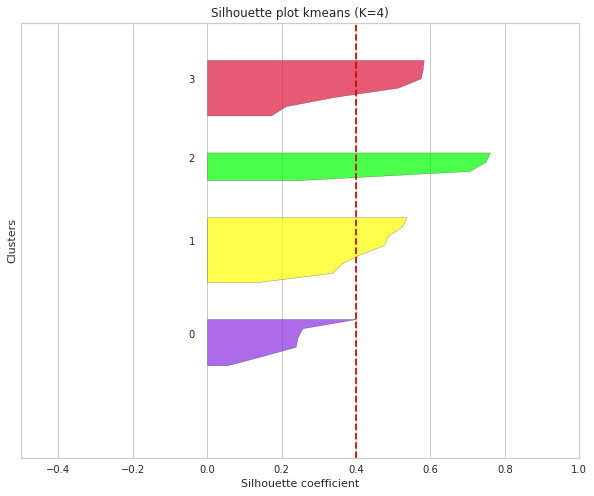

Kmeans silhouette_score 0.401219767457371
Locations in cluster 0: 6
Locations in cluster 1: 8
Locations in cluster 2: 4
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
15: EUW1_6155318816 - Red team Victory
Number of points:  22
distance between initial centroid [8250 4250] and final centroid [9088.4 4322.6] of blue team's bottom jungle: 841.5374739130749 

distance between initial centroid [4000 8750] and final centroid [4432.6 8674.2] of blue team's top jungle: 439.1906192076513 

distance between initial centroid [12000  7500] and final centroid [12009.83333333  6555.83333333] of red team's bottom jungle: 944.217871515303

distance between initial centroid [ 7750 12000] and final centroid [ 6122. 11551.] of red team's top jungle: 1688.7821055423344


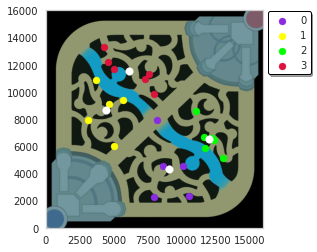

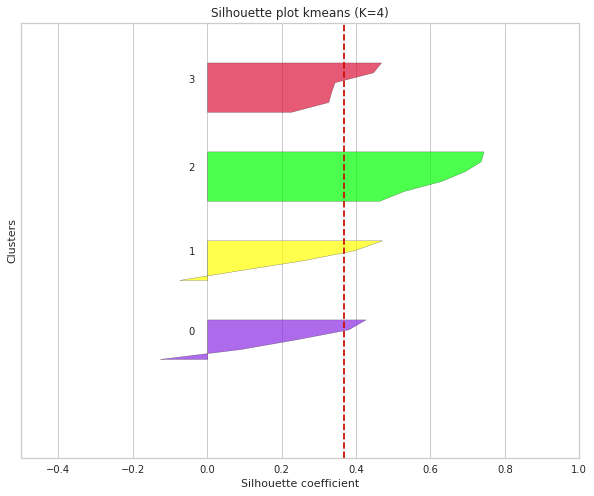

Kmeans silhouette_score 0.3669990508337009
Locations in cluster 0: 5
Locations in cluster 1: 5
Locations in cluster 2: 6
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
16: EUW1_6154241292 - Red team Victory
Number of points:  18
distance between initial centroid [8250 4250] and final centroid [9563.         5755.66666667] of blue team's bottom jungle: 1997.7490110399535 

distance between initial centroid [4000 8750] and final centroid [2633.66666667 8482.        ] of blue team's top jungle: 1392.3687650108275 

distance between initial centroid [12000  7500] and final centroid [11085.83333333  7292.5       ] of red team's bottom jungle: 937.420366988281

distance between initial centroid [ 7750 12000] and final centroid [ 6606.  11241.5] of red team's top jungle: 1372.6100138058152


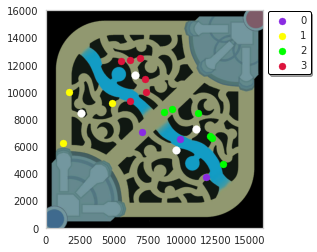

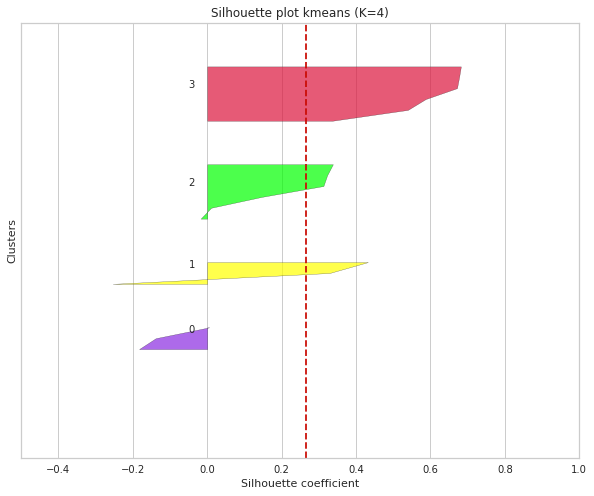

Kmeans silhouette_score 0.2664128745129841
Locations in cluster 0: 3
Locations in cluster 1: 3
Locations in cluster 2: 6
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
17: EUW1_6154165838 - Red team Victory
Number of points:  27
distance between initial centroid [8250 4250] and final centroid [8243.33333333 6098.33333333] of blue team's bottom jungle: 1848.345356137634 

distance between initial centroid [4000 8750] and final centroid [ 2983.5 10501. ] of blue team's top jungle: 2024.666207057351 

distance between initial centroid [12000  7500] and final centroid [12255.5    7553.375] of red team's bottom jungle: 261.01559460116556

distance between initial centroid [ 7750 12000] and final centroid [ 7630.42857143 10093.42857143] of red team's top jungle: 1910.3172351145013


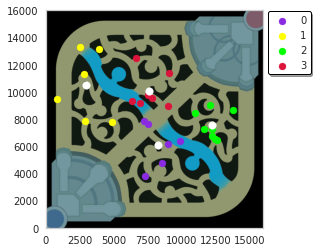

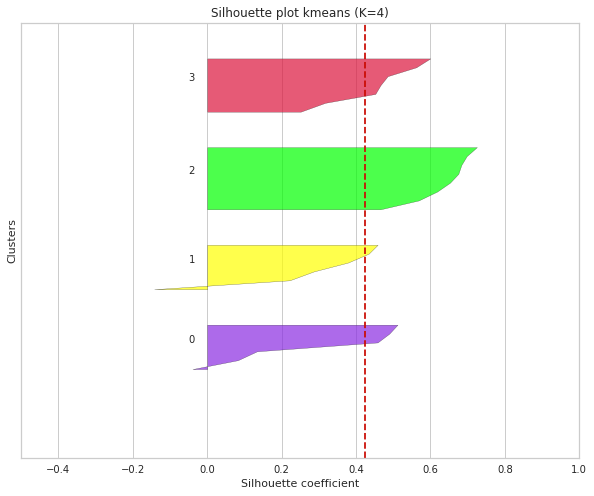

Kmeans silhouette_score 0.4255300216577009
Locations in cluster 0: 6
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 7

--------------------------------------------------------------------------------------


In [9]:
n = 1
scores = []
npoints = []
bb = []
bt = []
rb = []
rt = []
centroid1_distance = []
centroid2_distance = []
centroid3_distance = []
centroid4_distance = []
centroids = []
for game in redTeamWins_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Victory".format(n, game, game_df["team"].unique()[0]))
    print("Number of points: ", game_df.shape[0])
    npoints.append(game_df.shape[0])
    c1, c2, c3, c4, centroid = clustering(game_df, scores, bb, bt, rb, rt)
    centroid1_distance.append(c1)
    centroid2_distance.append(c2)
    centroid3_distance.append(c3)
    centroid4_distance.append(c4)
    centroids.append(centroid)
    n += 1

In [40]:
#print(centroids)
#print(np.mean(np.array(centroids)))
centroid_c1 = []
centroid_c2 = []
centroid_c3 = []
centroid_c4 = []
c1 = 0
c2 = 1
c3 = 2
c4 = 3

print(centroids, "\n")
for c in centroids:
    centroid_c1.append(c[0])
    #print("({}, {})".format(centroid_c1_x, centroid_c1_y))
    c1 += 4
    centroid_c2.append(c[1])
    #print("({}, {})".format(centroid_c1_x, centroid_c1_y))
    c2 += 4
    centroid_c3.append(c[2])
    #print("({}, {})".format(centroid_c1_x, centroid_c1_y))
    c3 += 4
    centroid_c4.append(c[3])
    #print("({}, {})".format(centroid_c1_x, centroid_c1_y))
    c4 += 4
    """ if(c in centroids[1]):
        centroid_c2_x = np.mean(np.array(c[:, 0]))
        centroid_c2_y = np.mean(np.array(c[:, 1]))
        print(centroid_c2_x)
        print(centroid_c2_y)
    if(c in centroids[2]):
        centroid_c3_x = np.mean(np.array(c[:, 0]))
        centroid_c3_y = np.mean(np.array(c[:, 1]))
        print(centroid_c3_x)
    if(c in centroids[3]):
        centroid_c4_x = np.mean(np.array(c[:, 0]))
        centroid_c4_y = np.mean(np.array(c[:, 1]))
        print(centroid_c4_x) """

[array([[ 8776.4       ,  4197.4       ],
       [ 3839.83333333,  8835.83333333],
       [11782.16666667,  6455.83333333],
       [ 7069.85714286, 11859.57142857]]), array([[ 9743.33333333,  2472.        ],
       [ 1665.        ,  9299.33333333],
       [12359.6       ,  6792.2       ],
       [ 7426.71428571, 11212.14285714]]), array([[ 7152.16666667,  5637.33333333],
       [ 5423.5       ,  8568.75      ],
       [11444.5       ,  5640.        ],
       [ 6440.        , 11633.5       ]]), array([[ 9062.5       ,  3299.33333333],
       [ 3140.        ,  9069.        ],
       [12266.        ,  6250.66666667],
       [ 7185.        , 12431.        ]]), array([[ 9195.        ,  4084.88888889],
       [ 3724.6       ,  9703.2       ],
       [11973.        ,  6065.        ],
       [ 6830.33333333, 11213.66666667]]), array([[ 8121.2       ,  3932.4       ],
       [ 5730.66666667,  8642.5       ],
       [11180.28571429,  7756.57142857],
       [ 7442.8       , 10742.        ]]), arr

In [46]:
centroid_c1_x = []
centroid_c1_y = []
for c in centroid_c1:
    #print(c)
    centroid_c1_x.append(np.array(c[0]))
    centroid_c1_y.append(np.array(c[1]))

centroid_c1_x = np.array(centroid_c1_x).ravel()
centroid_c1_y = np.array(centroid_c1_y).ravel()

centroid_c2_x = []
centroid_c2_y = []
for c in centroid_c2:
    centroid_c2_x.append(np.array(c[0]))
    centroid_c2_y.append(np.array(c[1]))

centroid_c2_x = np.array(centroid_c2_x).ravel()
centroid_c2_y = np.array(centroid_c2_y).ravel()

centroid_c3_x = []
centroid_c3_y = []
for c in centroid_c3:
    centroid_c3_x.append(np.array(c[0]))
    centroid_c3_y.append(np.array(c[1]))

centroid_c3_x = np.array(centroid_c3_x).ravel()
centroid_c3_y = np.array(centroid_c3_y).ravel()

centroid_c4_x = []
centroid_c4_y = []
for c in centroid_c4:
    centroid_c4_x.append(np.array(c[0]))
    centroid_c4_y.append(np.array(c[1]))

centroid_c4_x = np.array(centroid_c4_x).ravel()
centroid_c4_y = np.array(centroid_c4_y).ravel()

print(centroid_c1_x)

[ 8776.4         9743.33333333  7152.16666667  9062.5
  9195.          8121.2         8338.33333333  8355.
  8991.66666667 12145.          7823.          9743.
  8501.66666667  8342.5         9088.4         9563.
  8243.33333333]


In [14]:
c1_mean_dist = np.mean(np.array(centroid1_distance))
c2_mean_dist = np.mean(np.array(centroid2_distance))
c3_mean_dist = np.mean(np.array(centroid3_distance))
c4_mean_dist = np.mean(np.array(centroid4_distance))
mean = np.mean(np.array(scores))
avPoints = np.mean(np.array(npoints))
avBb = np.sum(np.array(bb))
avBt = np.sum(np.array(bt))
avRb = np.sum(np.array(rb))
avRt = np.sum(np.array(rt))
print("When Red team Wins:")
print(" - Average silhouette score: ", mean)
print(" - Average points: ", avPoints)
print(" - Average points on the blue team's bottom jungle: ", avBb)
print(" - Average points on the blue team's top jungle: ", avBt)
print(" - Average points on the red team's bottom jungle: ", avRb)
print(" - Average points on the red team's top jungle: ", avRt)
print(" - Average distance between centroids of blue team's bottom jungle: ", c1_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c2_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c3_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c4_mean_dist)

When Red team Wins:
 - Average silhouette score:  0.40293193261610993
 - Average points:  22.764705882352942
 - Average points on the blue team's bottom jungle:  94
 - Average points on the blue team's top jungle:  86
 - Average points on the red team's bottom jungle:  104
 - Average points on the red team's top jungle:  103
 - Average distance between centroids of blue team's bottom jungle:  1415.37933113543
 - Average distance between centroids of blue team's bottom jungle:  1472.4291766183067
 - Average distance between centroids of blue team's bottom jungle:  983.3546921695452
 - Average distance between centroids of blue team's bottom jungle:  1264.6409994140781


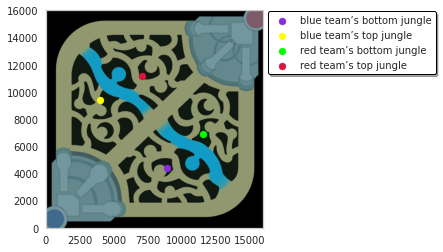

In [47]:
img = plt.imread("../map11.png")
fig, ax = plt.subplots()
ax.imshow(img, extent=[0, 16000, 0, 16000])
blue_team_bot_jungle = ax.scatter(np.mean(centroid_c1_x), np.mean(centroid_c1_y), color= ["blueviolet"]) #, "yellow", "lime", "crimson"
blue_team_top_jungle = ax.scatter(np.mean(centroid_c2_x), np.mean(centroid_c2_y), color= ["yellow"])
red_team_bot_jungle = ax.scatter(np.mean(centroid_c3_x), np.mean(centroid_c3_y), color= ["lime"])
red_team_top_jungle = ax.scatter(np.mean(centroid_c4_x), np.mean(centroid_c4_y), color= ["crimson"])
plt.grid()
lg = ax.legend((blue_team_bot_jungle, blue_team_top_jungle, red_team_bot_jungle, red_team_top_jungle), ("blue team’s bottom jungle", "blue team’s top jungle", "red team’s bottom jungle", "red team’s top jungle"), frameon = True, loc='center left', bbox_to_anchor=(1, 0.85),
          fancybox=True, shadow=True)

lg.get_frame().set_linewidth(1)
lg.get_frame().set_edgecolor("black")
#ax.legend(["blue", "yelolow", "verde", "ver"])
plt.show()

distance between initial centroid [8250 4250] and final centroid [8780.95402299 4133.06896552] of blue team's bottom jungle: 543.6773320204608 

distance between initial centroid [4000 8750] and final centroid [3520.09333333 9936.89333333] of blue team's top jungle: 1280.2445834379553 

distance between initial centroid [12000  7500] and final centroid [11691.05154639  6942.12371134] of red team's bottom jungle: 637.710828225265

distance between initial centroid [ 7750 12000] and final centroid [ 7392.8125 10215.4375] of red team's top jungle: 1819.95775405983


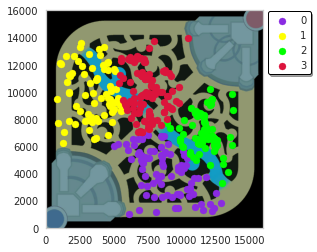

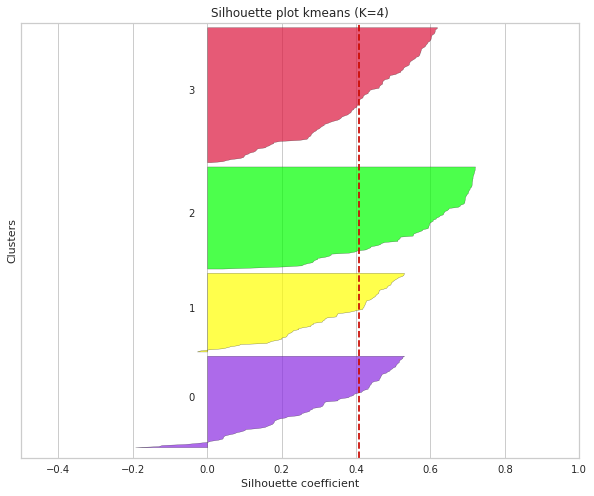

Kmeans silhouette_score 0.40858868989769986
Locations in cluster 0: 87
Locations in cluster 1: 75
Locations in cluster 2: 97
Locations in cluster 3: 128

--------------------------------------------------------------------------------------


(543.6773320204608, 1280.2445834379553, 637.710828225265, 1819.95775405983)

In [ ]:
clustering(redTeamWins_df)

---

### Red Team Loses (outliers removed)

In [ ]:
redTeamLoses_df = redTeam_df.loc[redTeam_df["won"] == False]
print("Red Team losing Data Frame:\n{}".format(redTeamLoses_df))
print("\nElyoya lost {} matches on the red team.".format(redTeamLoses_df["gameId"].nunique()))

Red Team losing Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y team    won
31    EUW1_6176325099   1.000250          9667          7063  Red  False
32    EUW1_6176325099   2.000350          8037          3520  Red  False
33    EUW1_6176325099   3.000583         11663          7725  Red  False
34    EUW1_6176325099   4.000900          7672          5223  Red  False
35    EUW1_6176325099   5.001633          3604         13800  Red  False
...               ...        ...           ...           ...  ...    ...
2005  EUW1_6151765282  27.007400          7572         12304  Red  False
2006  EUW1_6151765282  28.007417         10665         10235  Red  False
2007  EUW1_6151765282  29.007850          9714          5255  Red  False
2008  EUW1_6151765282  30.007983          7293         10934  Red  False
2009  EUW1_6151765282  31.008533         12258          8480  Red  False

[369 rows x 6 columns]

Elyoya lost 16 matches on the red team.


1: EUW1_6176325099 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [8779.33333333 3936.33333333] of blue team's bottom jungle: 615.2890016533335 

distance between initial centroid [4000 8750] and final centroid [ 4075.75 13556.25] of blue team's top jungle: 4806.846900515971 

distance between initial centroid [12000  7500] and final centroid [11789.22222222  7701.        ] of red team's bottom jungle: 291.25293407095165

distance between initial centroid [ 7750 12000] and final centroid [ 6429.25 11203.75] of red team's top jungle: 1542.204469258211


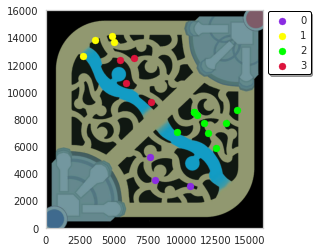

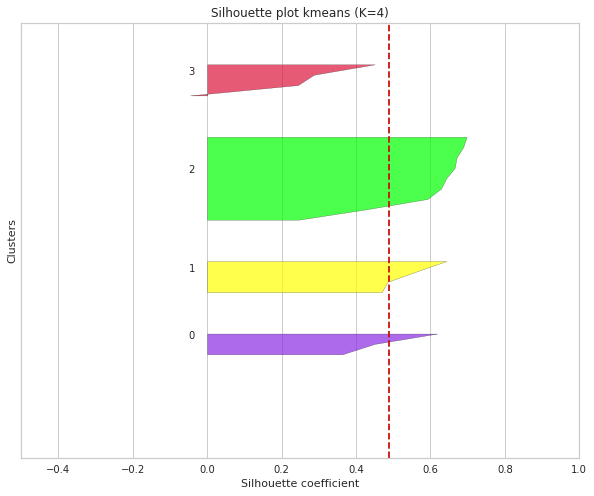

Kmeans silhouette_score 0.4891418541926155
Locations in cluster 0: 3
Locations in cluster 1: 4
Locations in cluster 2: 9
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
2: EUW1_6170009607 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [12313.    2580.75] of blue team's bottom jungle: 4392.535095192752 

distance between initial centroid [4000 8750] and final centroid [7541. 8245.] of blue team's top jungle: 3576.8290426018407 

distance between initial centroid [12000  7500] and final centroid [12604.   7162.2] of red team's bottom jungle: 692.0439581413887

distance between initial centroid [ 7750 12000] and final centroid [ 7132.85714286 11090.71428571] of red team's top jungle: 1098.938495242809


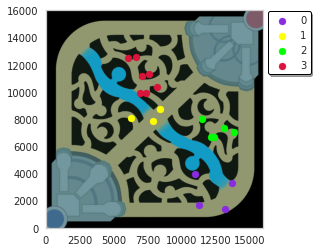

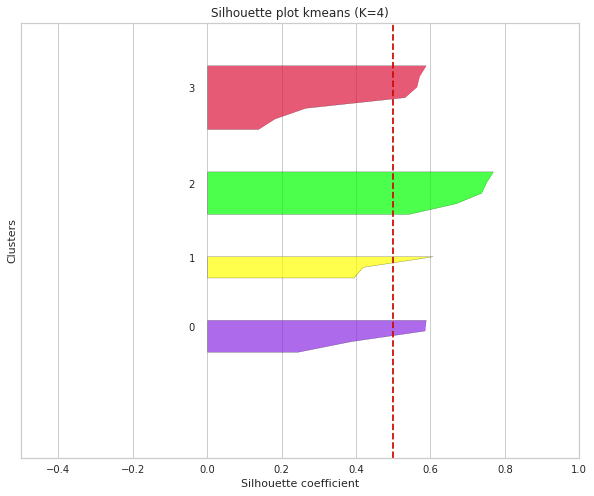

Kmeans silhouette_score 0.500634507035944
Locations in cluster 0: 4
Locations in cluster 1: 3
Locations in cluster 2: 5
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
3: EUW1_6169075266 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [9091. 2214.] of blue team's bottom jungle: 2202.8565545672736 

distance between initial centroid [4000 8750] and final centroid [11644.  4012.] of blue team's top jungle: 8993.296392313554 

distance between initial centroid [12000  7500] and final centroid [11686.5         7890.83333333] of red team's bottom jungle: 501.0318796687941

distance between initial centroid [ 7750 12000] and final centroid [ 7101.125 11211.625] of red team's top jungle: 1021.0650842380226


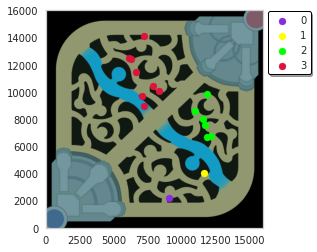

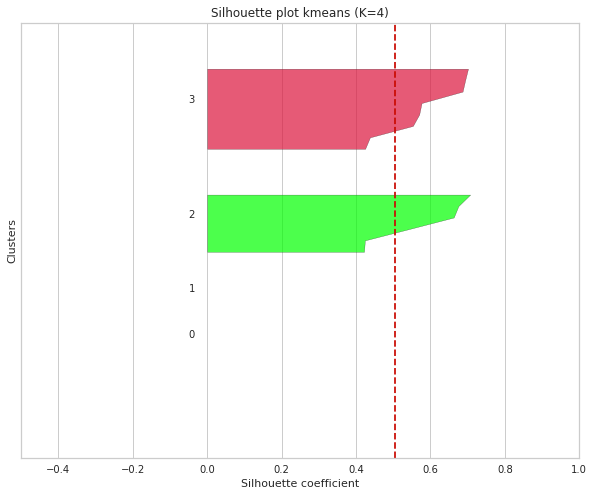

Kmeans silhouette_score 0.5047137542405113
Locations in cluster 0: 1
Locations in cluster 1: 1
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
4: EUW1_6166357478 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [7945.         5410.14285714] of blue team's bottom jungle: 1199.5651082703228 

distance between initial centroid [4000 8750] and final centroid [3942.83333333 8795.16666667] of blue team's top jungle: 72.85640366883021 

distance between initial centroid [12000  7500] and final centroid [12402.875  6240.875] of red team's bottom jungle: 1322.0075760940254

distance between initial centroid [ 7750 12000] and final centroid [ 7114.8 11107.6] of red team's top jungle: 1095.3797515017334


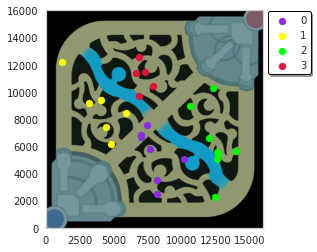

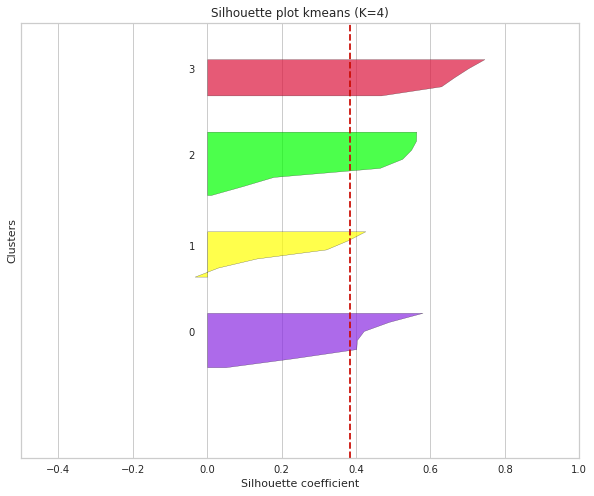

Kmeans silhouette_score 0.3835083746546149
Locations in cluster 0: 7
Locations in cluster 1: 6
Locations in cluster 2: 8
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
5: EUW1_6164815806 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [10733.5  2040.5] of blue team's bottom jungle: 3324.103262535627 

distance between initial centroid [4000 8750] and final centroid [4892.5        7831.83333333] of blue team's top jungle: 1280.4633059083646 

distance between initial centroid [12000  7500] and final centroid [11151.          7186.72727273] of red team's bottom jungle: 904.9534803805624

distance between initial centroid [ 7750 12000] and final centroid [ 6943.125 10562.   ] of red team's top jungle: 1648.9060815052505


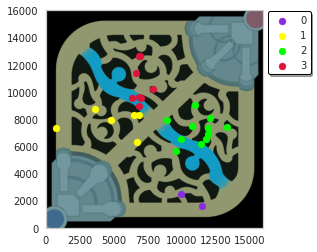

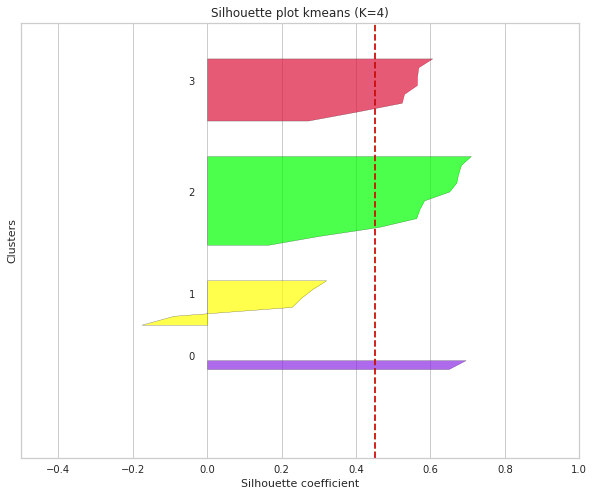

Kmeans silhouette_score 0.452003299722822
Locations in cluster 0: 2
Locations in cluster 1: 6
Locations in cluster 2: 11
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
6: EUW1_6161628395 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [8288.75 6715.5 ] of blue team's bottom jungle: 2465.8044960012544 

distance between initial centroid [4000 8750] and final centroid [3612. 8657.] of blue team's top jungle: 398.989974811398 

distance between initial centroid [12000  7500] and final centroid [11553.5         6940.16666667] of red team's bottom jungle: 716.0835224407211

distance between initial centroid [ 7750 12000] and final centroid [ 8789.66666667 10567.        ] of red team's top jungle: 1770.4224856733424


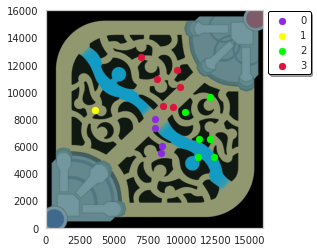

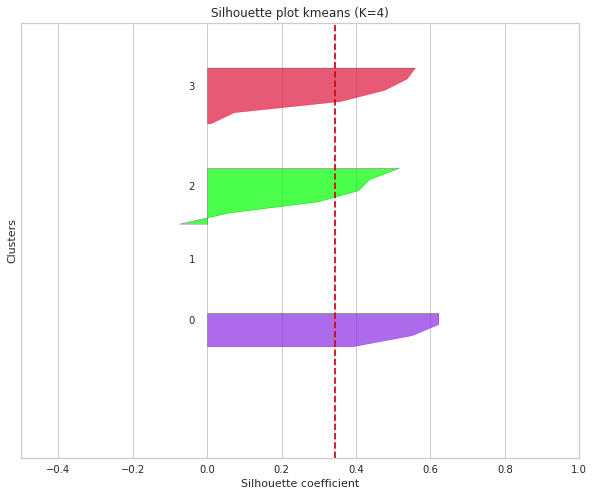

Kmeans silhouette_score 0.34271571881608376
Locations in cluster 0: 4
Locations in cluster 1: 1
Locations in cluster 2: 6
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
7: EUW1_6161484250 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [9032.8 3983. ] of blue team's bottom jungle: 827.0821240965124 

distance between initial centroid [4000 8750] and final centroid [4252.66666667 8674.33333333] of blue team's top jungle: 263.7534623258791 

distance between initial centroid [12000  7500] and final centroid [10507.2  7760.2] of red team's bottom jungle: 1515.307189978322

distance between initial centroid [ 7750 12000] and final centroid [ 7342.75 11116.5 ] of red team's top jungle: 972.8436732075714


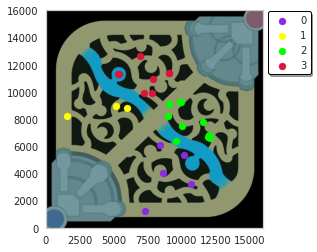

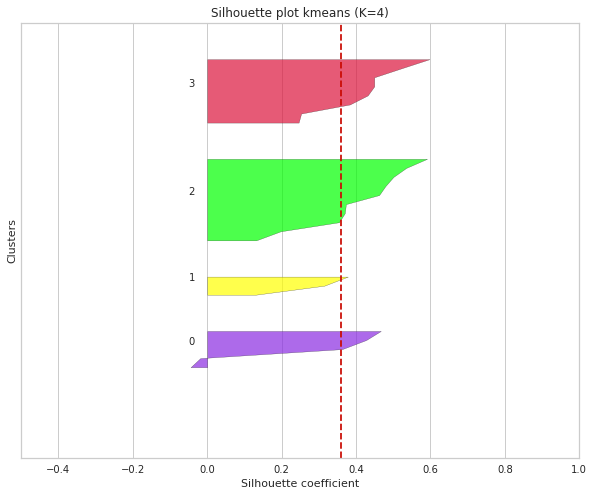

Kmeans silhouette_score 0.3592384650996369
Locations in cluster 0: 5
Locations in cluster 1: 3
Locations in cluster 2: 10
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
8: EUW1_6161351421 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [11195.66666667  1436.66666667] of blue team's bottom jungle: 4073.3029049599972 

distance between initial centroid [4000 8750] and final centroid [5374.4 8793.8] of blue team's top jungle: 1375.097741980547 

distance between initial centroid [12000  7500] and final centroid [10632.75  7290.5 ] of red team's bottom jungle: 1383.2074365401597

distance between initial centroid [ 7750 12000] and final centroid [ 7545.7 12307.3] of red team's top jungle: 369.01460675696785


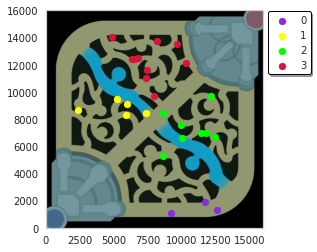

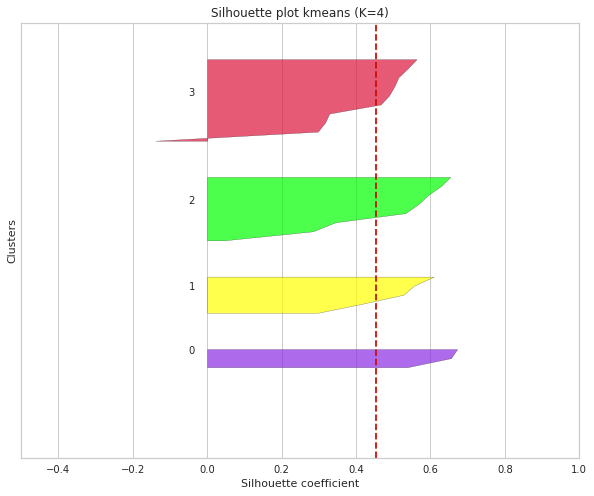

Kmeans silhouette_score 0.45380454950938015
Locations in cluster 0: 3
Locations in cluster 1: 5
Locations in cluster 2: 8
Locations in cluster 3: 10

--------------------------------------------------------------------------------------
9: EUW1_6160614714 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [8657.         3529.16666667] of blue team's bottom jungle: 827.7981000488239 

distance between initial centroid [4000 8750] and final centroid [4703.33333333 9007.88888889] of blue team's top jungle: 749.1224578065486 

distance between initial centroid [12000  7500] and final centroid [10904.125  7577.75 ] of red team's bottom jungle: 1098.6296364676314

distance between initial centroid [ 7750 12000] and final centroid [ 7399.5        11702.66666667] of red team's top jungle: 459.627415534704


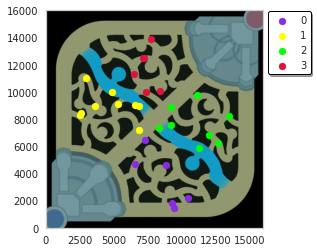

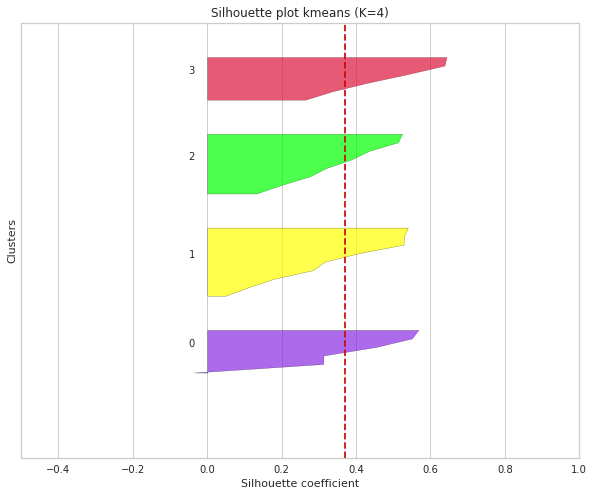

Kmeans silhouette_score 0.37042602938078234
Locations in cluster 0: 6
Locations in cluster 1: 9
Locations in cluster 2: 8
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
10: EUW1_6156508218 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [10624.  4597.] of blue team's bottom jungle: 2399.2259168323435 

distance between initial centroid [4000 8750] and final centroid [ 3804.83333333 11143.        ] of blue team's top jungle: 2400.9454445650736 

distance between initial centroid [12000  7500] and final centroid [11703.66666667  7447.83333333] of red team's bottom jungle: 300.89002235959214

distance between initial centroid [ 7750 12000] and final centroid [ 7067.75 10626.5 ] of red team's top jungle: 1533.612504024403


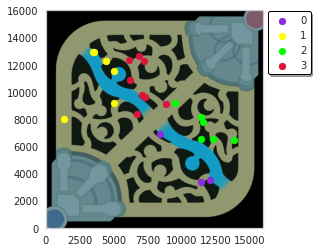

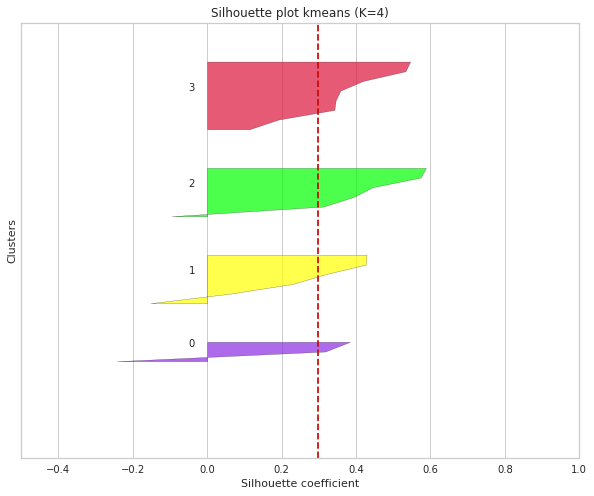

Kmeans silhouette_score 0.29726838858140164
Locations in cluster 0: 3
Locations in cluster 1: 6
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
11: EUW1_6155233283 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [9911.         4968.33333333] of blue team's bottom jungle: 1809.675047564556 

distance between initial centroid [4000 8750] and final centroid [3344.16666667 9357.83333333] of blue team's top jungle: 894.1916585510191 

distance between initial centroid [12000  7500] and final centroid [12161.          5992.83333333] of red team's bottom jungle: 1515.7415218668086

distance between initial centroid [ 7750 12000] and final centroid [ 6881.5   10772.125] of red team's top jungle: 1503.9844632259337


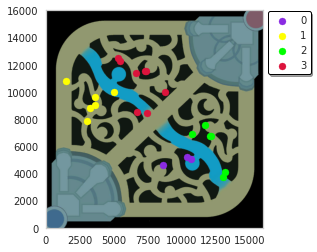

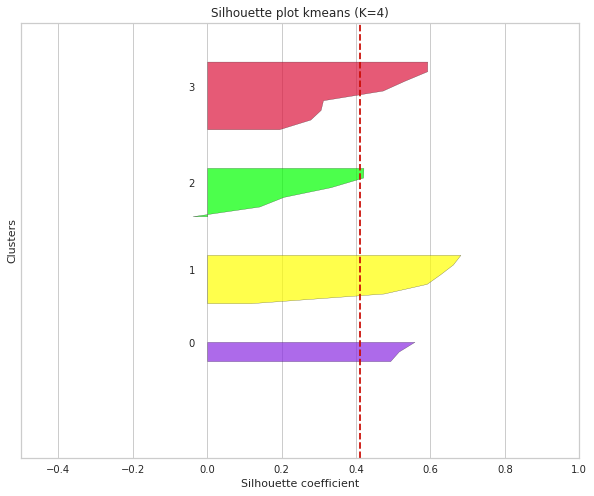

Kmeans silhouette_score 0.41129194158804716
Locations in cluster 0: 3
Locations in cluster 1: 6
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
12: EUW1_6154509012 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [11172.   3446.5] of blue team's bottom jungle: 3030.461392263561 

distance between initial centroid [4000 8750] and final centroid [6717. 7784.] of blue team's top jungle: 2883.6166527470327 

distance between initial centroid [12000  7500] and final centroid [11858.42857143  7115.71428571] of red team's bottom jungle: 409.5338564659051

distance between initial centroid [ 7750 12000] and final centroid [ 7870.4 10773.7] of red team's top jungle: 1232.1963520478375


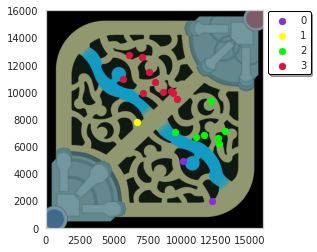

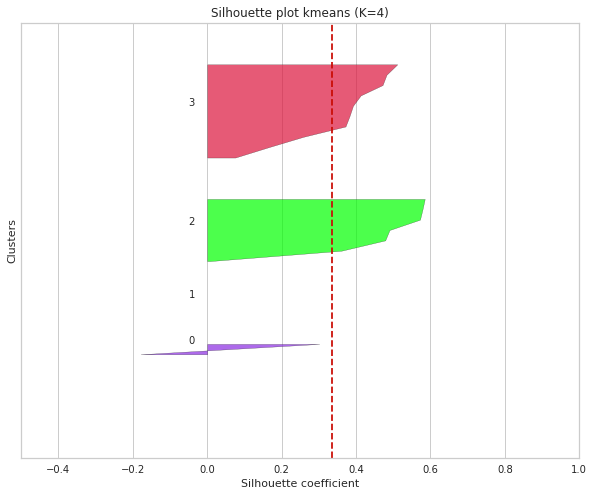

Kmeans silhouette_score 0.33576162845097957
Locations in cluster 0: 2
Locations in cluster 1: 1
Locations in cluster 2: 7
Locations in cluster 3: 10

--------------------------------------------------------------------------------------
13: EUW1_6154457377 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [10194.71428571  5664.71428571] of blue team's bottom jungle: 2404.855538959733 

distance between initial centroid [4000 8750] and final centroid [13002.  5196.] of blue team's top jungle: 9678.16718185835 

distance between initial centroid [12000  7500] and final centroid [12178.28571429  7340.57142857] of red team's bottom jungle: 239.17204122999476

distance between initial centroid [ 7750 12000] and final centroid [ 7224.  10652.5] of red team's top jungle: 1446.5241961336146


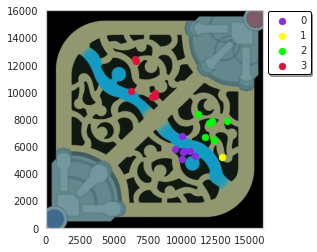

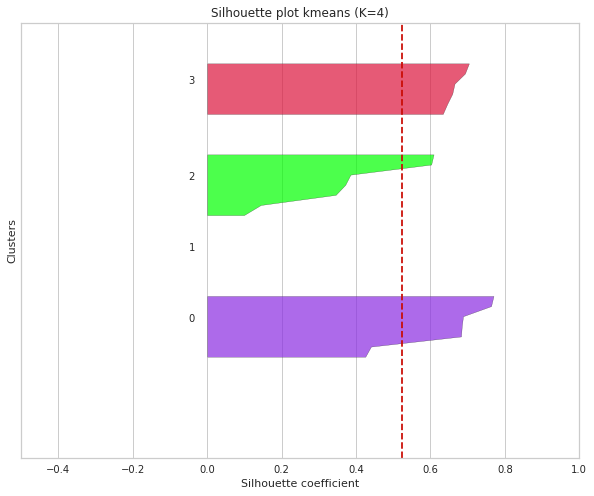

Kmeans silhouette_score 0.5240235222636149
Locations in cluster 0: 7
Locations in cluster 1: 1
Locations in cluster 2: 7
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
14: EUW1_6154019544 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [8102.75 5371.5 ] of blue team's bottom jungle: 1131.1254627582211 

distance between initial centroid [4000 8750] and final centroid [ 3611.33333333 11291.66666667] of blue team's top jungle: 2571.2120142497424 

distance between initial centroid [12000  7500] and final centroid [11686.42857143  7605.42857143] of red team's bottom jungle: 330.8205321466557

distance between initial centroid [ 7750 12000] and final centroid [ 8744.25 10684.  ] of red team's top jungle: 1649.360197925244


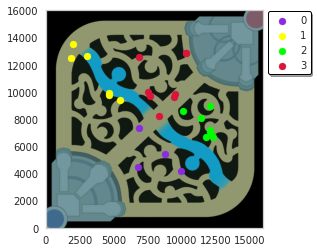

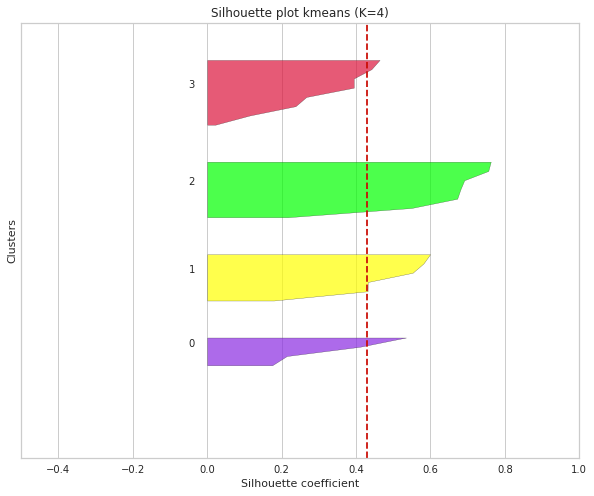

Kmeans silhouette_score 0.4306785632844024
Locations in cluster 0: 4
Locations in cluster 1: 6
Locations in cluster 2: 7
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
15: EUW1_6151839599 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [8909.5 8211. ] of blue team's bottom jungle: 4015.527518272039 

distance between initial centroid [4000 8750] and final centroid [ 3752.8 10647.6] of blue team's top jungle: 1913.6336117449446 

distance between initial centroid [12000  7500] and final centroid [12774.875  7395.75 ] of red team's bottom jungle: 781.856334709261

distance between initial centroid [ 7750 12000] and final centroid [ 7479.         10466.71428571] of red team's top jungle: 1557.050442867106


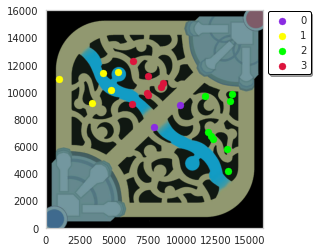

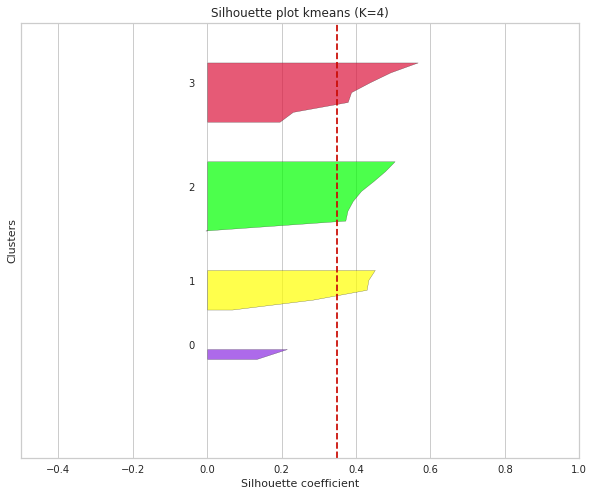

Kmeans silhouette_score 0.3486743377020391
Locations in cluster 0: 2
Locations in cluster 1: 5
Locations in cluster 2: 8
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
16: EUW1_6151765282 - Red team Defeat
distance between initial centroid [8250 4250] and final centroid [9279.         4552.71428571] of blue team's bottom jungle: 1072.6028802755989 

distance between initial centroid [4000 8750] and final centroid [4383.6 9741.2] of blue team's top jungle: 1062.8388400881863 

distance between initial centroid [12000  7500] and final centroid [11791.33333333  8361.88888889] of red team's bottom jungle: 886.788720365737

distance between initial centroid [ 7750 12000] and final centroid [ 7077.375 11558.875] of red team's top jungle: 804.3728341074182


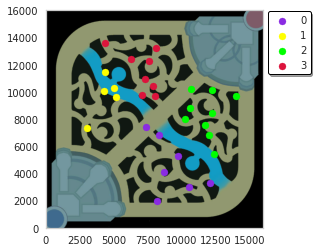

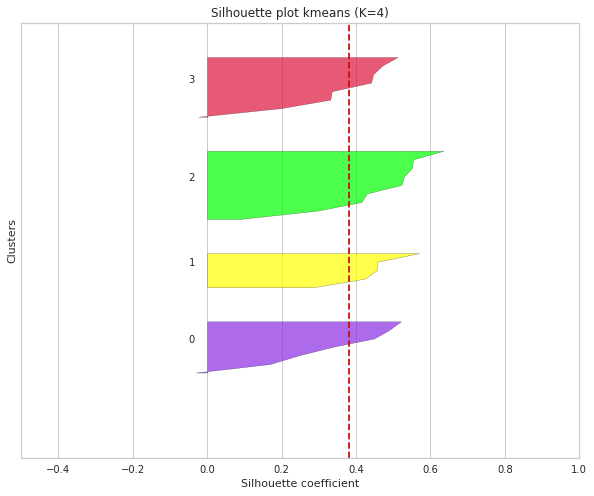

Kmeans silhouette_score 0.3825037457208739
Locations in cluster 0: 7
Locations in cluster 1: 5
Locations in cluster 2: 9
Locations in cluster 3: 8

--------------------------------------------------------------------------------------


In [ ]:
n = 1
npoints = []
scores = []
bb = []
bt = []
rb = []
rt = []
centroid1_distance = []
centroid2_distance = []
centroid3_distance = []
centroid4_distance = []
for game in redTeamLoses_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Defeat".format(n, game, game_df["team"].unique()[0]))
    npoints.append(game_df.shape[0])
    c1, c2, c3, c4 = clustering(game_df, scores, bb, bt, rb, rt)
    centroid1_distance.append(c1)
    centroid2_distance.append(c2)
    centroid3_distance.append(c3)
    centroid4_distance.append(c4)
    n += 1

In [ ]:
c1_mean_dist = np.mean(np.array(centroid1_distance))
c2_mean_dist = np.mean(np.array(centroid2_distance))
c3_mean_dist = np.mean(np.array(centroid3_distance))
c4_mean_dist = np.mean(np.array(centroid4_distance))
mean = np.mean(np.array(scores))
avPoints = np.mean(np.array(npoints))
avBb = np.sum(np.array(bb))
avBt = np.sum(np.array(bt))
avRb = np.sum(np.array(rb))
avRt = np.sum(np.array(rt))
print("When Red team Wins:")
print(" - Average silhouette score: ", mean)
print(" - Average points: ", avPoints)
print(" - Average points on the blue team's bottom jungle: ", avBb)
print(" - Average points on the blue team's top jungle: ", avBt)
print(" - Average points on the red team's bottom jungle: ", avRb)
print(" - Average points on the red team's top jungle: ", avRt)
print(" - Average distance between centroids of blue team's bottom jungle: ", c1_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c2_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c3_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c4_mean_dist)

When Red team Wins:
 - Average silhouette score:  0.41164929251523436
 - Average points:  23.0625
 - Average points on the blue team's bottom jungle:  63
 - Average points on the blue team's top jungle:  68
 - Average points on the red team's bottom jungle:  121
 - Average points on the red team's top jungle:  117
 - Average distance between centroids of blue team's bottom jungle:  2236.988150265747
 - Average distance between centroids of blue team's bottom jungle:  2682.6163178585803
 - Average distance between centroids of blue team's bottom jungle:  805.582540182907
 - Average distance between centroids of blue team's bottom jungle:  1231.5939408281356


In [ ]:
img = plt.imread("../map11.png")
fig, ax = plt.subplots()
ax.imshow(img, extent=[0, 16000, 0, 16000])
blue_team_bot_jungle = ax.scatter(8250, 4250, color= ["blueviolet"]) #, "yellow", "lime", "crimson"
blue_team_top_jungle = ax.scatter(4000, 8750, color= ["yellow"])
red_team_bot_jungle = ax.scatter(12000, 7500, color= ["lime"])
red_team_top_jungle = ax.scatter(7750, 12000, color= ["crimson"])
plt.grid()
lg = ax.legend((blue_team_bot_jungle, blue_team_top_jungle, red_team_bot_jungle, red_team_top_jungle), ("blue team’s bottom jungle", "blue team’s top jungle", "red team’s bottom jungle", "red team’s top jungle"), frameon = True, loc='center left', bbox_to_anchor=(1, 0.85),
          fancybox=True, shadow=True)

lg.get_frame().set_linewidth(1)
lg.get_frame().set_edgecolor("black")
#ax.legend(["blue", "yelolow", "verde", "ver"])
plt.show()

distance between initial centroid [8250 4250] and final centroid [9936.0952381  4069.12698413] of blue team's bottom jungle: 1695.7689110838305 

distance between initial centroid [4000 8750] and final centroid [ 3903.86440678 10397.37288136] of blue team's top jungle: 1650.1755853577436 

distance between initial centroid [12000  7500] and final centroid [11839.0462963  7451.9537037] of red team's bottom jungle: 167.97184681883886

distance between initial centroid [ 7750 12000] and final centroid [ 7569.53956835 10345.94244604] of red team's top jungle: 1663.8726992154957


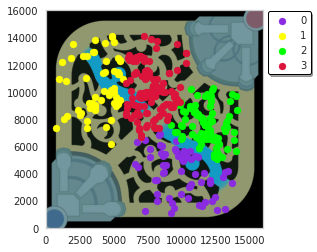

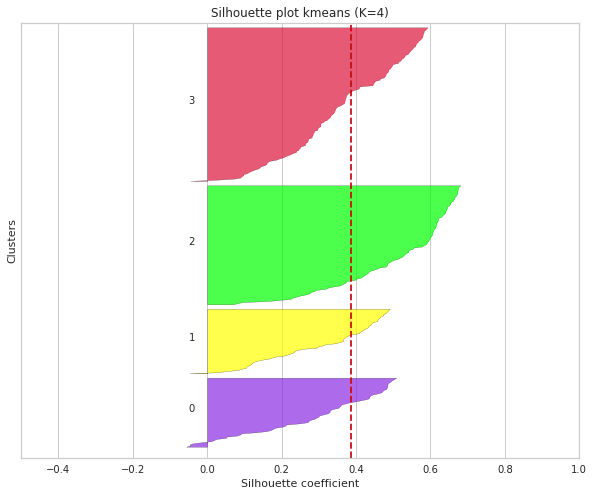

Kmeans silhouette_score 0.38695594284246104
Locations in cluster 0: 63
Locations in cluster 1: 59
Locations in cluster 2: 108
Locations in cluster 3: 139

--------------------------------------------------------------------------------------


(1695.7689110838305,
 1650.1755853577436,
 167.97184681883886,
 1663.8726992154957)

In [ ]:
clustering(redTeamLoses_df)

distance between initial centroid [8250 4250] and final centroid [9240.28187919 4127.85234899] of blue team's bottom jungle: 997.7866750501855 

distance between initial centroid [4000 8750] and final centroid [ 3708.84558824 10070.41911765] of blue team's top jungle: 1352.1381355977992 

distance between initial centroid [12000  7500] and final centroid [11840.11386139  7153.05445545] of red team's bottom jungle: 382.01412042886466

distance between initial centroid [ 7750 12000] and final centroid [ 7518.3605948  10293.52788104] of red team's top jungle: 1722.121919850118


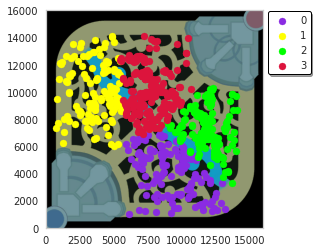

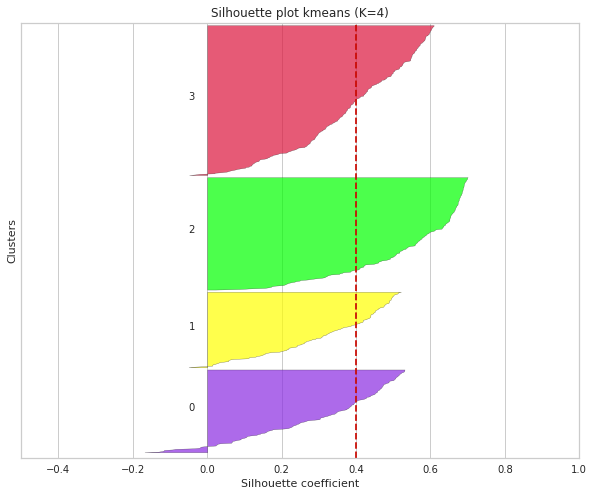

Kmeans silhouette_score 0.400966614856634
Locations in cluster 0: 149
Locations in cluster 1: 136
Locations in cluster 2: 202
Locations in cluster 3: 269

--------------------------------------------------------------------------------------


(997.7866750501855, 1352.1381355977992, 382.01412042886466, 1722.121919850118)

In [ ]:
scores = []
clustering(redTeam_df, scores)

---

### Blue Team Wins (outliers removed)

In [ ]:
blueTeam_df = df.loc[df["team"] == "Blue"]
print("blue Team Data Frame:\n{}".format(blueTeam_df))
print("\nElyoya played {} matches on the blue team.".format(blueTeam_df["gameId"].nunique()))

blue Team Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team    won
1     EUW1_6176366691   1.000250          5633          9332  Blue   True
2     EUW1_6176366691   2.000750          8149          2265  Blue   True
3     EUW1_6176366691   3.001350         11532          4753  Blue   True
4     EUW1_6176366691   4.001617         11454          3261  Blue   True
5     EUW1_6176366691   5.001633          1232         13514  Blue   True
...               ...        ...           ...           ...   ...    ...
1943  EUW1_6153946340  16.004467          8166          3308  Blue  False
1944  EUW1_6153946340  17.004650          6000          8539  Blue  False
1945  EUW1_6153946340  18.005033          2289          9364  Blue  False
1948  EUW1_6153946340  21.005933          3570          6533  Blue  False
1949  EUW1_6153946340  22.006317          3522          9030  Blue  False

[853 rows x 6 columns]

Elyoya played 39 matches on the blue team.


In [ ]:
blueTeamWins_df = blueTeam_df.loc[blueTeam_df["won"] == True]
print("Blue Team Winning Data Frame:\n{}".format(blueTeamWins_df))

print("\nElyoya won {} matches on the blue team.".format(blueTeamWins_df["gameId"].nunique()))

Blue Team Winning Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team   won
1     EUW1_6176366691   1.000250          5633          9332  Blue  True
2     EUW1_6176366691   2.000750          8149          2265  Blue  True
3     EUW1_6176366691   3.001350         11532          4753  Blue  True
4     EUW1_6176366691   4.001617         11454          3261  Blue  True
5     EUW1_6176366691   5.001633          1232         13514  Blue  True
...               ...        ...           ...           ...   ...   ...
1890  EUW1_6154082054  22.005267         11581          7137  Blue  True
1892  EUW1_6154082054  24.006083          6911          6871  Blue  True
1893  EUW1_6154082054  25.006400         12137          4685  Blue  True
1894  EUW1_6154082054  26.006417          3869         11206  Blue  True
1895  EUW1_6154082054  27.006533          8484         13392  Blue  True

[433 rows x 6 columns]

Elyoya won 20 matches on the blue team.


1: EUW1_6176366691 - Blue team Victory
Number of points:  25
distance between initial centroid [8250 4250] and final centroid [9319.57142857 4393.28571429] of blue team's bottom jungle: 1079.1264229619678 

distance between initial centroid [4000 8750] and final centroid [2170.8 9698.8] of blue team's top jungle: 2060.629534875204 

distance between initial centroid [12000  7500] and final centroid [12589.85714286  7713.85714286] of red team's bottom jungle: 627.4283437418256

distance between initial centroid [ 7750 12000] and final centroid [5844.5        9326.66666667] of red team's top jungle: 3282.9318240120547


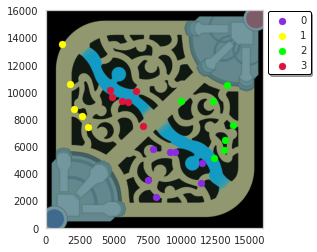

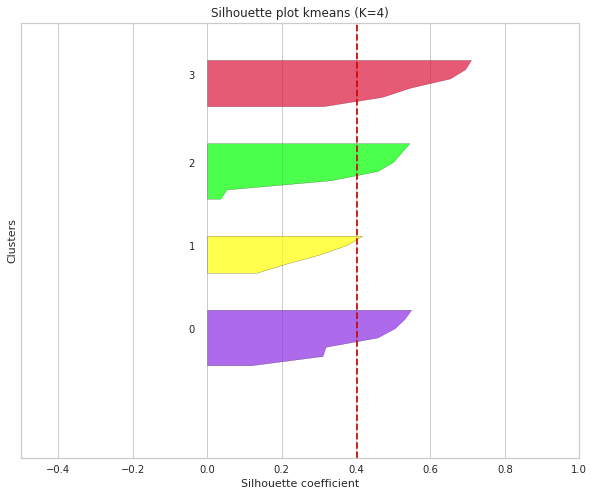

Kmeans silhouette_score 0.4019943759779274
Locations in cluster 0: 7
Locations in cluster 1: 5
Locations in cluster 2: 7
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
2: EUW1_6176273615 - Blue team Victory
Number of points:  20
distance between initial centroid [8250 4250] and final centroid [7190. 4445.] of blue team's bottom jungle: 1077.7870847249933 

distance between initial centroid [4000 8750] and final centroid [3424.         9877.57142857] of blue team's top jungle: 1266.1727080183846 

distance between initial centroid [12000  7500] and final centroid [11600.6  7187. ] of red team's bottom jungle: 507.434094242789

distance between initial centroid [ 7750 12000] and final centroid [9098.  9994.8] of red team's top jungle: 2416.181085928785


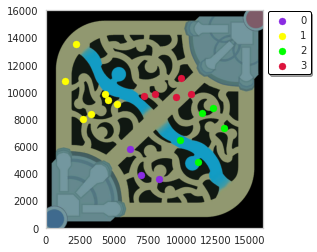

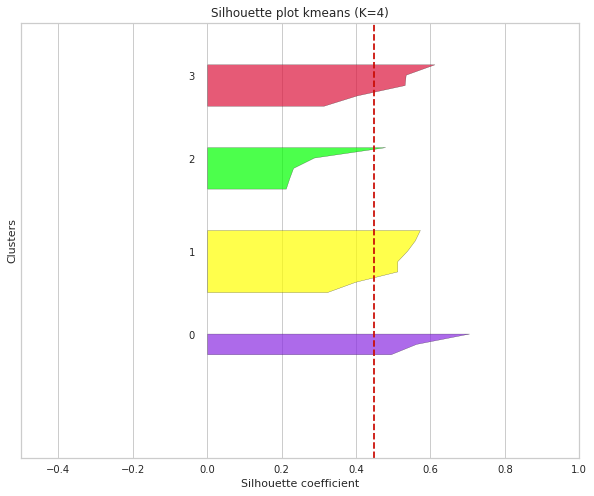

Kmeans silhouette_score 0.4492722899000158
Locations in cluster 0: 3
Locations in cluster 1: 7
Locations in cluster 2: 5
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
3: EUW1_6175455388 - Blue team Victory
Number of points:  21
distance between initial centroid [8250 4250] and final centroid [9635.33333333 4081.        ] of blue team's bottom jungle: 1395.6036129375868 

distance between initial centroid [4000 8750] and final centroid [3959.33333333 9063.5       ] of blue team's top jungle: 316.12660087024915 

distance between initial centroid [12000  7500] and final centroid [11076.71428571  6823.71428571] of red team's bottom jungle: 1144.4731877816187

distance between initial centroid [ 7750 12000] and final centroid [11854.   1681.5] of red team's top jungle: 11104.695324501254


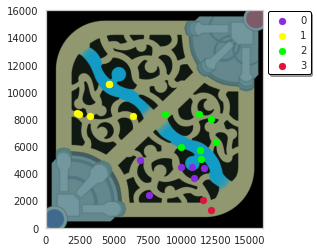

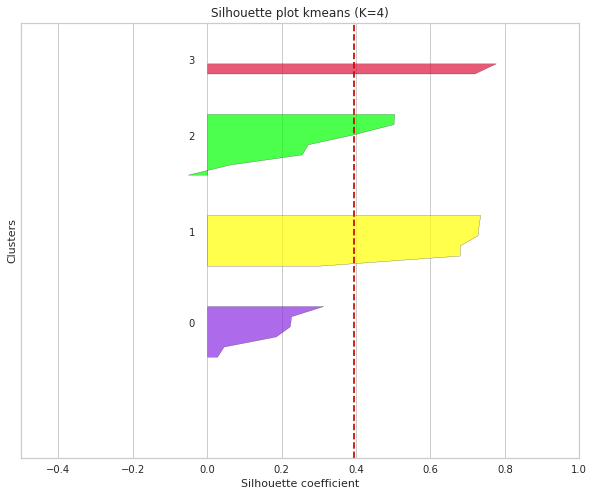

Kmeans silhouette_score 0.3947799213401214
Locations in cluster 0: 6
Locations in cluster 1: 6
Locations in cluster 2: 7
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
4: EUW1_6174897746 - Blue team Victory
Number of points:  21
distance between initial centroid [8250 4250] and final centroid [7754.6 4454.8] of blue team's bottom jungle: 536.0636156278463 

distance between initial centroid [4000 8750] and final centroid [3260.14285714 9046.57142857] of blue team's top jungle: 797.0841888292807 

distance between initial centroid [12000  7500] and final centroid [11823.16666667  7640.16666667] of red team's bottom jungle: 225.6473403836671

distance between initial centroid [ 7750 12000] and final centroid [7583.         8671.33333333] of red team's top jungle: 3332.8532487611533


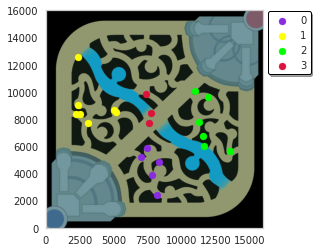

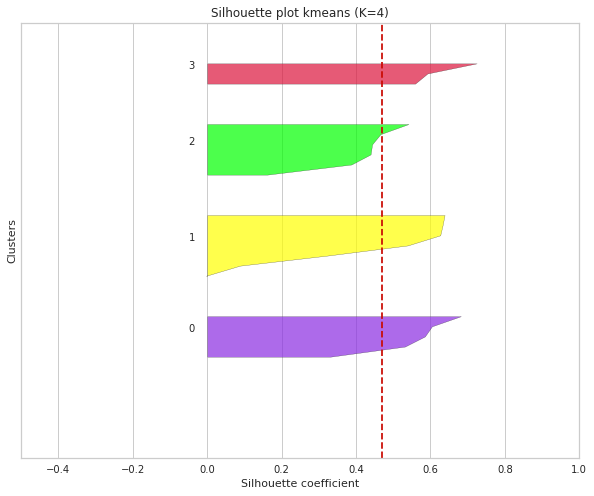

Kmeans silhouette_score 0.47098921084716605
Locations in cluster 0: 5
Locations in cluster 1: 7
Locations in cluster 2: 6
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
5: EUW1_6174116009 - Blue team Victory
Number of points:  24
distance between initial centroid [8250 4250] and final centroid [7973.8 4762.8] of blue team's bottom jungle: 582.4519551001611 

distance between initial centroid [4000 8750] and final centroid [3640.57142857 8055.57142857] of blue team's top jungle: 781.9334618594539 

distance between initial centroid [12000  7500] and final centroid [11999.33333333  3371.66666667] of red team's bottom jungle: 4128.333387161889

distance between initial centroid [ 7750 12000] and final centroid [ 7337.44444444 11620.88888889] of red team's top jungle: 560.2921746621619


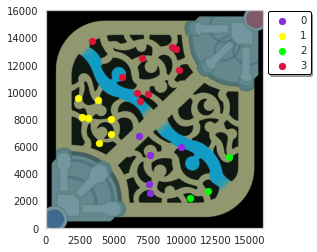

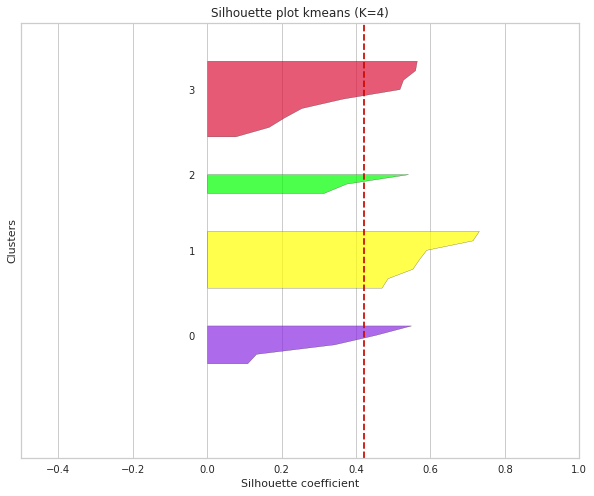

Kmeans silhouette_score 0.42259892773826374
Locations in cluster 0: 5
Locations in cluster 1: 7
Locations in cluster 2: 3
Locations in cluster 3: 9

--------------------------------------------------------------------------------------
6: EUW1_6169918453 - Blue team Victory
Number of points:  14
distance between initial centroid [8250 4250] and final centroid [10521.  3194.] of blue team's bottom jungle: 2504.511329581082 

distance between initial centroid [4000 8750] and final centroid [4526.16666667 9179.83333333] of blue team's top jungle: 679.4174383658079 

distance between initial centroid [12000  7500] and final centroid [13048.66666667  4989.        ] of red team's bottom jungle: 2721.1804015496245

distance between initial centroid [ 7750 12000] and final centroid [ 6692.5 12640. ] of red team's top jungle: 1236.085049662846


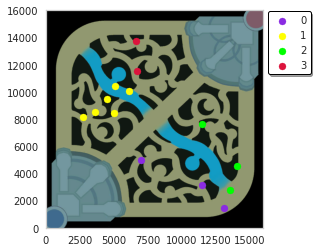

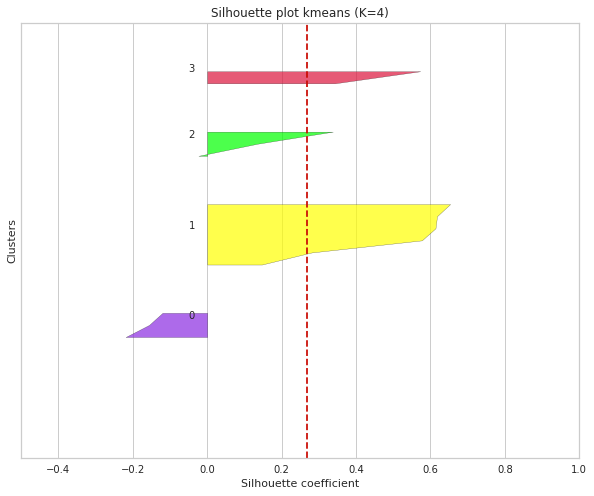

Kmeans silhouette_score 0.2684240935921975
Locations in cluster 0: 3
Locations in cluster 1: 6
Locations in cluster 2: 3
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
7: EUW1_6169720779 - Blue team Victory
Number of points:  26
distance between initial centroid [8250 4250] and final centroid [7443.16666667 4308.33333333] of blue team's bottom jungle: 808.939308944469 

distance between initial centroid [4000 8750] and final centroid [4072.85714286 9108.28571429] of blue team's top jungle: 365.6184026092372 

distance between initial centroid [12000  7500] and final centroid [12238.42857143  5590.28571429] of red team's bottom jungle: 1924.5406820160224

distance between initial centroid [ 7750 12000] and final centroid [ 7187.33333333 10902.33333333] of red team's top jungle: 1233.4771537766283


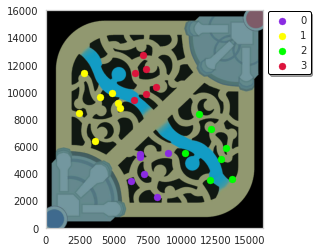

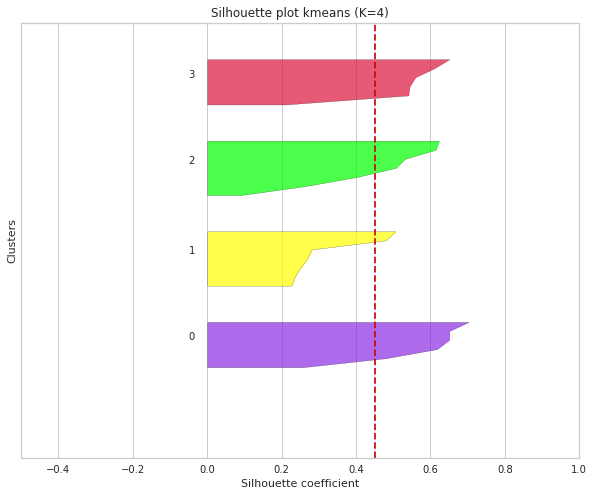

Kmeans silhouette_score 0.45225329771032546
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 7
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
8: EUW1_6167858594 - Blue team Victory
Number of points:  15
distance between initial centroid [8250 4250] and final centroid [8202.33333333 2841.66666667] of blue team's bottom jungle: 1409.1397691105335 

distance between initial centroid [4000 8750] and final centroid [3755.2 7591.6] of blue team's top jungle: 1183.9837836727322 

distance between initial centroid [12000  7500] and final centroid [9691.4 6171.2] of red team's bottom jungle: 2663.708580156621

distance between initial centroid [ 7750 12000] and final centroid [ 7371.  12480.5] of red team's top jungle: 611.9814131164443


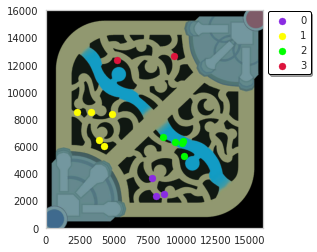

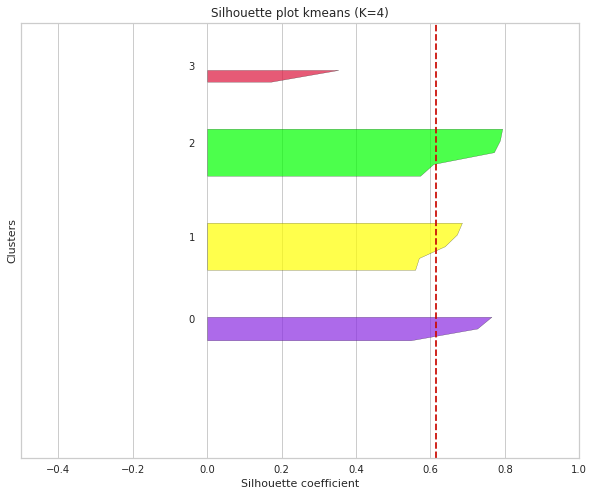

Kmeans silhouette_score 0.6142424380054539
Locations in cluster 0: 3
Locations in cluster 1: 5
Locations in cluster 2: 5
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
9: EUW1_6163745751 - Blue team Victory
Number of points:  12
distance between initial centroid [8250 4250] and final centroid [8238.8 5286. ] of blue team's bottom jungle: 1036.0605387717458 

distance between initial centroid [4000 8750] and final centroid [4678.66666667 8327.33333333] of blue team's top jungle: 799.5220794671999 

distance between initial centroid [12000  7500] and final centroid [13433.5  3537.5] of red team's bottom jungle: 4213.825874428131

distance between initial centroid [ 7750 12000] and final centroid [ 7050.5 11091. ] of red team's top jungle: 1146.987903162017


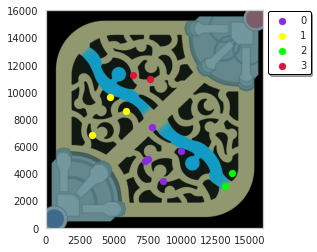

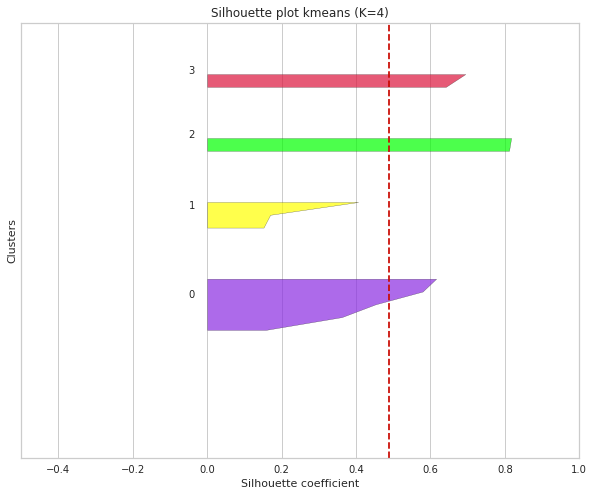

Kmeans silhouette_score 0.48794134001578787
Locations in cluster 0: 5
Locations in cluster 1: 3
Locations in cluster 2: 2
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
10: EUW1_6162711936 - Blue team Victory
Number of points:  15
distance between initial centroid [8250 4250] and final centroid [8090. 6365.] of blue team's bottom jungle: 2121.0433753226266 

distance between initial centroid [4000 8750] and final centroid [3469.85714286 9241.        ] of blue team's top jungle: 722.5873296561407 

distance between initial centroid [12000  7500] and final centroid [10142.66666667  4018.66666667] of red team's bottom jungle: 3945.8039597639518

distance between initial centroid [ 7750 12000] and final centroid [ 6481. 11302.] of red team's top jungle: 1448.297276114265


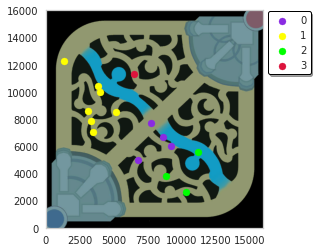

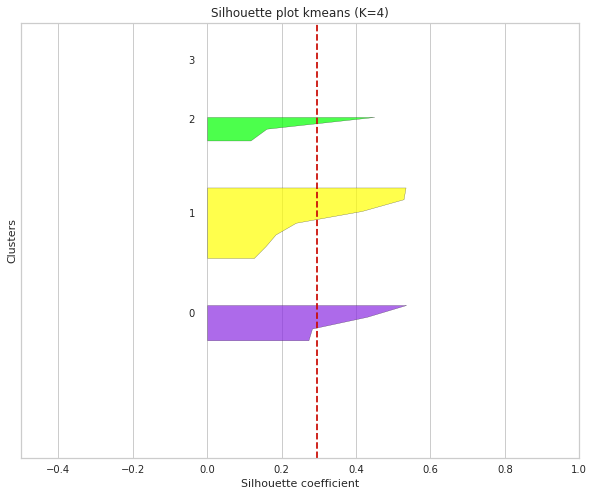

Kmeans silhouette_score 0.2949023399548378
Locations in cluster 0: 4
Locations in cluster 1: 7
Locations in cluster 2: 3
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
11: EUW1_6162519044 - Blue team Victory
Number of points:  24
distance between initial centroid [8250 4250] and final centroid [7680.71428571 4651.42857143] of blue team's bottom jungle: 696.5853303429375 

distance between initial centroid [4000 8750] and final centroid [3237.42857143 8279.57142857] of blue team's top jungle: 896.0012413438914 

distance between initial centroid [12000  7500] and final centroid [12013.   3406.8] of red team's bottom jungle: 4093.22064394286

distance between initial centroid [ 7750 12000] and final centroid [ 6927.8 11019. ] of red team's top jungle: 1279.9897812092095


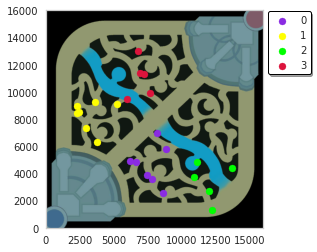

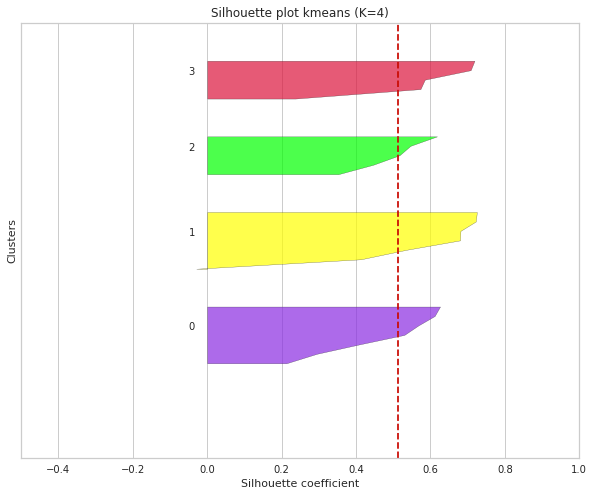

Kmeans silhouette_score 0.5115704310170702
Locations in cluster 0: 7
Locations in cluster 1: 7
Locations in cluster 2: 5
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
12: EUW1_6161672257 - Blue team Victory
Number of points:  20
distance between initial centroid [8250 4250] and final centroid [8729.         4664.85714286] of blue team's bottom jungle: 633.6777169662762 

distance between initial centroid [4000 8750] and final centroid [3727.28571429 8309.71428571] of blue team's top jungle: 517.9040372856094 

distance between initial centroid [12000  7500] and final centroid [12435.          8205.33333333] of red team's bottom jungle: 828.6857734455878

distance between initial centroid [ 7750 12000] and final centroid [ 6330.33333333 12419.66666667] of red team's top jungle: 1480.3964183810888


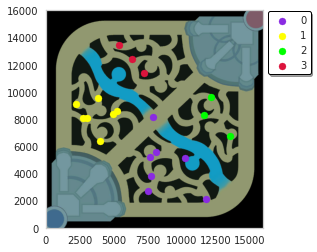

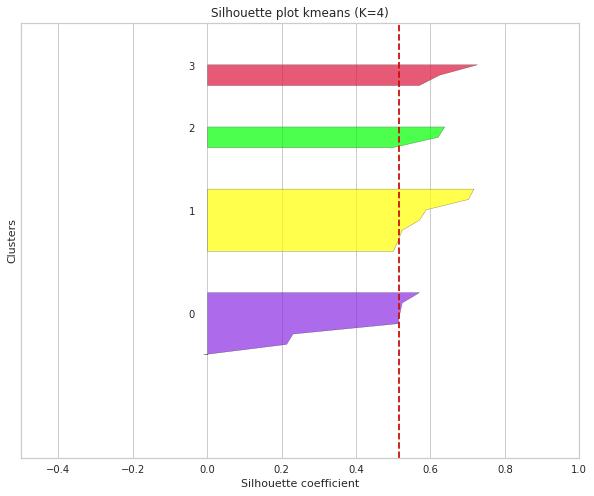

Kmeans silhouette_score 0.5164520355808907
Locations in cluster 0: 7
Locations in cluster 1: 7
Locations in cluster 2: 3
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
13: EUW1_6161274781 - Blue team Victory
Number of points:  23
distance between initial centroid [8250 4250] and final centroid [8641.66666667 3351.83333333] of blue team's bottom jungle: 979.8500593911741 

distance between initial centroid [4000 8750] and final centroid [3552.2 7436.2] of blue team's top jungle: 1388.0184724995559 

distance between initial centroid [12000  7500] and final centroid [11175.33333333  7819.33333333] of red team's bottom jungle: 884.3352808120276

distance between initial centroid [ 7750 12000] and final centroid [6323.5        9518.33333333] of red team's top jungle: 2862.441561751864


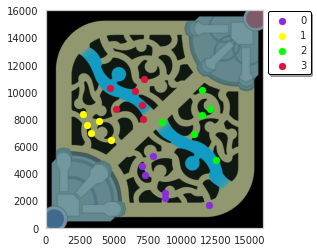

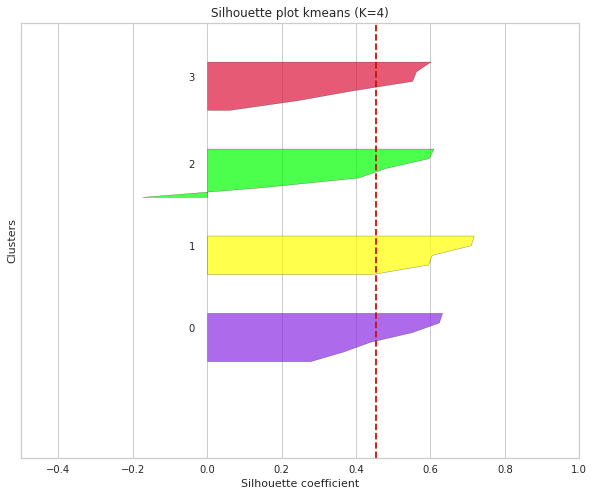

Kmeans silhouette_score 0.45251816083305135
Locations in cluster 0: 6
Locations in cluster 1: 5
Locations in cluster 2: 6
Locations in cluster 3: 6

--------------------------------------------------------------------------------------
14: EUW1_6160353201 - Blue team Victory
Number of points:  19
distance between initial centroid [8250 4250] and final centroid [8269.33333333 4463.83333333] of blue team's bottom jungle: 214.70554772111154 

distance between initial centroid [4000 8750] and final centroid [3599.  8174.2] of blue team's top jungle: 701.6741693977342 

distance between initial centroid [12000  7500] and final centroid [11648.75  6890.  ] of red team's bottom jungle: 703.9009607181965

distance between initial centroid [ 7750 12000] and final centroid [ 6589.   11105.75] of red team's top jungle: 1465.4705942119754


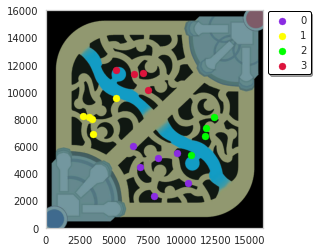

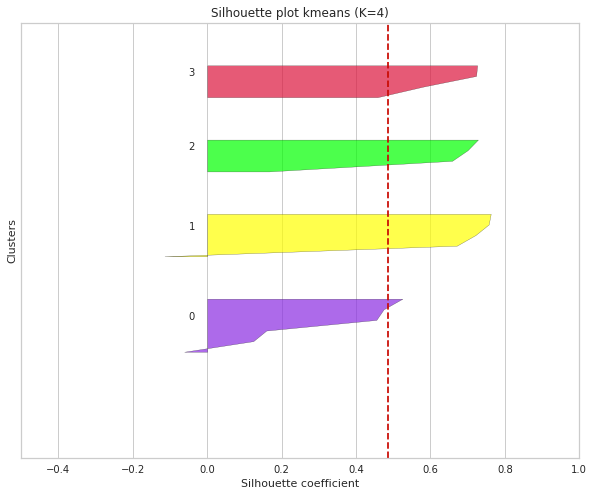

Kmeans silhouette_score 0.4847029700279334
Locations in cluster 0: 6
Locations in cluster 1: 5
Locations in cluster 2: 4
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
15: EUW1_6160146060 - Blue team Victory
Number of points:  23
distance between initial centroid [8250 4250] and final centroid [7924.85714286 5522.28571429] of blue team's bottom jungle: 1313.1750897449012 

distance between initial centroid [4000 8750] and final centroid [3077.5        8372.16666667] of blue team's top jungle: 996.87726314616 

distance between initial centroid [12000  7500] and final centroid [12410.66666667  5453.33333333] of red team's bottom jungle: 2087.4605518561434

distance between initial centroid [ 7750 12000] and final centroid [ 6888.         11478.28571429] of red team's top jungle: 1007.5861233256281


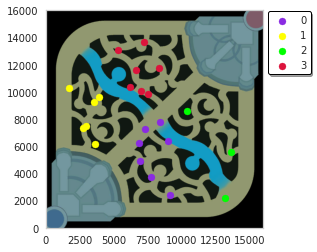

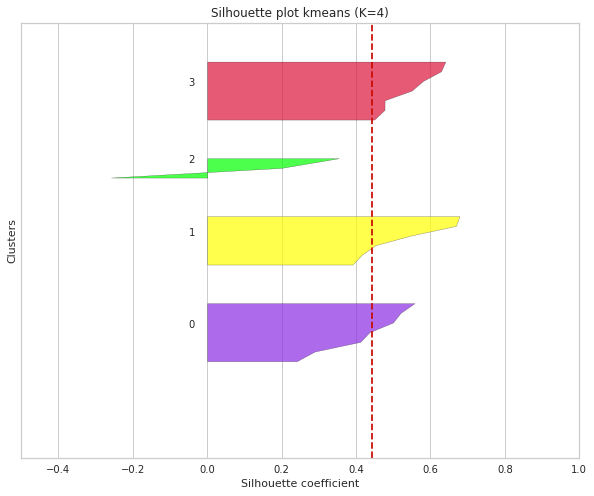

Kmeans silhouette_score 0.4435247964872671
Locations in cluster 0: 7
Locations in cluster 1: 6
Locations in cluster 2: 3
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
16: EUW1_6156559340 - Blue team Victory
Number of points:  22
distance between initial centroid [8250 4250] and final centroid [7980.83333333 5393.16666667] of blue team's bottom jungle: 1174.427827591897 

distance between initial centroid [4000 8750] and final centroid [3998.85714286 8736.        ] of blue team's top jungle: 14.046569775179279 

distance between initial centroid [12000  7500] and final centroid [11524.25  7017.25] of red team's bottom jungle: 677.7799237215572

distance between initial centroid [ 7750 12000] and final centroid [ 6786.  10519.8] of red team's top jungle: 1766.433706653041


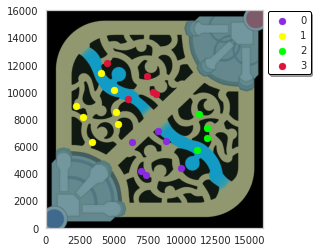

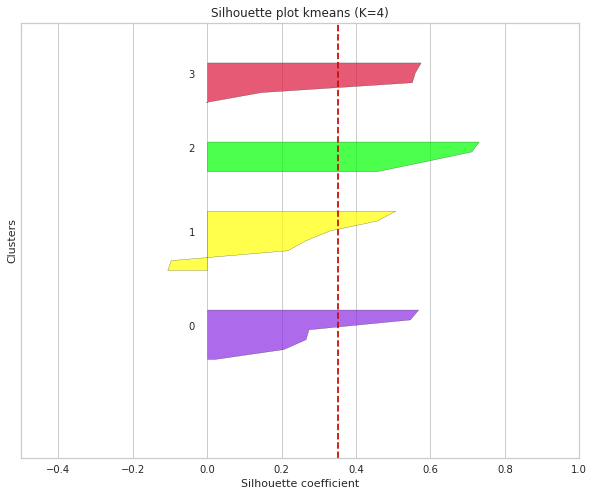

Kmeans silhouette_score 0.3518604764346707
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
17: EUW1_6156430957 - Blue team Victory
Number of points:  34
distance between initial centroid [8250 4250] and final centroid [8840.4 2839.9] of blue team's bottom jungle: 1528.709969222417 

distance between initial centroid [4000 8750] and final centroid [3379.2 8142.7] of blue team's top jungle: 868.4503037019449 

distance between initial centroid [12000  7500] and final centroid [11295.5  7479. ] of red team's bottom jungle: 704.8129184400638

distance between initial centroid [ 7750 12000] and final centroid [ 4743.875 11707.25 ] of red team's top jungle: 3020.346019601893


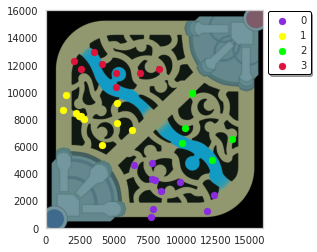

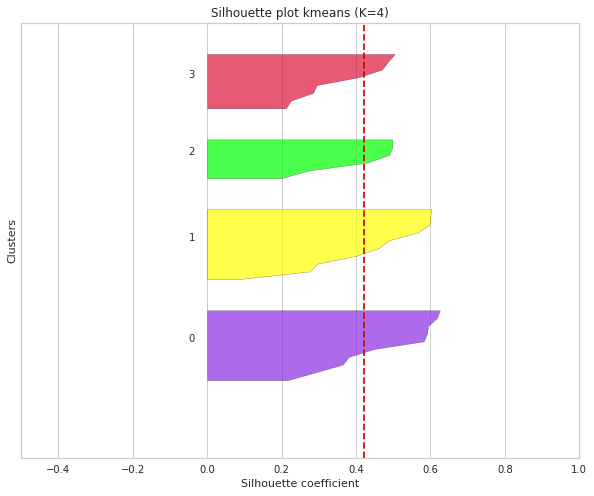

Kmeans silhouette_score 0.4218063108596315
Locations in cluster 0: 10
Locations in cluster 1: 10
Locations in cluster 2: 6
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
18: EUW1_6155407030 - Blue team Victory
Number of points:  20
distance between initial centroid [8250 4250] and final centroid [8140.5        4190.66666667] of blue team's bottom jungle: 124.54193849641337 

distance between initial centroid [4000 8750] and final centroid [3367.2 8603.8] of blue team's top jungle: 649.4692294481706 

distance between initial centroid [12000  7500] and final centroid [ 2467.5 12489.5] of red team's bottom jungle: 10759.352513046499

distance between initial centroid [ 7750 12000] and final centroid [7660.85714286 9754.85714286] of red team's top jungle: 2246.9118580752524


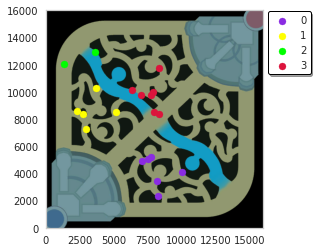

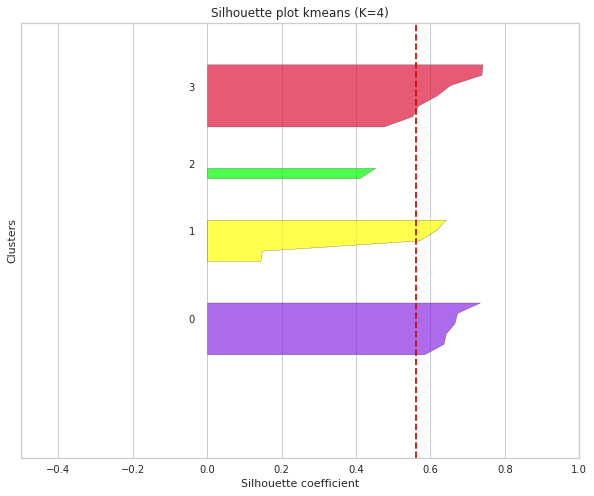

Kmeans silhouette_score 0.5623320460937714
Locations in cluster 0: 6
Locations in cluster 1: 5
Locations in cluster 2: 2
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
19: EUW1_6154372504 - Blue team Victory
Number of points:  33
distance between initial centroid [8250 4250] and final centroid [7843.14285714 3771.71428571] of blue team's bottom jungle: 627.9251222746818 

distance between initial centroid [4000 8750] and final centroid [3929.30769231 9011.07692308] of blue team's top jungle: 270.47839494158825 

distance between initial centroid [12000  7500] and final centroid [12097.5  7193.5] of red team's bottom jungle: 321.6341088877235

distance between initial centroid [ 7750 12000] and final centroid [ 7193.         12065.28571429] of red team's top jungle: 560.8130031390106


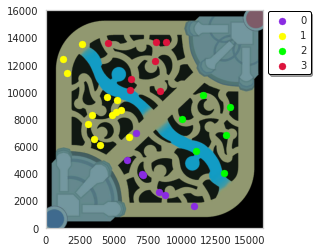

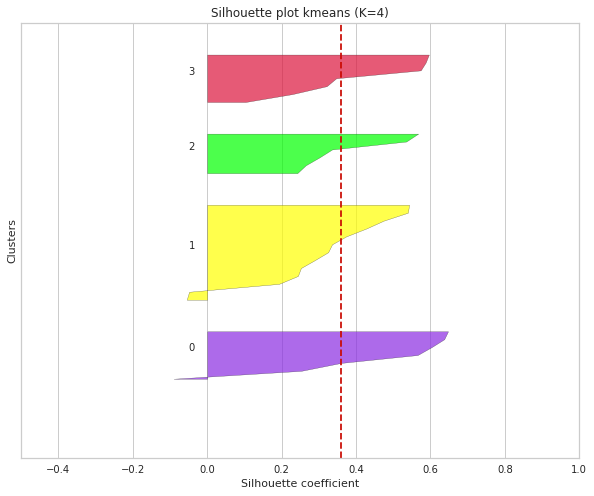

Kmeans silhouette_score 0.3597128342067977
Locations in cluster 0: 7
Locations in cluster 1: 13
Locations in cluster 2: 6
Locations in cluster 3: 7

--------------------------------------------------------------------------------------
20: EUW1_6154082054 - Blue team Victory
Number of points:  22
distance between initial centroid [8250 4250] and final centroid [7750.66666667 5424.33333333] of blue team's bottom jungle: 1276.0848543711961 

distance between initial centroid [4000 8750] and final centroid [4840.71428571 8072.        ] of blue team's top jungle: 1080.039124385817 

distance between initial centroid [12000  7500] and final centroid [11917.875  6486.625] of red team's bottom jungle: 1016.6973031586147

distance between initial centroid [ 7750 12000] and final centroid [ 8484. 13392.] of red team's top jungle: 1573.6645131666405


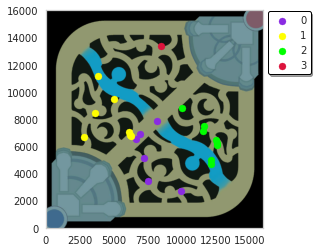

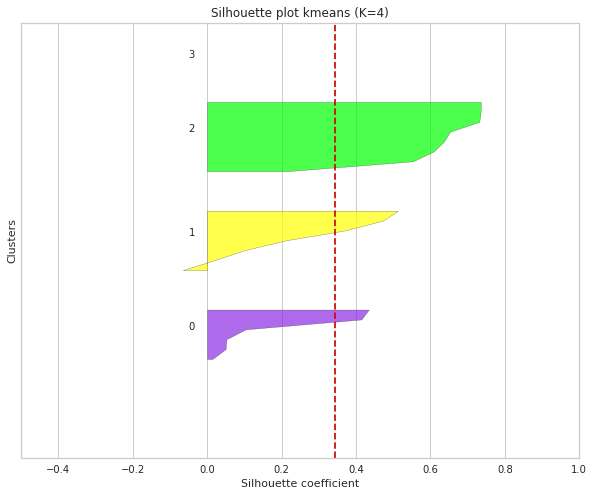

Kmeans silhouette_score 0.34335437152050813
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 8
Locations in cluster 3: 1

--------------------------------------------------------------------------------------


In [ ]:
n = 1
scores = []
npoints = []
bb = []
bt = []
rb = []
rt = []
centroid1_distance = []
centroid2_distance = []
centroid3_distance = []
centroid4_distance = []
for game in blueTeamWins_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Victory".format(n, game, game_df["team"].unique()[0]))
    print("Number of points: ", game_df.shape[0])
    npoints.append(game_df.shape[0])
    c1, c2, c3, c4 = clustering(game_df, scores, bb, bt, rb, rt)
    centroid1_distance.append(c1)
    centroid2_distance.append(c2)
    centroid3_distance.append(c3)
    centroid4_distance.append(c4)
    n += 1

In [ ]:
c1_mean_dist = np.mean(np.array(centroid1_distance))
c2_mean_dist = np.mean(np.array(centroid2_distance))
c3_mean_dist = np.mean(np.array(centroid3_distance))
c4_mean_dist = np.mean(np.array(centroid4_distance))
mean = np.mean(np.array(scores))
avPoints = np.mean(np.array(npoints))
avBb = np.sum(np.array(bb))
avBt = np.sum(np.array(bt))
avRb = np.sum(np.array(rb))
avRt = np.sum(np.array(rt))
print("When Red team Wins:")
print(" - Average silhouette score: ", mean)
print(" - Average points: ", avPoints)
print(" - Average points on the blue team's bottom jungle: ", avBb)
print(" - Average points on the blue team's top jungle: ", avBt)
print(" - Average points on the red team's bottom jungle: ", avRb)
print(" - Average points on the red team's top jungle: ", avRt)
print(" - Average distance between centroids of blue team's bottom jungle: ", c1_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c2_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c3_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c4_mean_dist)

When Red team Wins:
 - Average silhouette score:  0.4352616334071845
 - Average points:  21.65
 - Average points on the blue team's bottom jungle:  115
 - Average points on the blue team's top jungle:  132
 - Average points on the red team's bottom jungle:  95
 - Average points on the red team's top jungle:  91
 - Average distance between centroids of blue team's bottom jungle:  1056.0205234603006
 - Average distance between centroids of blue team's bottom jungle:  817.8017167074671
 - Average distance between centroids of blue team's bottom jungle:  2209.0127914627706
 - Average distance between centroids of blue team's bottom jungle:  2181.8918016606603


distance between initial centroid [8250 4250] and final centroid [8495.70833333 4168.875     ] of blue team's bottom jungle: 258.7544215939971 

distance between initial centroid [4000 8750] and final centroid [3631.875      8734.81617647] of blue team's top jungle: 368.4380058055556 

distance between initial centroid [12000  7500] and final centroid [11933.91666667  6669.77380952] of red team's bottom jungle: 832.8520482637075

distance between initial centroid [ 7750 12000] and final centroid [ 7073.72043011 10735.2688172 ] of red team's top jungle: 1434.1893255040445


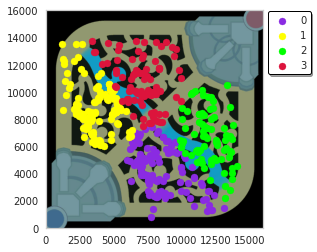

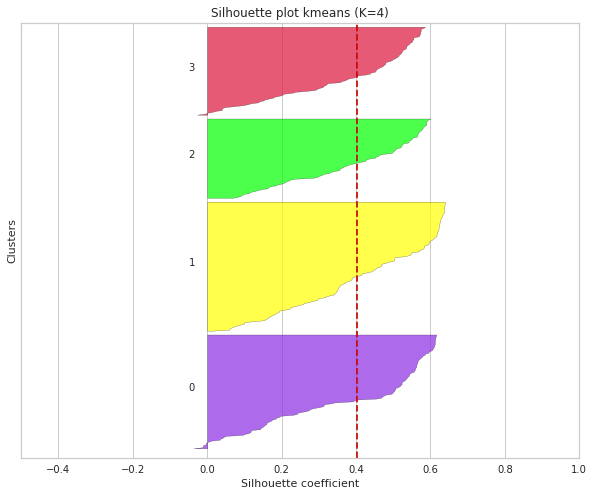

Kmeans silhouette_score 0.4017395335177701
Locations in cluster 0: 120
Locations in cluster 1: 136
Locations in cluster 2: 84
Locations in cluster 3: 93

--------------------------------------------------------------------------------------


(258.7544215939971, 368.4380058055556, 832.8520482637075, 1434.1893255040445)

In [ ]:
scores = []
clustering(blueTeamWins_df, scores)

---

### Blue Team loses (outliers removed)

In [ ]:
blueTeamLoses_df = blueTeam_df.loc[blueTeam_df["won"] == False]
print("Blue Team losing Data Frame:\n{}".format(blueTeamLoses_df))
print("\nElyoya lost {} matches on the blue team.".format(blueTeamLoses_df["gameId"].nunique()))

Blue Team losing Data Frame:
               gameId  timestamp  coordinate_x  coordinate_y  team    won
278   EUW1_6169858331   1.000350          5164          8533  Blue  False
279   EUW1_6169858331   2.000733          2405          8256  Blue  False
280   EUW1_6169858331   3.000983          8084          5128  Blue  False
281   EUW1_6169858331   4.001250         11371          5748  Blue  False
282   EUW1_6169858331   5.001683          3186          8053  Blue  False
...               ...        ...           ...           ...   ...    ...
1943  EUW1_6153946340  16.004467          8166          3308  Blue  False
1944  EUW1_6153946340  17.004650          6000          8539  Blue  False
1945  EUW1_6153946340  18.005033          2289          9364  Blue  False
1948  EUW1_6153946340  21.005933          3570          6533  Blue  False
1949  EUW1_6153946340  22.006317          3522          9030  Blue  False

[420 rows x 6 columns]

Elyoya lost 19 matches on the blue team.


1: EUW1_6169858331 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8015.33333333 3762.        ] of blue team's bottom jungle: 541.4909458563869 

distance between initial centroid [4000 8750] and final centroid [3155. 8360.] of blue team's top jungle: 930.658369112963 

distance between initial centroid [12000  7500] and final centroid [11371.  5748.] of red team's bottom jungle: 1861.4899946010992

distance between initial centroid [ 7750 12000] and final centroid [11753.  1312.] of red team's top jungle: 11413.03434674583


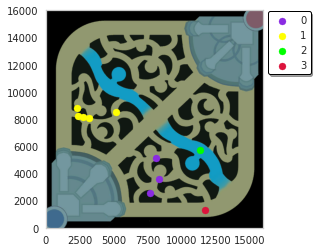

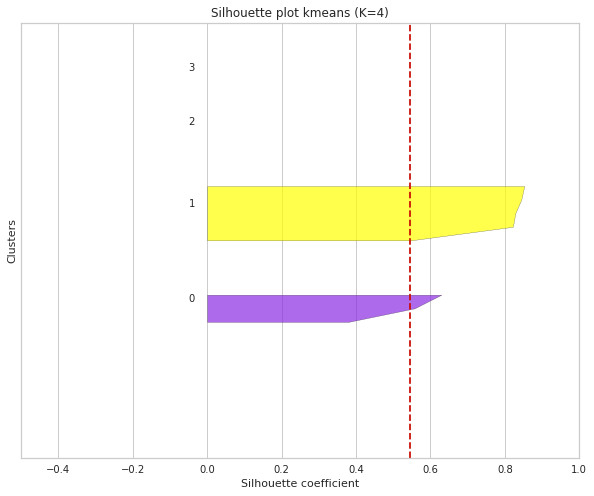

Kmeans silhouette_score 0.5459172798838315
Locations in cluster 0: 3
Locations in cluster 1: 5
Locations in cluster 2: 1
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
2: EUW1_6169193635 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8060.83333333 3107.66666667] of blue team's bottom jungle: 1157.8900950531624 

distance between initial centroid [4000 8750] and final centroid [4579. 7378.] of blue team's top jungle: 1489.1692314844543 

distance between initial centroid [12000  7500] and final centroid [ 3637.25 12178.  ] of red team's bottom jungle: 9582.237294207443

distance between initial centroid [ 7750 12000] and final centroid [6134.  9483.5] of red team's top jungle: 2990.6902631332455


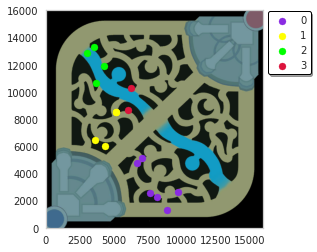

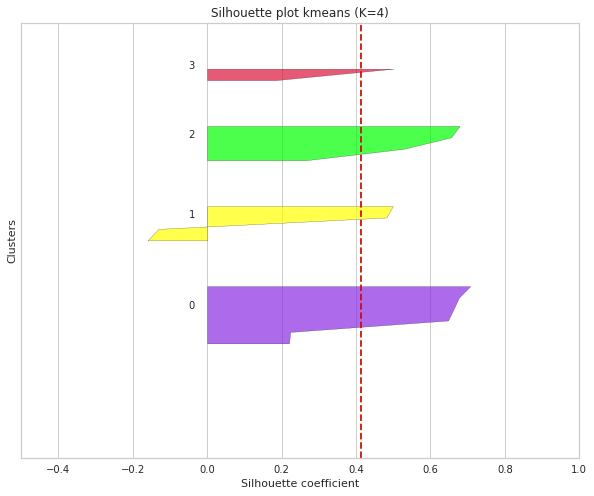

Kmeans silhouette_score 0.414768612329588
Locations in cluster 0: 6
Locations in cluster 1: 4
Locations in cluster 2: 4
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
3: EUW1_6167017540 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8701.41666667 3698.08333333] of blue team's bottom jungle: 713.0140348470626 

distance between initial centroid [4000 8750] and final centroid [3485.5   8297.375] of blue team's top jungle: 685.258812876566 

distance between initial centroid [12000  7500] and final centroid [12020.  1193.] of red team's bottom jungle: 6307.031710717808

distance between initial centroid [ 7750 12000] and final centroid [ 1182. 11369.] of red team's top jungle: 6598.241053492969


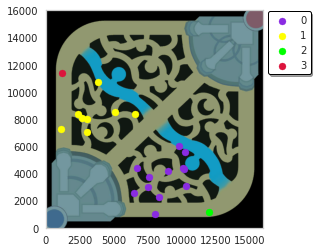

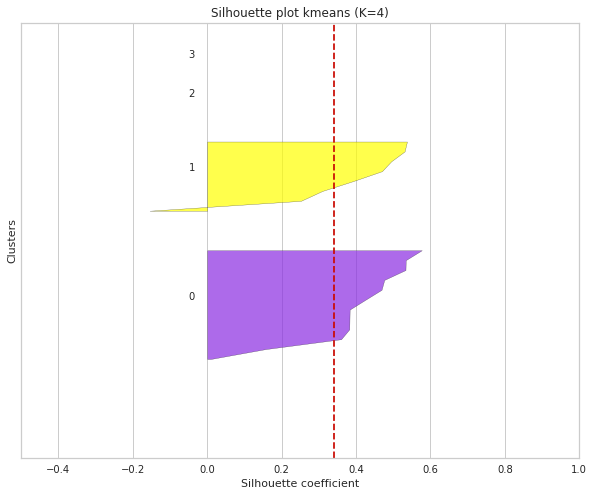

Kmeans silhouette_score 0.3417385397976437
Locations in cluster 0: 12
Locations in cluster 1: 8
Locations in cluster 2: 1
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
4: EUW1_6166396166 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7750.2 3215. ] of blue team's bottom jungle: 1149.3585341398045 

distance between initial centroid [4000 8750] and final centroid [3541.11111111 8863.55555556] of blue team's top jungle: 472.73023654427806 

distance between initial centroid [12000  7500] and final centroid [8422.         7638.33333333] of red team's bottom jungle: 3580.673136591933

distance between initial centroid [ 7750 12000] and final centroid [11095.6  3128.6] of red team's top jungle: 9481.285636452474


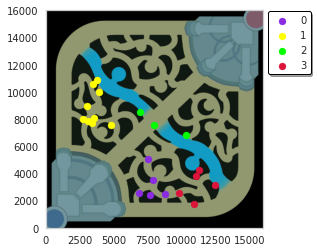

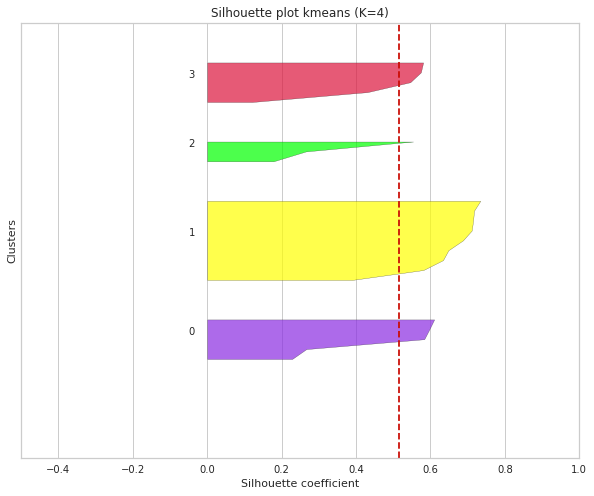

Kmeans silhouette_score 0.5160125457195194
Locations in cluster 0: 5
Locations in cluster 1: 9
Locations in cluster 2: 3
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
5: EUW1_6163920728 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8193.  4234.5] of blue team's bottom jungle: 59.06987387831465 

distance between initial centroid [4000 8750] and final centroid [2630.7 7550.2] of blue team's top jungle: 1820.577526500863 

distance between initial centroid [12000  7500] and final centroid [ 2152. 11673.] of red team's bottom jungle: 10695.654865411467

distance between initial centroid [ 7750 12000] and final centroid [5711.         9422.33333333] of red team's top jungle: 3286.6223458810186


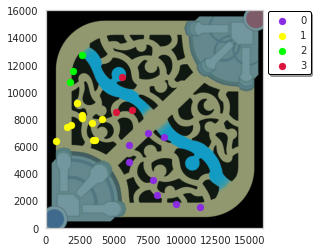

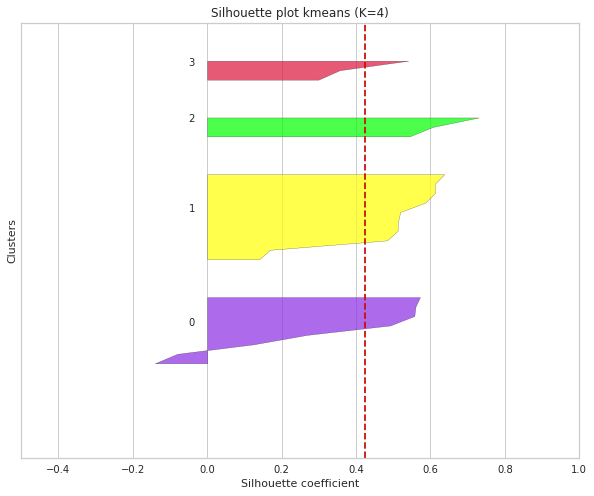

Kmeans silhouette_score 0.42539464798969817
Locations in cluster 0: 8
Locations in cluster 1: 10
Locations in cluster 2: 3
Locations in cluster 3: 3

--------------------------------------------------------------------------------------
6: EUW1_6163819437 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7250.88888889 5893.77777778] of blue team's bottom jungle: 1923.5977737203086 

distance between initial centroid [4000 8750] and final centroid [2985.42857143 8364.42857143] of blue team's top jungle: 1085.3665326534078 

distance between initial centroid [12000  7500] and final centroid [10316.75  5347.25] of red team's bottom jungle: 2732.7025313780496

distance between initial centroid [ 7750 12000] and final centroid [11390.5  2367. ] of red team's top jungle: 10297.957528073224


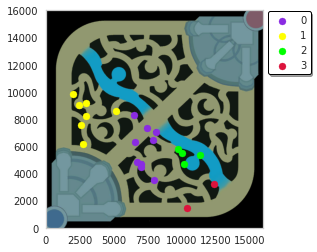

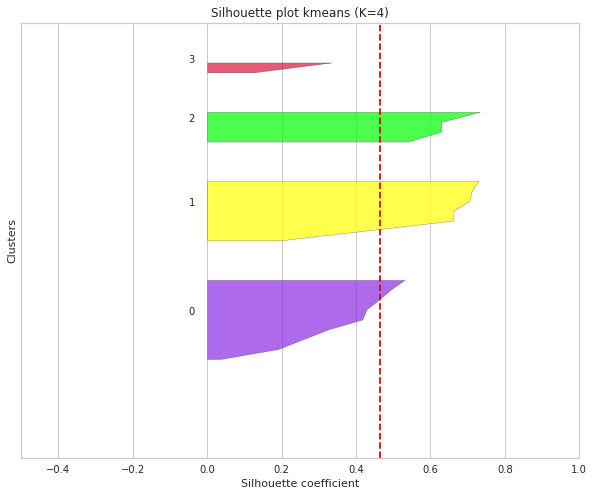

Kmeans silhouette_score 0.46466298193999406
Locations in cluster 0: 9
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
7: EUW1_6163787785 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [9160.         3275.33333333] of blue team's bottom jungle: 1333.444828671629 

distance between initial centroid [4000 8750] and final centroid [2853.77777778 7902.88888889] of blue team's top jungle: 1425.279838236671 

distance between initial centroid [12000  7500] and final centroid [ 4281.5 12887.5] of red team's bottom jungle: 9412.77846865632

distance between initial centroid [ 7750 12000] and final centroid [7011.5 9637. ] of red team's top jungle: 2475.7122712463984


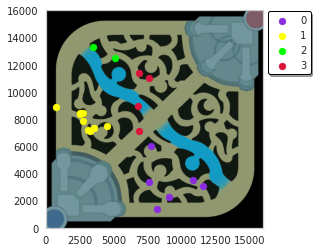

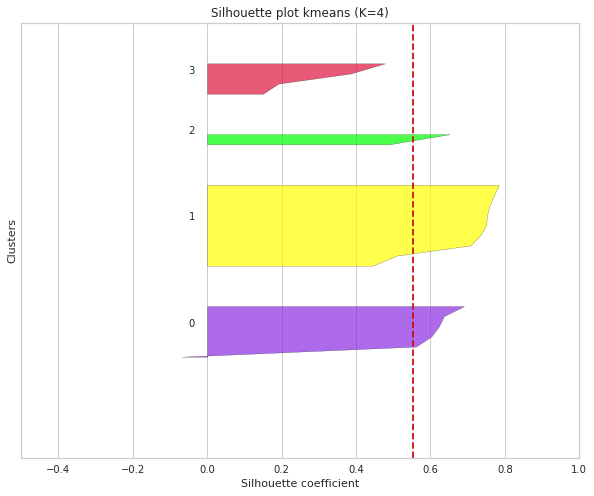

Kmeans silhouette_score 0.5525230807638982
Locations in cluster 0: 6
Locations in cluster 1: 9
Locations in cluster 2: 2
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
8: EUW1_6162658973 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7969.25 3216.25] of blue team's bottom jungle: 1071.1954186795238 

distance between initial centroid [4000 8750] and final centroid [3163.7 9247.6] of blue team's top jungle: 973.1410226683489 

distance between initial centroid [12000  7500] and final centroid [11475.  7465.] of red team's bottom jungle: 526.1653732430518

distance between initial centroid [ 7750 12000] and final centroid [8361. 9065.] of red team's top jungle: 2997.9236147707297


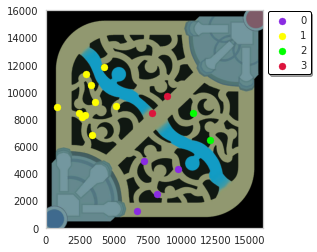

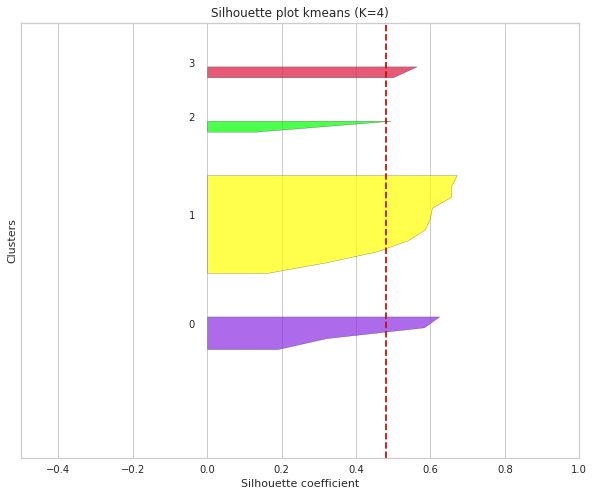

Kmeans silhouette_score 0.48050215420495523
Locations in cluster 0: 4
Locations in cluster 1: 10
Locations in cluster 2: 2
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
9: EUW1_6161574129 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7754.125 5396.625] of blue team's bottom jungle: 1249.2561411696163 

distance between initial centroid [4000 8750] and final centroid [3495.5        9508.83333333] of blue team's top jungle: 911.234480129993 

distance between initial centroid [12000  7500] and final centroid [11356.  6933.] of red team's bottom jungle: 858.0355470491884

distance between initial centroid [ 7750 12000] and final centroid [ 6829.  10865.5] of red team's top jungle: 1461.2772666403869


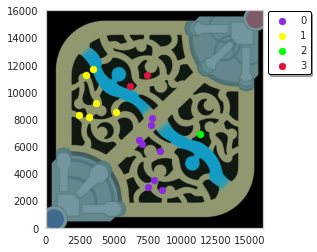

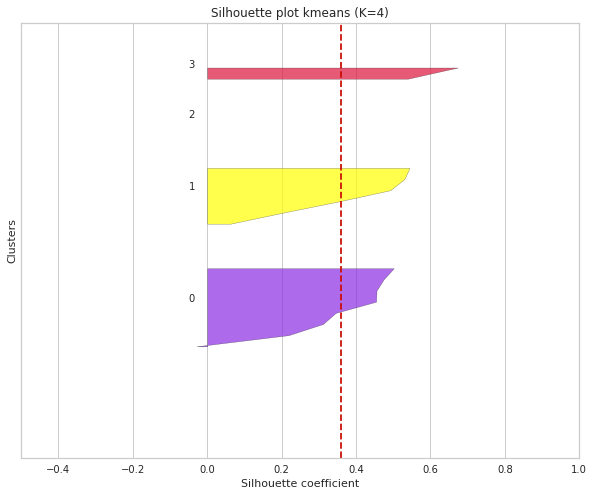

Kmeans silhouette_score 0.3607920400502359
Locations in cluster 0: 8
Locations in cluster 1: 6
Locations in cluster 2: 1
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
10: EUW1_6161529208 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8482.33333333 4437.33333333] of blue team's bottom jungle: 298.4502564173052 

distance between initial centroid [4000 8750] and final centroid [2986.33333333 8432.        ] of blue team's top jungle: 1062.3766333608396 

distance between initial centroid [12000  7500] and final centroid [12395.5  3855. ] of red team's bottom jungle: 3666.3940391070896

distance between initial centroid [ 7750 12000] and final centroid [ 5327. 12284.] of red team's top jungle: 2439.5870552206165


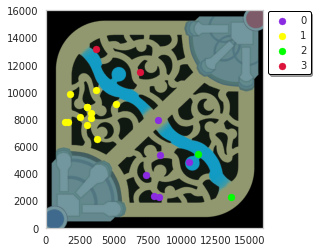

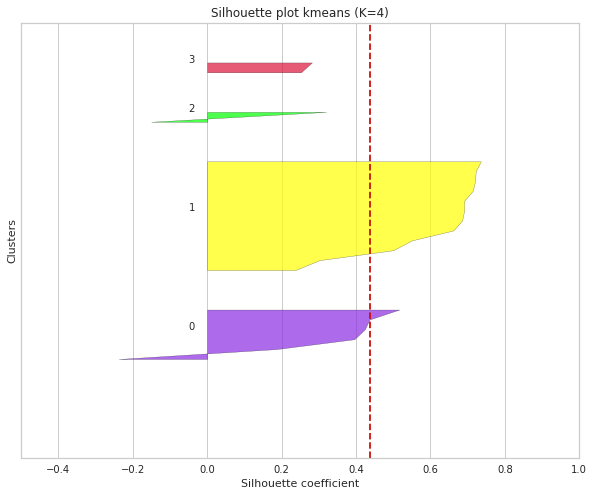

Kmeans silhouette_score 0.43776650951312546
Locations in cluster 0: 6
Locations in cluster 1: 12
Locations in cluster 2: 2
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
11: EUW1_6160920662 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8422.33333333 2625.83333333] of blue team's bottom jungle: 1633.2838512912833 

distance between initial centroid [4000 8750] and final centroid [3271.77777778 8699.22222222] of blue team's top jungle: 729.9904024398687 

distance between initial centroid [12000  7500] and final centroid [11385.  8267.] of red team's bottom jungle: 983.1144389133952

distance between initial centroid [ 7750 12000] and final centroid [7787.  6762.2] of red team's top jungle: 5237.93068300832


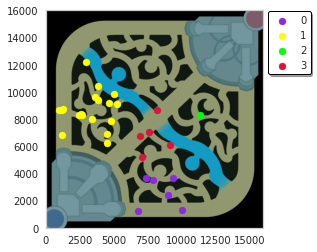

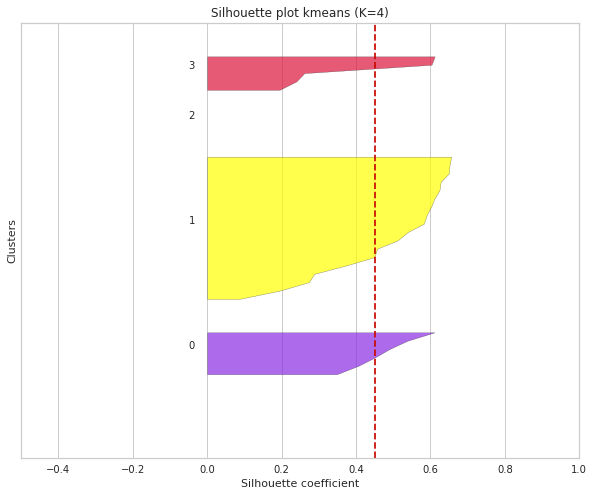

Kmeans silhouette_score 0.4506879605941416
Locations in cluster 0: 6
Locations in cluster 1: 18
Locations in cluster 2: 1
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
12: EUW1_6160297288 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7182.5 4875.5] of blue team's bottom jungle: 1237.2576530375554 

distance between initial centroid [4000 8750] and final centroid [3968.625 8844.75 ] of blue team's top jungle: 99.80958433437142 

distance between initial centroid [12000  7500] and final centroid [12446.25  1596.5 ] of red team's bottom jungle: 5920.342161775787

distance between initial centroid [ 7750 12000] and final centroid [ 2988.5 12821.5] of red team's top jungle: 4831.846903617705


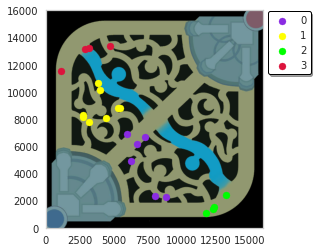

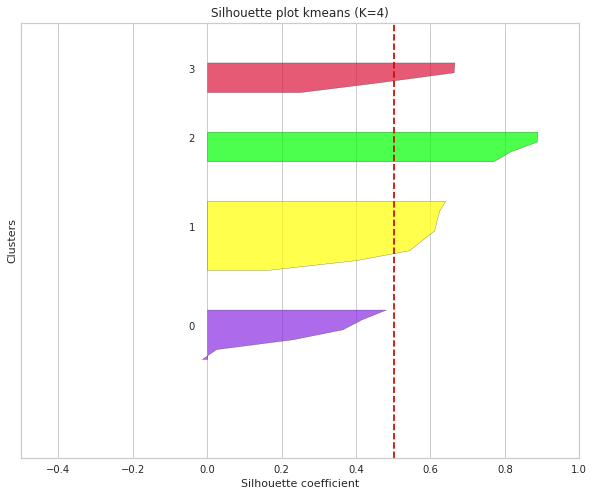

Kmeans silhouette_score 0.5028992362030943
Locations in cluster 0: 6
Locations in cluster 1: 8
Locations in cluster 2: 4
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
13: EUW1_6160122620 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8092.6 4437.6] of blue team's bottom jungle: 244.8847075666425 

distance between initial centroid [4000 8750] and final centroid [4195.5   9249.875] of blue team's top jungle: 536.745065766794 

distance between initial centroid [12000  7500] and final centroid [11480.  6509.] of red team's bottom jungle: 1119.1429756737966

distance between initial centroid [ 7750 12000] and final centroid [ 7796.  11608.5] of red team's top jungle: 394.19316330956326


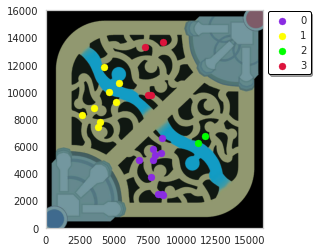

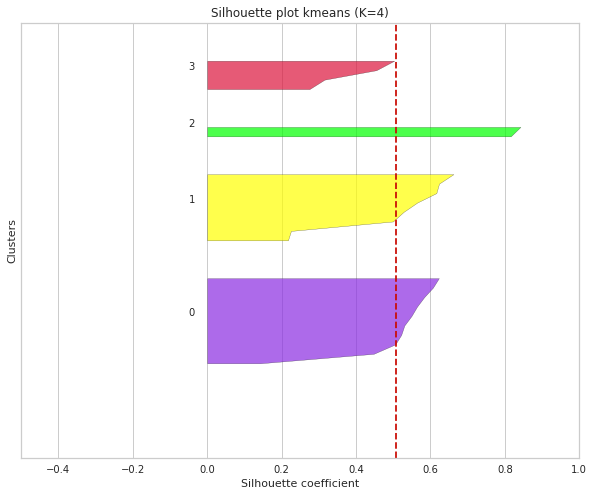

Kmeans silhouette_score 0.5088304335949719
Locations in cluster 0: 10
Locations in cluster 1: 8
Locations in cluster 2: 2
Locations in cluster 3: 4

--------------------------------------------------------------------------------------
14: EUW1_6156848197 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [6899. 6056.] of blue team's bottom jungle: 2255.4017380502305 

distance between initial centroid [4000 8750] and final centroid [3243.125 9935.75 ] of blue team's top jungle: 1406.7205934815202 

distance between initial centroid [12000  7500] and final centroid [11170.625  5602.25 ] of red team's bottom jungle: 2071.0668635089983

distance between initial centroid [ 7750 12000] and final centroid [ 7748. 12269.] of red team's top jungle: 269.0074348414928


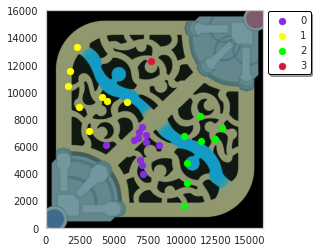

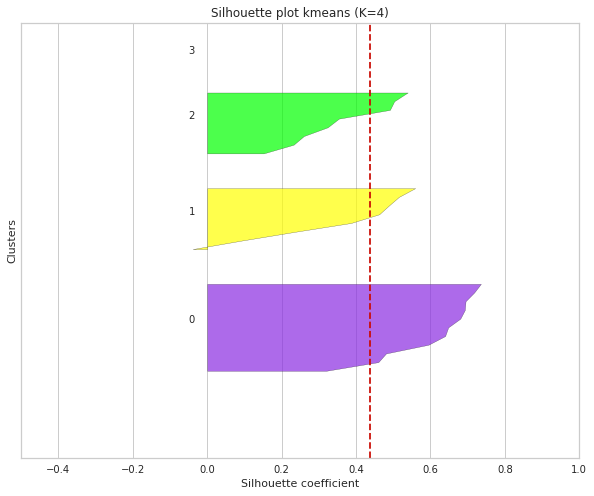

Kmeans silhouette_score 0.43650742541202975
Locations in cluster 0: 11
Locations in cluster 1: 8
Locations in cluster 2: 8
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
15: EUW1_6156652620 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7299.4 4259.2] of blue team's bottom jungle: 950.6445182085672 

distance between initial centroid [4000 8750] and final centroid [3324.53846154 8753.92307692] of blue team's top jungle: 675.4729309701257 

distance between initial centroid [12000  7500] and final centroid [11111.33333333  4362.33333333] of red team's bottom jungle: 3261.085793958134

distance between initial centroid [ 7750 12000] and final centroid [7508.5 8572. ] of red team's top jungle: 3436.4962170792505


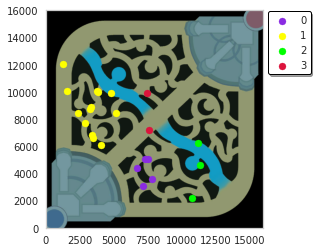

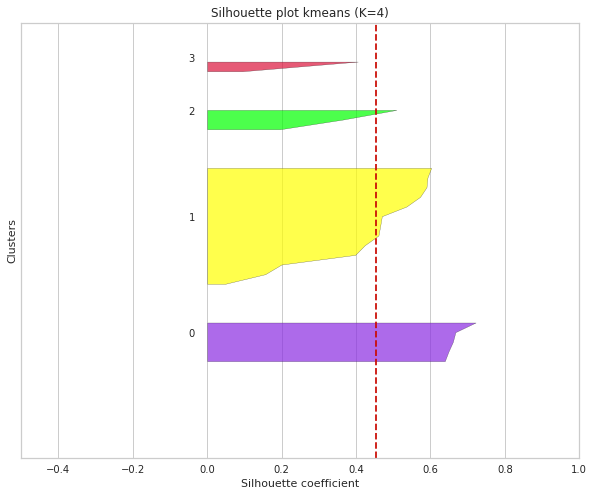

Kmeans silhouette_score 0.45283316129888185
Locations in cluster 0: 5
Locations in cluster 1: 13
Locations in cluster 2: 3
Locations in cluster 3: 2

--------------------------------------------------------------------------------------
16: EUW1_6156323238 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7470.66666667 4453.33333333] of blue team's bottom jungle: 805.4221805294964 

distance between initial centroid [4000 8750] and final centroid [3653.         8230.85714286] of blue team's top jungle: 624.4343889652849 

distance between initial centroid [12000  7500] and final centroid [10752.   4286.5] of red team's bottom jungle: 3447.330307643873

distance between initial centroid [ 7750 12000] and final centroid [12872.  3193.] of red team's top jungle: 10188.136875798244


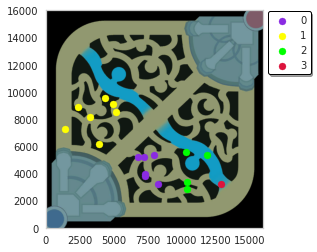

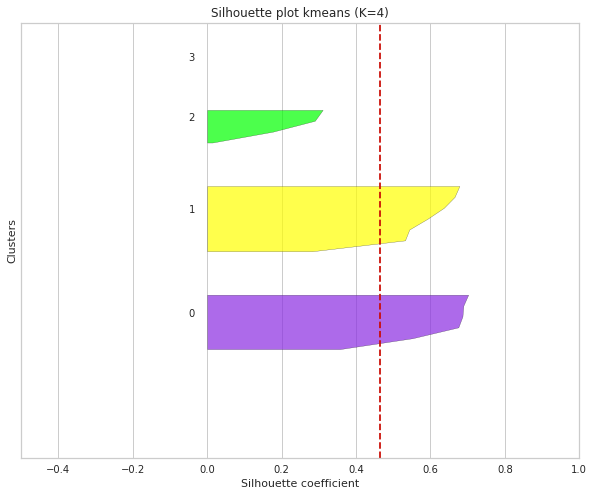

Kmeans silhouette_score 0.4654705202520819
Locations in cluster 0: 6
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 1

--------------------------------------------------------------------------------------
17: EUW1_6155602476 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8875.75  4141.375] of blue team's bottom jungle: 635.108221585109 

distance between initial centroid [4000 8750] and final centroid [4017.15 8543.4 ] of blue team's top jungle: 207.31059427824744 

distance between initial centroid [12000  7500] and final centroid [11301.          7695.33333333] of red team's bottom jungle: 725.7796574106435

distance between initial centroid [ 7750 12000] and final centroid [ 7336.375 11188.75 ] of red team's top jungle: 910.6108955668167


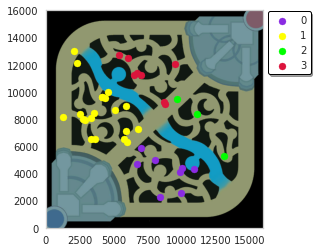

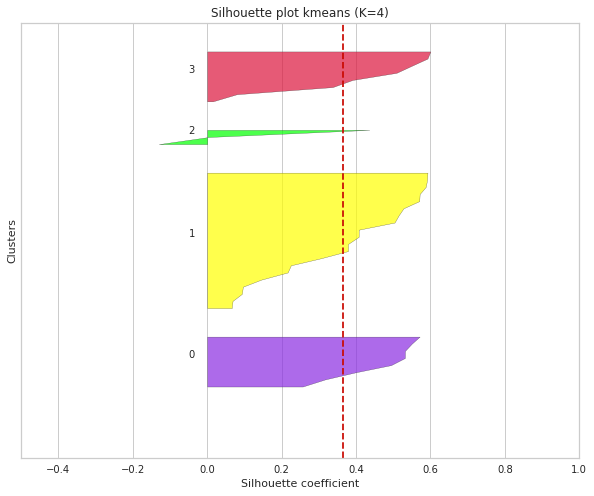

Kmeans silhouette_score 0.3661115156193254
Locations in cluster 0: 8
Locations in cluster 1: 20
Locations in cluster 2: 3
Locations in cluster 3: 8

--------------------------------------------------------------------------------------
18: EUW1_6155459687 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [7676.77777778 5650.66666667] of blue team's bottom jungle: 1513.4235451982684 

distance between initial centroid [4000 8750] and final centroid [2843.28571429 8914.14285714] of blue team's top jungle: 1168.3025363006486 

distance between initial centroid [12000  7500] and final centroid [11269.   2992.5] of red team's bottom jungle: 4566.389958161699

distance between initial centroid [ 7750 12000] and final centroid [ 6044.  12479.8] of red team's top jungle: 1772.1862317487964


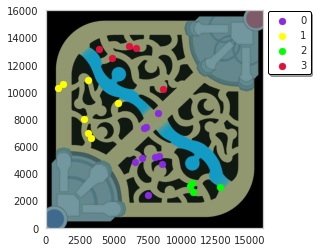

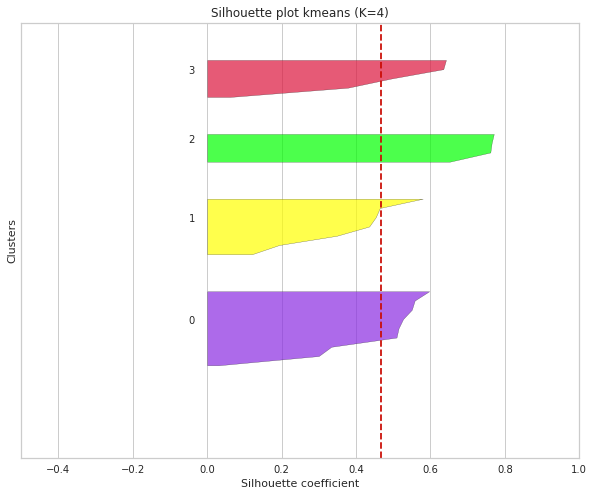

Kmeans silhouette_score 0.46679828307979465
Locations in cluster 0: 9
Locations in cluster 1: 7
Locations in cluster 2: 4
Locations in cluster 3: 5

--------------------------------------------------------------------------------------
19: EUW1_6153946340 - Blue team Defeat
distance between initial centroid [8250 4250] and final centroid [8863.33333333 4515.33333333] of blue team's bottom jungle: 668.2660814043718 

distance between initial centroid [4000 8750] and final centroid [3566.88888889 8499.22222222] of blue team's top jungle: 500.47450324173525 

distance between initial centroid [12000  7500] and final centroid [8519.5 1690.5] of red team's bottom jungle: 6772.30909660804

distance between initial centroid [ 7750 12000] and final centroid [3965.33333333 6214.        ] of red team's top jungle: 6913.862724828848


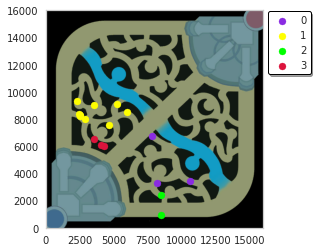

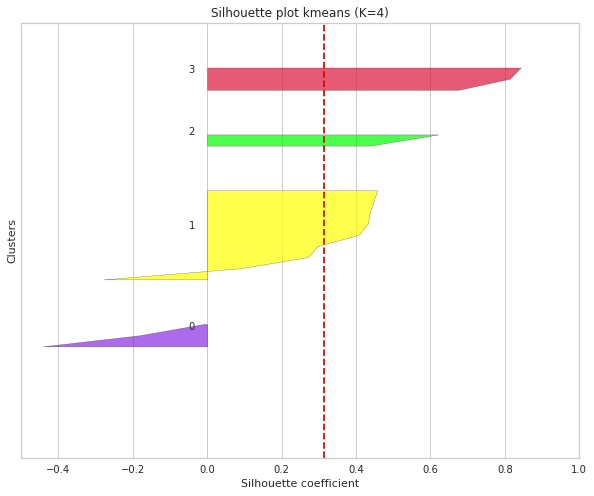

Kmeans silhouette_score 0.31289069419665594
Locations in cluster 0: 3
Locations in cluster 1: 9
Locations in cluster 2: 2
Locations in cluster 3: 3

--------------------------------------------------------------------------------------


In [ ]:
n = 1
npoints = []
scores = []
bb = []
bt = []
rb = []
rt = []
centroid1_distance = []
centroid2_distance = []
centroid3_distance = []
centroid4_distance = []
for game in blueTeamLoses_df.gameId.unique():
    game_df = df.loc[df["gameId"] == game]
    print("{}: {} - {} team Defeat".format(n, game, game_df["team"].unique()[0]))
    npoints.append(game_df.shape[0])
    c1, c2, c3, c4 = clustering(game_df, scores, bb, bt, rb, rt)
    centroid1_distance.append(c1)
    centroid2_distance.append(c2)
    centroid3_distance.append(c3)
    centroid4_distance.append(c4)
    n += 1

In [ ]:
c1_mean_dist = np.mean(np.array(centroid1_distance))
c2_mean_dist = np.mean(np.array(centroid2_distance))
c3_mean_dist = np.mean(np.array(centroid3_distance))
c4_mean_dist = np.mean(np.array(centroid4_distance))
mean = np.mean(np.array(scores))
avPoints = np.mean(np.array(npoints))
avBb = np.sum(np.array(bb))
avBt = np.sum(np.array(bt))
avRb = np.sum(np.array(rb))
avRt = np.sum(np.array(rt))
print("When Red team Wins:")
print(" - Average silhouette score: ", mean)
print(" - Average points: ", avPoints)
print(" - Average points on the blue team's bottom jungle: ", avBb)
print(" - Average points on the blue team's top jungle: ", avBt)
print(" - Average points on the red team's bottom jungle: ", avRb)
print(" - Average points on the red team's top jungle: ", avRt)
print(" - Average distance between centroids of blue team's bottom jungle: ", c1_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c2_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c3_mean_dist)
print(" - Average distance between centroids of blue team's bottom jungle: ", c4_mean_dist)

When Red team Wins:
 - Average silhouette score:  0.44753198012860346
 - Average points:  22.105263157894736
 - Average points on the blue team's bottom jungle:  131
 - Average points on the blue team's top jungle:  178
 - Average points on the red team's bottom jungle:  54
 - Average points on the red team's top jungle:  57
 - Average distance between centroids of blue team's bottom jungle:  1023.1821262791914
 - Average distance between centroids of blue team's bottom jungle:  884.4764885972095
 - Average distance between centroids of blue team's bottom jungle:  4109.985484979885
 - Average distance between centroids of blue team's bottom jungle:  4599.821184813471


distance between initial centroid [8250 4250] and final centroid [7584.43442623 4649.37704918] of blue team's bottom jungle: 776.1955683978282 

distance between initial centroid [4000 8750] and final centroid [2837.0952381  8116.32539683] of blue team's top jungle: 1324.3454941854313 

distance between initial centroid [12000  7500] and final centroid [11043.45588235  4215.        ] of red team's bottom jungle: 3421.432689533025

distance between initial centroid [ 7750 12000] and final centroid [ 5288.18269231 10475.64423077] of red team's top jungle: 2895.5491651223165


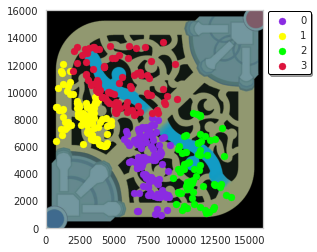

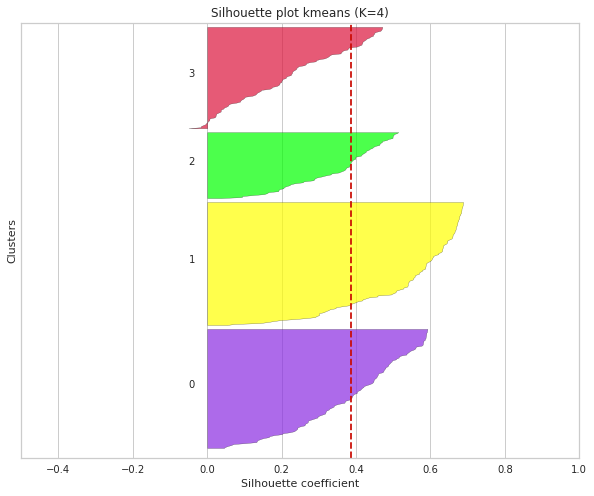

Kmeans silhouette_score 0.38733377534280283
Locations in cluster 0: 122
Locations in cluster 1: 126
Locations in cluster 2: 68
Locations in cluster 3: 104

--------------------------------------------------------------------------------------


(776.1955683978282, 1324.3454941854313, 3421.432689533025, 2895.5491651223165)

In [ ]:
scores = []
clustering(blueTeamLoses_df, scores)

distance between initial centroid [8250 4250] and final centroid [7695.46222222 4503.96888889] of blue team's bottom jungle: 609.928146182952 

distance between initial centroid [4000 8750] and final centroid [3358.42122186 8750.7266881 ] of blue team's top jungle: 641.5791896787706 

distance between initial centroid [12000  7500] and final centroid [11555.57228916  5188.90361446] of red team's bottom jungle: 2353.440565094341

distance between initial centroid [ 7750 12000] and final centroid [ 7041.41059603 10705.8410596 ] of red team's top jungle: 1475.4478325016873


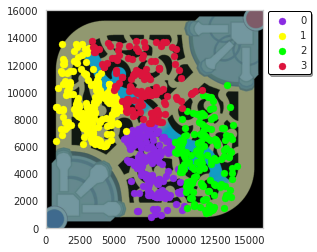

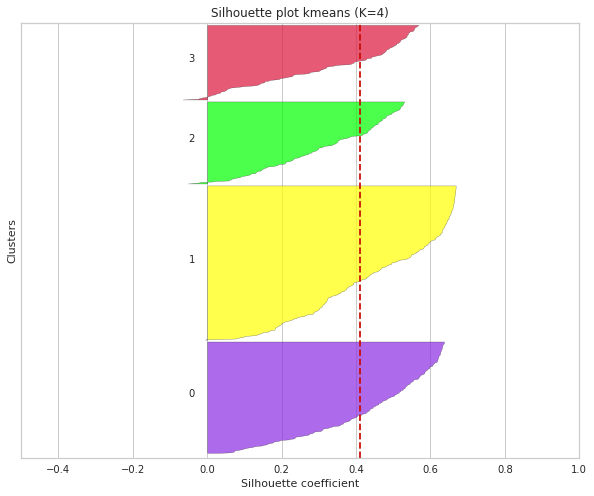

Kmeans silhouette_score 0.41154255418784313
Locations in cluster 0: 225
Locations in cluster 1: 311
Locations in cluster 2: 166
Locations in cluster 3: 151

--------------------------------------------------------------------------------------


(609.928146182952, 641.5791896787706, 2353.440565094341, 1475.4478325016873)

In [ ]:
scores = []
clustering(blueTeam_df, scores)